In [4]:
import pandas as pd
from datetime import datetime
from sklearn.model_selection import train_test_split

from fbprophet import Prophet
from fbprophet.plot import add_changepoints_to_plot
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.ticker import MaxNLocator

from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score

In [78]:
# Import data
df = pd.read_csv('../content/drive/My Drive/Dataset/S&P500-Jan2010-to-Dec2019.csv')
#df= pd.read_csv('../content/drive/My Drive/Dataset/AMD-Jan2010-to-Dec2019.csv')

#df = pd.read_csv('../content/drive/My Drive/Dataset/S&P500-Jan2010-to-May2020.csv')
#df = pd.read_csv('../content/drive/My Drive/Dataset/AMD-10.5YEAR.csv')

In [75]:
# The normal train:test split
# 90% train 10% test - train from 2010-01-04 to 2018-12-28, test from 2018-12-31 to 2019-12-30
# covid-19 - train from 2010-01-04 to 2019-12-31, test from 2020-01-02 to 2020-05-29

X_train, X_test = train_test_split(df, test_size=0.1, random_state=None, shuffle=False)

train = X_train[['Date','Close']]
train = train.copy()

test = X_test[['Date','Close']]
test = test.copy()

# The input to Prophet is always a dataframe with two columns: ds and y. 
# The ds (datestamp) column should be of a format expected by Pandas
# The y column must be numeric
train.columns = ['ds','y']
test.columns = ['ds','y']

train.loc[:,'ds'] = pd.to_datetime(train['ds'])
train[train['ds'].dt.dayofweek < 5]
train['day_of_week'] = train['ds'].dt.dayofweek

test['ds'] = pd.to_datetime(test['ds'])
test[test['ds'].dt.dayofweek < 5]
test['day_of_week'] = test['ds'].dt.dayofweek

In [79]:
# train:test split for other tests
# 2455 for 60-days
# 2412 for 103-days
# 2515 for covid-19 but df must be changed to the 10.5 years one

# if 60 days
period =  88 # the period to predict (this is before removing any weekends and trading holidays)

# if 103 days
#period =  150

# if covid-19
#period =  152

slicing = 2455

train = df[['Date','Close']][:slicing] 
train = train.copy()

test =  df[['Date','Close']][slicing:]
test = test.copy()

# The input to Prophet is always a dataframe with two columns: ds and y. 
# The ds (datestamp) column should be of a format expected by Pandas, ideally YYYY-MM-DD for a date or YYYY-MM-DD HH:MM:SS for a timestamp. 
# The y column must be numeric, and represents the measurement we wish to forecast.
train.columns = ['ds','y']
test.columns = ['ds','y']

train.loc[:,'ds'] = pd.to_datetime(train['ds'])
train[train['ds'].dt.dayofweek < 5]
train['day_of_week'] = train['ds'].dt.dayofweek

test['ds'] = pd.to_datetime(test['ds'])
test[test['ds'].dt.dayofweek < 5]
test['day_of_week'] = test['ds'].dt.dayofweek

In [76]:
# Parameters of FB Prophet
# To create future dataframe where it will make a prediction
period =  365 + 2
# depends on test set 1 year = 365 days for 252 trading days 

In [9]:
#@title Performance Metrics: MAE, MSE, RMSE, R2, MAPE and Generate Table
def calculateMAE(train, test,train_and_test,forecast):
  train_mae = mean_absolute_error(train.loc[:,'y'], forecast.loc[:train.shape[0]-1, 'yhat'])
  test_mae = mean_absolute_error(test.loc[:,'y'], forecast.loc[train.shape[0]:, 'yhat'])
  whole_mae = mean_absolute_error(train_and_test.loc[:,'y'], forecast.loc[:, 'yhat'])

  train_mae = str(round(train_mae, 2))
  test_mae = str(round(test_mae, 2))
  whole_mae = str(round(whole_mae, 2))

  return train_mae,test_mae, whole_mae

def calculateMSE(train, test,train_and_test,forecast):
  train_mse = mean_squared_error(train.loc[:,'y'], forecast.loc[:train.shape[0]-1, 'yhat'])
  test_mse = mean_squared_error(test.loc[:,'y'], forecast.loc[train.shape[0]:, 'yhat'])
  whole_mse = mean_squared_error(train_and_test.loc[:,'y'], forecast.loc[:, 'yhat'])

  train_mse = str(round(train_mse, 2))
  test_mse = str(round(test_mse, 2))
  whole_mse = str(round(whole_mse, 2))

  return train_mse,test_mse, whole_mse

def calculateRMSE(train, test,train_and_test,forecast):
  train_rmse = mean_squared_error(train.loc[:,'y'], forecast.loc[:train.shape[0]-1, 'yhat'],squared=False)
  test_rmse = mean_squared_error(test.loc[:,'y'], forecast.loc[train.shape[0]:, 'yhat'],squared=False)
  whole_rmse = mean_squared_error(train_and_test.loc[:,'y'], forecast.loc[:, 'yhat'],squared=False)

  train_rmse = str(round(train_rmse, 2))
  test_rmse = str(round(test_rmse, 2))
  whole_rmse = str(round(whole_rmse, 2))

  return train_rmse,test_rmse,whole_rmse

def calculateR2(train, test,train_and_test,forecast):
  train_r2 = r2_score(train.loc[:,'y'], forecast.loc[:train.shape[0]-1, 'yhat'])
  test_r2 = r2_score(test.loc[:,'y'], forecast.loc[train.shape[0]:, 'yhat'])
  whole_r2 = r2_score(train_and_test.loc[:,'y'], forecast.loc[:, 'yhat'])

  train_r2 = str(round(train_r2, 2))
  test_r2 = str(round(test_r2, 2))
  whole_r2 = str(round(whole_r2, 2))

  return train_r2,test_r2,whole_r2

def calculateMAPE(train, test,train_and_test,forecast): 
  y_train_true, y_train_pred = train.loc[:,'y'], forecast.loc[:train.shape[0]-1, 'yhat']
  train_mape = np.mean(np.abs((y_train_true - y_train_pred) / y_train_true)) * 100

  y_test_true, y_test_pred = test.loc[:,'y'], forecast.loc[train.shape[0]:, 'yhat']
  test_mape = np.mean(np.abs((y_test_true - y_test_pred) / y_test_true)) * 100

  y_whole_true, y_whole_pred = train_and_test.loc[:,'y'], forecast.loc[:,'yhat']
  whole_mape = np.mean(np.abs((y_whole_true - y_whole_pred) / y_whole_true)) * 100

  train_mape = str(round(train_mape, 2))
  test_mape = str(round(test_mape, 2))
  whole_mape = str(round(whole_mape, 2))

  return train_mape,test_mape, whole_mape


def generate_metrics(train, train_predict, test, test_predict):
  #row
  first_row = ['','MAE', 'MSE', 'RMSE', 'R2','MAPE']

  #header
  first_column = ['Train Set', 'Test Set', 'Whole Set']
  train_mae,test_mae, whole_mae = calculateMAE(train, train_predict, test, test_predict)
  train_mse,test_mse, whole_mse = calculateMSE(train, train_predict, test, test_predict)
  train_rmse,test_rmse,whole_rmse = calculateRMSE(train, train_predict, test, test_predict)
  train_r2,test_r2,whole_r2 = calculateR2(train, train_predict, test, test_predict)
  train_mape,test_mape, whole_mape = calculateMAPE(train, train_predict, test, test_predict)

  return train_mae,test_mae, whole_mae,train_mse,test_mse, whole_mse,train_rmse,test_rmse,whole_rmse,train_r2,test_r2,whole_r2,train_mape,test_mape, whole_mape

In [10]:
#@title Performance Metrics: Calculate Confidence Intervals Accuracy
# This function is to see whether most of the values fall within the 95% confidence range
def calculate_confidence(train, train_predict, test, test_predict):
  train_lower_limit = []
  train_upper_limit = []
  for i in train.values:
    lower = i * 0.975
    upper = i * 1.025
    train_lower_limit.append(lower)
    train_upper_limit.append(upper)

  train_correct = 0
  train_all = 0
  n = 0
  for j in train_predict.values:
    # if the predicted value is within the range then it has correctly predicted within the range
    if j >= train_lower_limit[n] and j <= train_upper_limit[n]:
      train_correct = train_correct + 1
      train_all = train_all + 1
    else:
      train_all = train_all + 1
    n = n +1
  
  # Training accuracy is based on the number of times it correctly predicted within the 95% confidence range
  train_ci_accuracy = train_correct/train_all * 100

  test_lower_limit = []
  test_upper_limit = []
  for k in test.values:
    lower = k * 0.975
    upper = k * 1.025
    test_lower_limit.append(lower)
    test_upper_limit.append(upper)

  test_correct = 0
  test_all = 0
  m = 0
  for l in test_predict.values:
    if l >= test_lower_limit[m] and l <= test_upper_limit[m]:
      test_correct = test_correct + 1
      test_all = test_all + 1
    else:
      test_all = test_all + 1
    m = m +1

  test_ci_accuracy = test_correct/test_all * 100

  overall_ci_accuracy = (train_correct+test_correct)/(train_all+test_all) * 100

  train_ci_accuracy = round(train_ci_accuracy, 2)
  test_ci_accuracy = round(test_ci_accuracy, 2)
  overall_ci_accuracy = round(overall_ci_accuracy, 2)

  plt.figure(figsize=(20,5))
  plt.plot(test_lower_limit, color = 'blue', label='lower')
  plt.plot(test_predict.values, color='red', label='predicted')
  plt.plot(test_upper_limit, color='green', label='upper')
  plt.title('A comparison of the predicted stock price over the 95% Confidence Interval range')
  plt.xlabel('Index')
  plt.ylabel('Stock Price')
  plt.legend()
  plt.show()

  return train_ci_accuracy, test_ci_accuracy, overall_ci_accuracy

In [11]:
#@title Performance Metrics: Calculate Trend Accuracy
# This function is used to calculate whether the model has correctly predicted the correct trend
def calculate_correct_trend(train, train_predict, test, test_predict):
  n = 1
  upward_downward_list = [] # 1 means upward, 0 means downwards
  for i in train.values[1:]:
    ytd_index = n - 1
    ytd = train.values[ytd_index]
    today = train.values[n]
    if (today - ytd) >= 0:
      upward_downward_list.append(1)
    else:
      upward_downward_list.append(0)
    n = n + 1


  m = 1
  predict_upward_downward_list = [] # 1 means upward, 0 means downwards
  for j in train_predict.values[1:]:
    ytd_index = m - 1
    ytd = train_predict.values[ytd_index]
    today = train_predict.values[m]
    if (today - ytd) >= 0:
      predict_upward_downward_list.append(1)
    else:
      predict_upward_downward_list.append(0)
    m = m + 1

  train_correct = 0
  train_all = 0
  for k in range(len(upward_downward_list)):
    # if the correct trend is predicted, the difference is 0 
    if (upward_downward_list[k] - predict_upward_downward_list[k]) == 0: 
      train_correct = train_correct + 1
      train_all = train_all + 1
    else:
      train_all = train_all + 1

  # Training accuracy is based on the number of correct trend predicted over the number of samples
  train_accuracy = train_correct/train_all * 100
  
  test_n = 1
  test_upward_downward_list = [] # 1 means upward, 0 means downwards
  for i in test.values[1:]:
    ytd_index = test_n - 1
    ytd = test.values[ytd_index]
    today = test.values[test_n]
    if (today - ytd) >= 0:
      test_upward_downward_list.append(1)
    else:
      test_upward_downward_list.append(0)
    test_n = test_n + 1


  test_m = 1
  test_predict_upward_downward_list = [] # 1 means upward, 0 means downwards
  for j in test_predict.values[1:]:
    ytd_index = test_m - 1
    ytd = test_predict.values[ytd_index]
    today = test_predict.values[test_m]
    if (today - ytd) >= 0:
      test_predict_upward_downward_list.append(1)
    else:
      test_predict_upward_downward_list.append(0)
    test_m = test_m + 1

  test_correct = 0
  test_all = 0
  for i in range(len(test_predict_upward_downward_list)):
    if (test_upward_downward_list[i] - test_predict_upward_downward_list[i]) == 0:
      test_correct = test_correct + 1
      test_all = test_all + 1
    else:
      test_all = test_all + 1

  test_accuracy = test_correct/test_all * 100
  overall_accuracy = (train_correct + test_correct)/(train_all + test_all) * 100

  train_accuracy = round(train_accuracy, 2)
  test_accuracy = round(test_accuracy, 2)
  overall_accuracy = round(overall_accuracy, 2)
 
  return train_accuracy,test_accuracy,overall_accuracy

In [72]:
# Fit Prophet and make predictions based on the period specified on the future dataframe

def fit_custom_prophet(train, test ,n_changepoints,changepoint_range,changepoint_prior_scale,name,seasonality_period,fourier_order,period):
  # for default hyperparameters
  # m = Prophet() 
  m = Prophet(n_changepoints=n_changepoints,changepoint_range=changepoint_range,changepoint_prior_scale=changepoint_prior_scale)

  # Custom seasonality 
  m.add_seasonality(name=name, period=seasonality_period, fourier_order=fourier_order)

  m.fit(train)

  # Create dataframe with the dates we want to predict
  future = m.make_future_dataframe(periods=period)

  # Eliminate weekend from future dataframe
  future['day'] = future['ds'].dt.weekday
  future = future[future['day']<5]

  # Remove trading holidays from future dataframe so it will not make a prediction on that date
  trading_holidays = np.array([
                             '2010-01-01', '2010-01-18','2010-02-15','2010-04-02','2010-05-31','2010-07-05','2010-09-06','2010-11-25','2010-12-24',
                             '2011-01-02','2011-01-17','2011-02-21','2011-04-22','2011-05-30','2011-07-04','2011-09-05','2011-11-24','2011-12-26',
                             '2012-01-02','2012-01-16','2012-02-20','2012-04-06','2012-05-28','2012-07-04','2012-09-03','2012-11-22','2012-12-25',
                             '2013-01-01','2013-01-21','2013-02-18','2013-03-29','2013-05-27','2013-07-04','2013-09-02','2013-11-28','2013-12-25',
                             '2014-01-01','2014-01-20','2014-02-17','2014-04-18','2014-05-26','2014-07-04','2014-09-01','2014-11-27','2014-12-25',
                             '2015-01-01','2015-01-19','2015-02-16','2015-04-03','2015-05-25','2015-07-03','2015-09-07','2015-11-26','2015-12-25',
                             '2016-01-01','2016-01-18','2016-02-15','2016-03-25','2016-05-30','2016-07-04','2016-09-05','2016-11-24','2016-12-26',
                             '2017-01-02','2017-01-16','2017-02-20','2017-04-14','2017-05-29','2017-07-04','2017-09-04','2017-11-23','2017-12-25',
                             '2018-01-01','2018-01-15','2018-02-19','2018-03-30','2018-05-28','2018-07-04','2018-09-03','2018-11-22','2018-12-05','2018-12-25',
                             '2019-01-01','2019-01-21','2019-02-18','2019-04-19','2019-05-27','2019-07-04','2019-09-02','2019-11-28','2019-12-25',
                             '2020-01-01','2020-01-20','2020-02-17','2020-04-10','2020-05-25','2020-07-03'
  ])

  for i in trading_holidays:
    future = future.drop(future[future['ds'] == str(i)].index)

  # Predict
  forecast = m.predict(future)
  forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']]

  print('This forecast is based on the following parameters:')
  print('Number of changepoints = ' + str(n_changepoints))
  print('Changepoint range = ' + str(changepoint_range))
  print('Changepoint prior scale = ' + str(changepoint_prior_scale))
  print('Seasonality type = ' + name)
  print('Seasonality period = ' + str(seasonality_period))
  print('Fourier order = ' + str(fourier_order))
  print('Forecast period = ' + str(period))


  m.plot(forecast)

  plt.figure(figsize=(20,5))
  plt.title("Stock Price Prediction using the Facebook Prophet (Testing)")
  plt.xlabel("Date")
  plt.ylabel("Close Stock Price")
  plt.plot(test.loc[:,'ds'],test.loc[:,'y'], color="blue" , label="actual")
  plt.plot(forecast.loc[train.shape[0]:, 'ds'],forecast.loc[train.shape[0]:, 'yhat'], color="orange" , label="predicted")
  plt.show()

  train_and_test_concat = [train, test]
  train_and_test = pd.concat(train_and_test_concat)

  print('\CHANGEPOINTS PLOT\n')
  from fbprophet.plot import add_changepoints_to_plot
  fig = m.plot(forecast)
  a = add_changepoints_to_plot(fig.gca(), m, forecast)

  print(a)

  train_mae,test_mae, whole_mae,train_mse,test_mse, whole_mse,train_rmse,test_rmse,whole_rmse,train_r2,test_r2,whole_r2,train_mape,test_mape, whole_mape = generate_metrics(train,test,train_and_test,forecast)

  train_accuracy,test_accuracy,overall_accuracy = calculate_correct_trend(train.loc[:,'y'], forecast.loc[:train.shape[0]-1, 'yhat'], test.loc[:,'y'], forecast.loc[train.shape[0]:, 'yhat'])
  train_ci_accuracy,test_ci_accuracy,overall_ci_accuracy = calculate_confidence(train.loc[:,'y'], forecast.loc[:train.shape[0]-1, 'yhat'], test.loc[:,'y'], forecast.loc[train.shape[0]:, 'yhat'])

  return forecast, test_mae, test_mse, test_rmse,test_r2,test_mape,test_accuracy,test_ci_accuracy

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


This forecast is based on the following parameters:
Number of changepoints = 25
Changepoint range = 0.8
Changepoint prior scale = 0.05
Seasonality type = montly
Seasonality period = 21
Fourier order = 30
Forecast period = 367


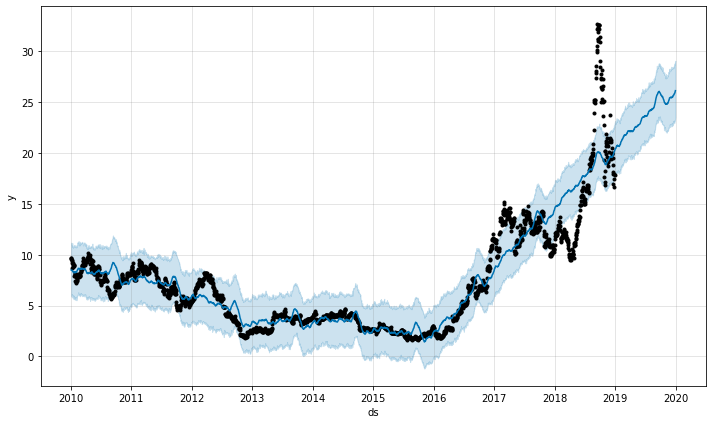

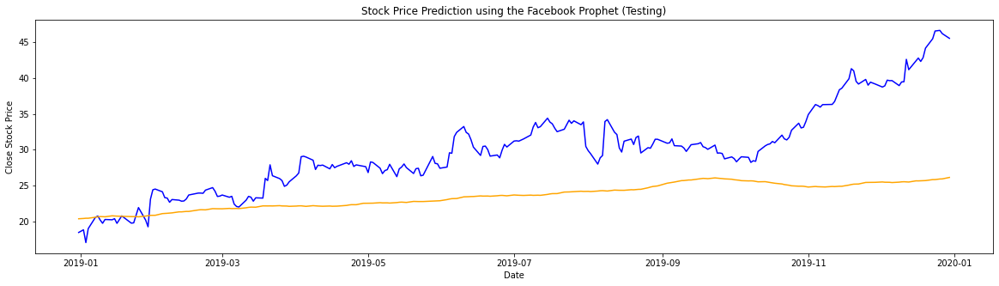

\CHANGEPOINTS PLOT

[[<matplotlib.lines.Line2D object at 0x7f57797a9ef0>], <matplotlib.lines.Line2D object at 0x7f57798202b0>, <matplotlib.lines.Line2D object at 0x7f5779820358>, <matplotlib.lines.Line2D object at 0x7f577980a240>, <matplotlib.lines.Line2D object at 0x7f577980a588>, <matplotlib.lines.Line2D object at 0x7f577980ae48>, <matplotlib.lines.Line2D object at 0x7f577980ab00>, <matplotlib.lines.Line2D object at 0x7f5777870550>, <matplotlib.lines.Line2D object at 0x7f5779820390>, <matplotlib.lines.Line2D object at 0x7f577998b390>, <matplotlib.lines.Line2D object at 0x7f5777870ef0>, <matplotlib.lines.Line2D object at 0x7f57799e1908>, <matplotlib.lines.Line2D object at 0x7f57799e1978>, <matplotlib.lines.Line2D object at 0x7f57799e1160>, <matplotlib.lines.Line2D object at 0x7f57799e1f60>, <matplotlib.lines.Line2D object at 0x7f5779a9e3c8>]


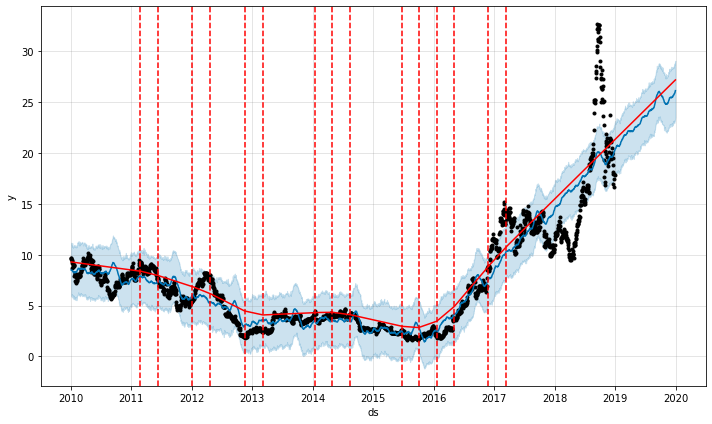

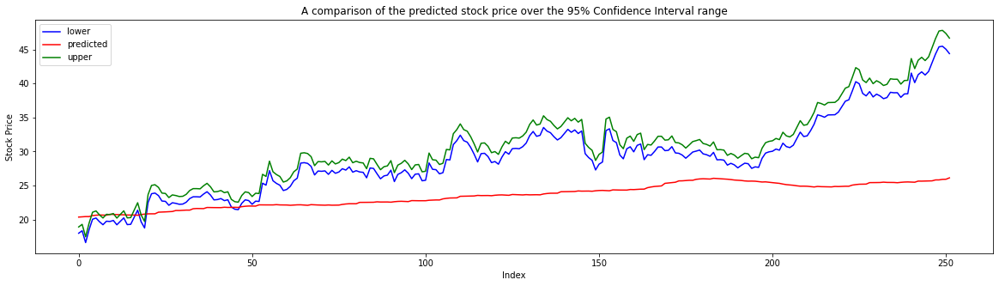

In [48]:
#default

metrics_result = pd.DataFrame(columns = ['MAE','MSE','RMSE','MAPE','R2','CI','Trend']) 

forecast, test_mae, test_mse, test_rmse,test_r2,test_mape,test_accuracy,test_ci_accuracy= fit_custom_prophet(train, test,25,0.8,0.05,'montly',21,30,period)  
df2 = pd.DataFrame({"MAE":[test_mae], 
                    "MSE":[test_mse],
                    "RMSE":[test_rmse],
                    "MAPE":[test_mape],
                    "R2":[test_r2],
                    "CI":[test_ci_accuracy],
                    "Trend":[test_accuracy]}, index = ['test']) 
metrics_result = metrics_result.append(df2)

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.





Test 1



This forecast is based on the following parameters:
Number of changepoints = 328
Changepoint range = 0.7
Changepoint prior scale = 0.05
Seasonality type = d
Seasonality period = e
Fourier order = f
Forecast period = 367


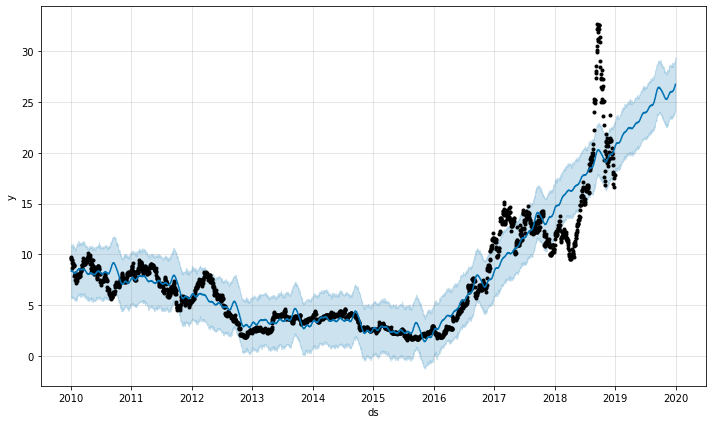

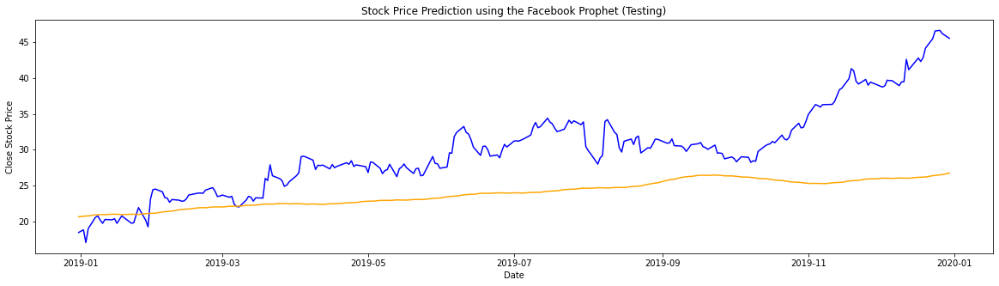

\CHANGEPOINTS PLOT

[[<matplotlib.lines.Line2D object at 0x7f577985bf60>], <matplotlib.lines.Line2D object at 0x7f5779999978>, <matplotlib.lines.Line2D object at 0x7f5777a23198>, <matplotlib.lines.Line2D object at 0x7f5777a23080>, <matplotlib.lines.Line2D object at 0x7f57774dfa58>, <matplotlib.lines.Line2D object at 0x7f57779d91d0>, <matplotlib.lines.Line2D object at 0x7f57799f6cc0>, <matplotlib.lines.Line2D object at 0x7f57778701d0>, <matplotlib.lines.Line2D object at 0x7f577984d978>, <matplotlib.lines.Line2D object at 0x7f57799995f8>, <matplotlib.lines.Line2D object at 0x7f57778ba208>, <matplotlib.lines.Line2D object at 0x7f57778ba438>, <matplotlib.lines.Line2D object at 0x7f57778f9cf8>, <matplotlib.lines.Line2D object at 0x7f57778d1cf8>, <matplotlib.lines.Line2D object at 0x7f57778d1358>, <matplotlib.lines.Line2D object at 0x7f577792c710>, <matplotlib.lines.Line2D object at 0x7f577792c978>, <matplotlib.lines.Line2D object at 0x7f577792c630>, <matplotlib.lines.Line2D object at 0x7f57

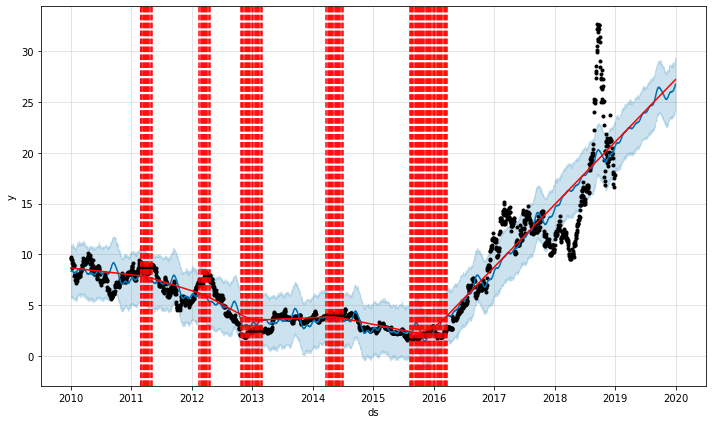

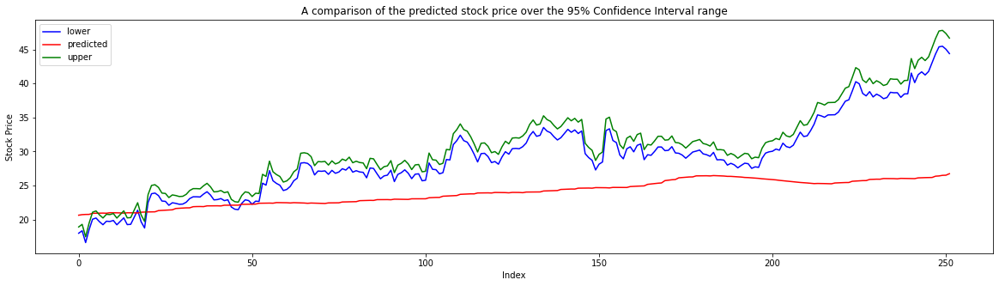

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.





Test 2



This forecast is based on the following parameters:
Number of changepoints = 375
Changepoint range = 0.8
Changepoint prior scale = 0.05
Seasonality type = d
Seasonality period = e
Fourier order = f
Forecast period = 367


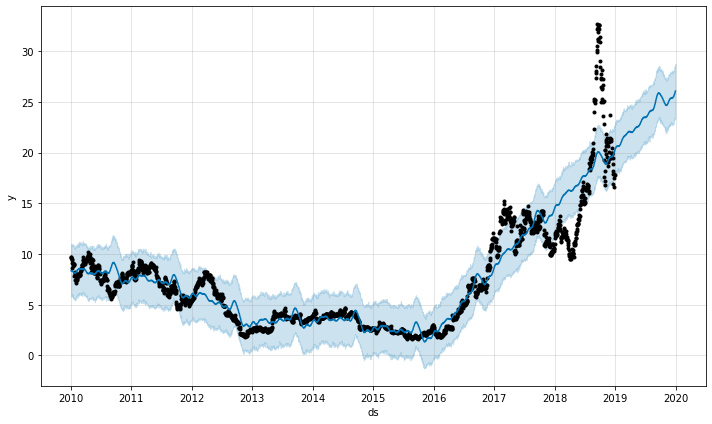

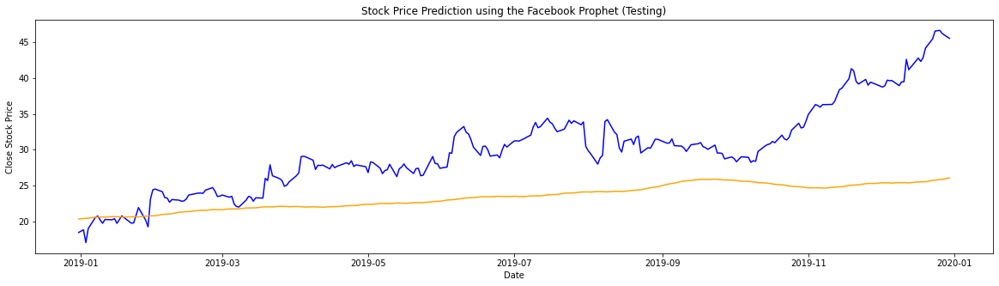

\CHANGEPOINTS PLOT

[[<matplotlib.lines.Line2D object at 0x7f57777dc3c8>], <matplotlib.lines.Line2D object at 0x7f577787b668>, <matplotlib.lines.Line2D object at 0x7f577982e160>, <matplotlib.lines.Line2D object at 0x7f577982eef0>, <matplotlib.lines.Line2D object at 0x7f577982ecf8>, <matplotlib.lines.Line2D object at 0x7f57776b59e8>, <matplotlib.lines.Line2D object at 0x7f57776b5eb8>, <matplotlib.lines.Line2D object at 0x7f57776b5a90>, <matplotlib.lines.Line2D object at 0x7f57798ec0b8>, <matplotlib.lines.Line2D object at 0x7f57777dcbe0>, <matplotlib.lines.Line2D object at 0x7f57798f7a90>, <matplotlib.lines.Line2D object at 0x7f57798f7630>, <matplotlib.lines.Line2D object at 0x7f577751b6d8>, <matplotlib.lines.Line2D object at 0x7f577751bda0>, <matplotlib.lines.Line2D object at 0x7f5779901b70>, <matplotlib.lines.Line2D object at 0x7f57799011d0>, <matplotlib.lines.Line2D object at 0x7f57797f8898>, <matplotlib.lines.Line2D object at 0x7f57797f89b0>, <matplotlib.lines.Line2D object at 0x7f57

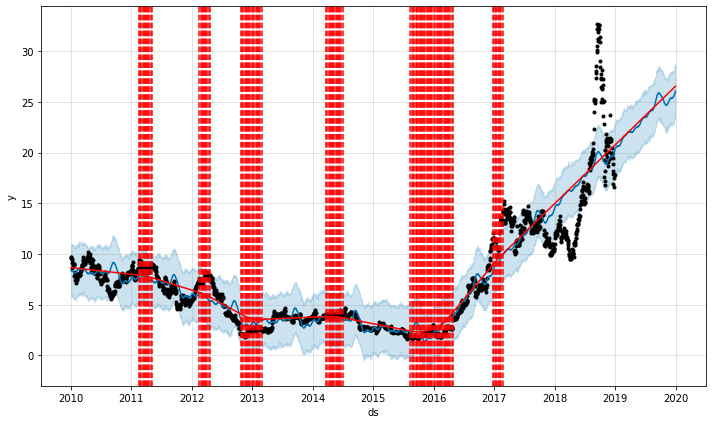

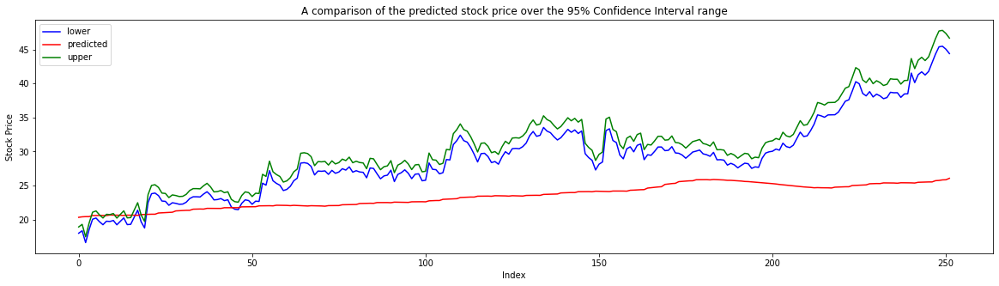

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.





Test 3



This forecast is based on the following parameters:
Number of changepoints = 421
Changepoint range = 0.9
Changepoint prior scale = 0.05
Seasonality type = d
Seasonality period = e
Fourier order = f
Forecast period = 367


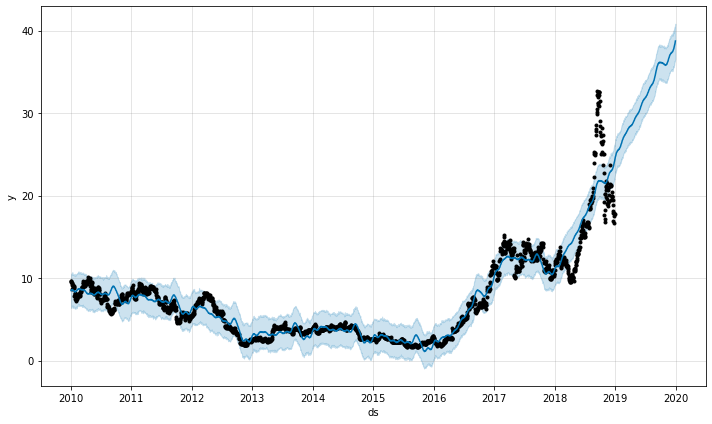

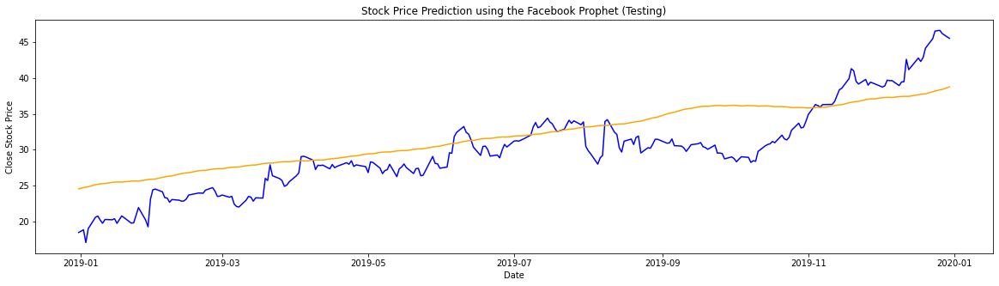

\CHANGEPOINTS PLOT

[[<matplotlib.lines.Line2D object at 0x7f57798e9470>], <matplotlib.lines.Line2D object at 0x7f5777a474e0>, <matplotlib.lines.Line2D object at 0x7f5777633710>, <matplotlib.lines.Line2D object at 0x7f5779890208>, <matplotlib.lines.Line2D object at 0x7f57798900f0>, <matplotlib.lines.Line2D object at 0x7f5779890c50>, <matplotlib.lines.Line2D object at 0x7f57777d6128>, <matplotlib.lines.Line2D object at 0x7f57777d60f0>, <matplotlib.lines.Line2D object at 0x7f57777d6b70>, <matplotlib.lines.Line2D object at 0x7f577797f748>, <matplotlib.lines.Line2D object at 0x7f5777678c18>, <matplotlib.lines.Line2D object at 0x7f577797f358>, <matplotlib.lines.Line2D object at 0x7f577797ff28>, <matplotlib.lines.Line2D object at 0x7f57798c5160>, <matplotlib.lines.Line2D object at 0x7f57798c5588>, <matplotlib.lines.Line2D object at 0x7f57798c5940>, <matplotlib.lines.Line2D object at 0x7f577790d5f8>, <matplotlib.lines.Line2D object at 0x7f577790d630>, <matplotlib.lines.Line2D object at 0x7f57

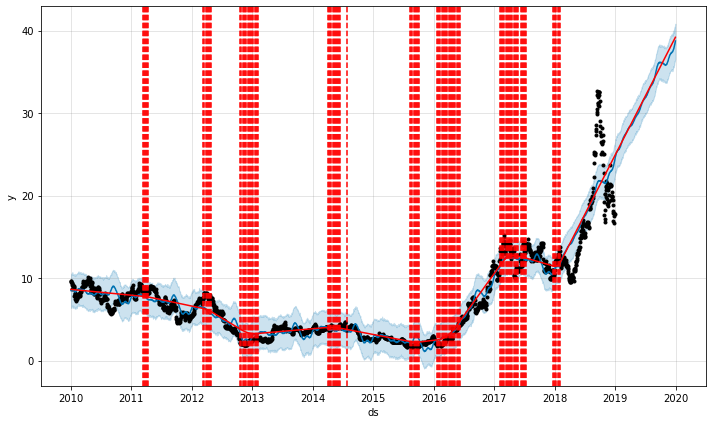

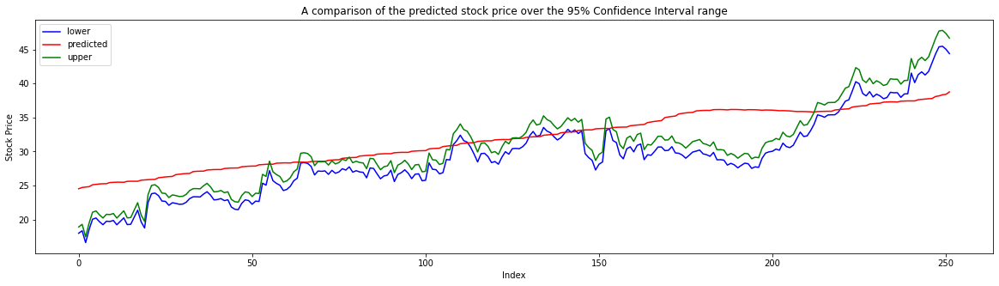

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.





Test 4



This forecast is based on the following parameters:
Number of changepoints = 468
Changepoint range = 1.0
Changepoint prior scale = 0.05
Seasonality type = d
Seasonality period = e
Fourier order = f
Forecast period = 367


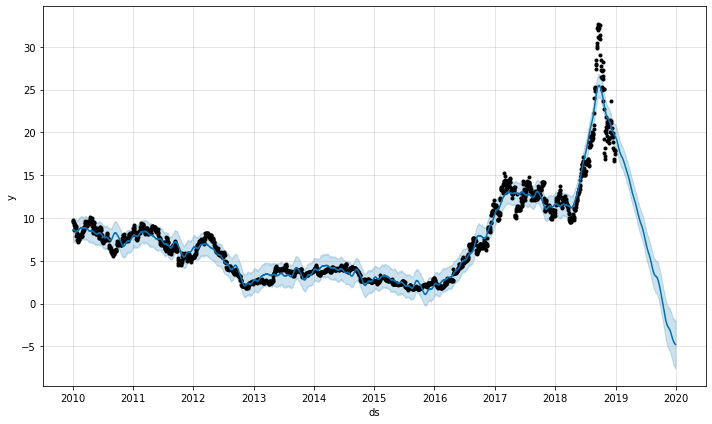

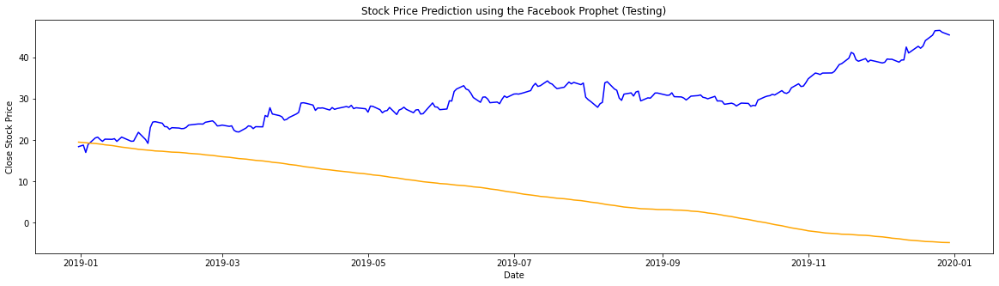

\CHANGEPOINTS PLOT

[[<matplotlib.lines.Line2D object at 0x7f57776722e8>], <matplotlib.lines.Line2D object at 0x7f5777650e48>, <matplotlib.lines.Line2D object at 0x7f5777650080>, <matplotlib.lines.Line2D object at 0x7f577984d0f0>, <matplotlib.lines.Line2D object at 0x7f577984d278>, <matplotlib.lines.Line2D object at 0x7f577984deb8>, <matplotlib.lines.Line2D object at 0x7f577767a2b0>, <matplotlib.lines.Line2D object at 0x7f5777650208>, <matplotlib.lines.Line2D object at 0x7f57799f6c88>, <matplotlib.lines.Line2D object at 0x7f5777a230b8>, <matplotlib.lines.Line2D object at 0x7f5777a23588>, <matplotlib.lines.Line2D object at 0x7f5777a23860>, <matplotlib.lines.Line2D object at 0x7f57774dfba8>, <matplotlib.lines.Line2D object at 0x7f57774df198>, <matplotlib.lines.Line2D object at 0x7f57774df940>, <matplotlib.lines.Line2D object at 0x7f57797eb048>, <matplotlib.lines.Line2D object at 0x7f57797eb518>, <matplotlib.lines.Line2D object at 0x7f57797ebdd8>, <matplotlib.lines.Line2D object at 0x7f57

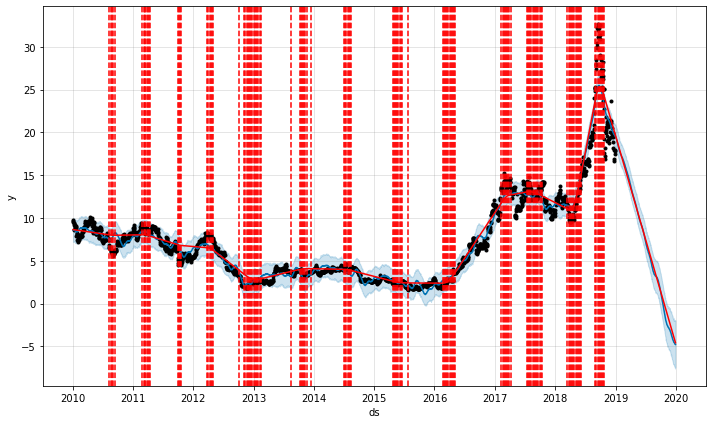

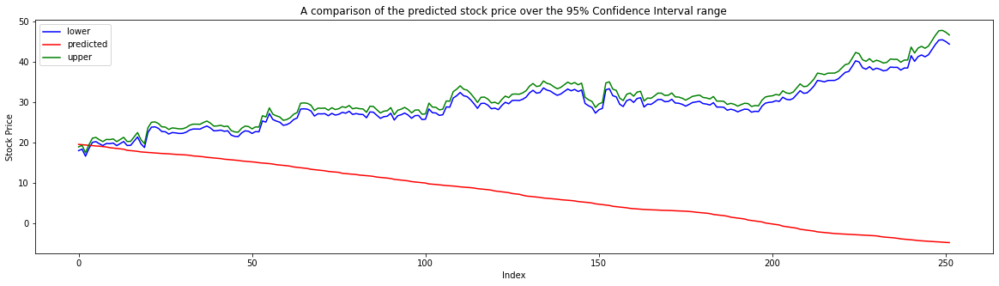

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.





Test 5



This forecast is based on the following parameters:
Number of changepoints = 75
Changepoint range = 0.7
Changepoint prior scale = 0.05
Seasonality type = d
Seasonality period = e
Fourier order = f
Forecast period = 367


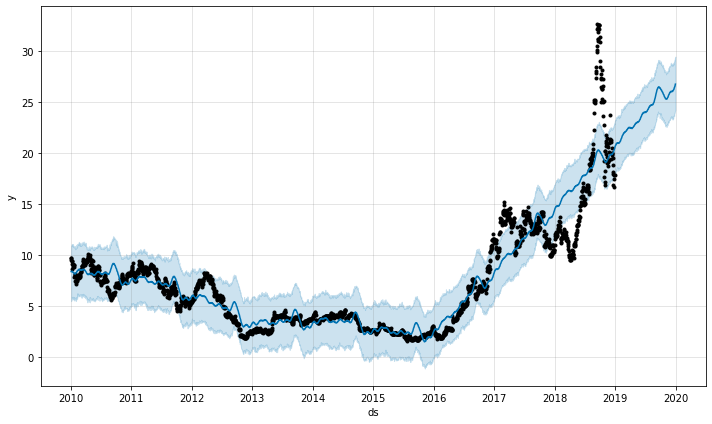

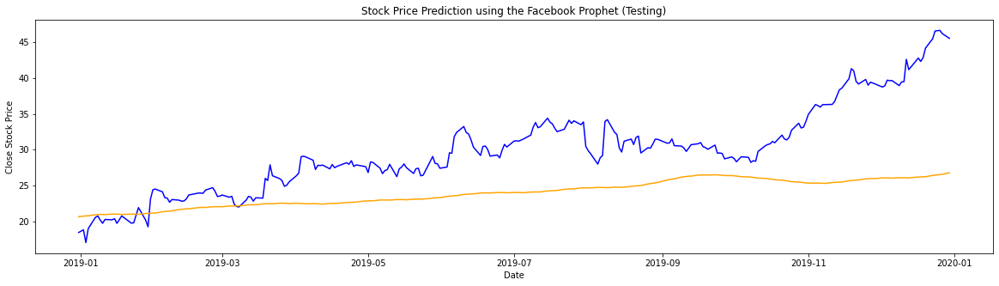

\CHANGEPOINTS PLOT

[[<matplotlib.lines.Line2D object at 0x7f5777672c88>], <matplotlib.lines.Line2D object at 0x7f57799b0d68>, <matplotlib.lines.Line2D object at 0x7f577795e4e0>, <matplotlib.lines.Line2D object at 0x7f57775574e0>, <matplotlib.lines.Line2D object at 0x7f577792e860>, <matplotlib.lines.Line2D object at 0x7f5777678160>, <matplotlib.lines.Line2D object at 0x7f57779daef0>, <matplotlib.lines.Line2D object at 0x7f57776fcb70>, <matplotlib.lines.Line2D object at 0x7f57799a2cc0>, <matplotlib.lines.Line2D object at 0x7f57792ae198>, <matplotlib.lines.Line2D object at 0x7f5779a8ab38>, <matplotlib.lines.Line2D object at 0x7f5779a8a470>, <matplotlib.lines.Line2D object at 0x7f57778c27f0>, <matplotlib.lines.Line2D object at 0x7f577775e080>, <matplotlib.lines.Line2D object at 0x7f57778f0e10>, <matplotlib.lines.Line2D object at 0x7f5779820b70>, <matplotlib.lines.Line2D object at 0x7f5779820a58>, <matplotlib.lines.Line2D object at 0x7f577979dbe0>, <matplotlib.lines.Line2D object at 0x7f57

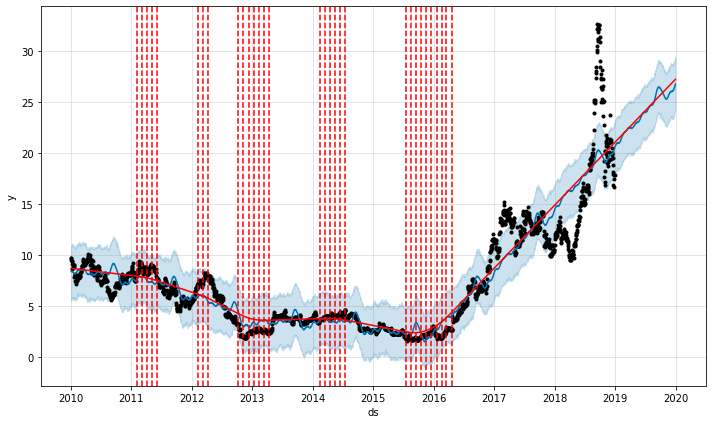

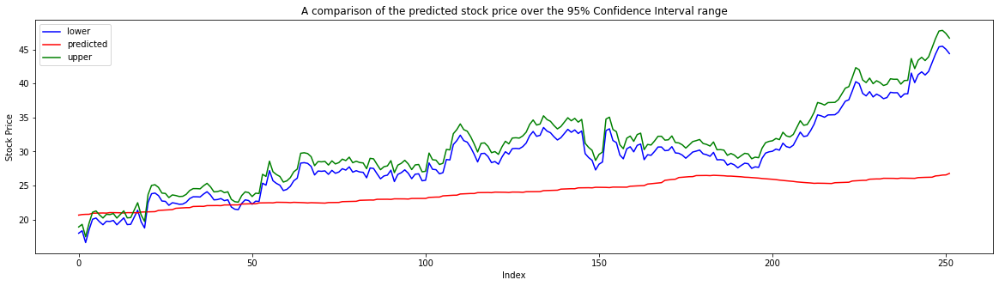

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.





Test 6



This forecast is based on the following parameters:
Number of changepoints = 86
Changepoint range = 0.8
Changepoint prior scale = 0.05
Seasonality type = d
Seasonality period = e
Fourier order = f
Forecast period = 367


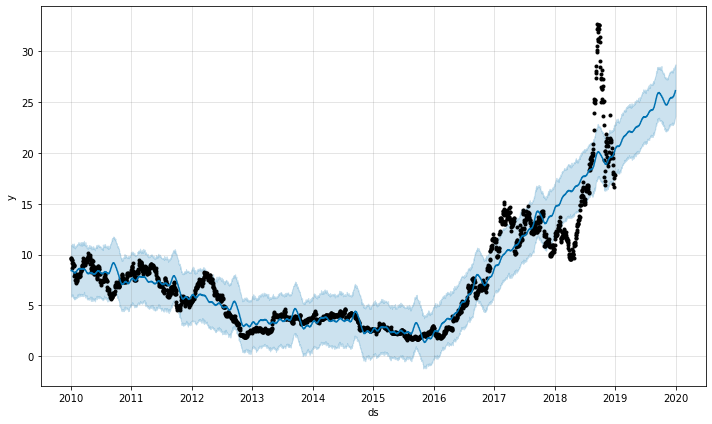

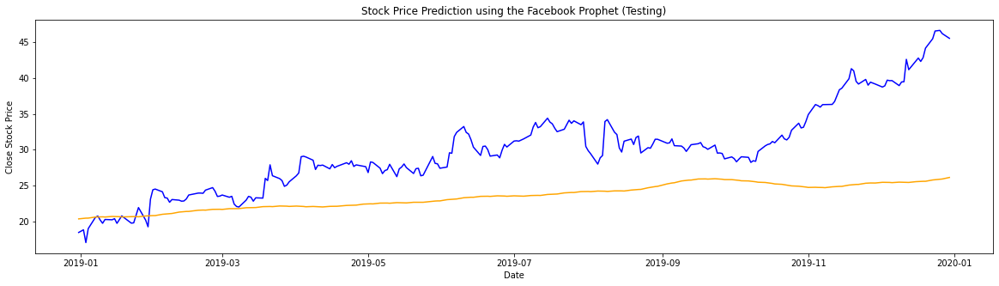

\CHANGEPOINTS PLOT

[[<matplotlib.lines.Line2D object at 0x7f577997e2b0>], <matplotlib.lines.Line2D object at 0x7f5777669208>, <matplotlib.lines.Line2D object at 0x7f57798e32b0>, <matplotlib.lines.Line2D object at 0x7f57798e3780>, <matplotlib.lines.Line2D object at 0x7f57798e3f60>, <matplotlib.lines.Line2D object at 0x7f57775de978>, <matplotlib.lines.Line2D object at 0x7f57775deba8>, <matplotlib.lines.Line2D object at 0x7f5777669c88>, <matplotlib.lines.Line2D object at 0x7f5779a05080>, <matplotlib.lines.Line2D object at 0x7f57775de080>, <matplotlib.lines.Line2D object at 0x7f57799202e8>, <matplotlib.lines.Line2D object at 0x7f5779920748>, <matplotlib.lines.Line2D object at 0x7f5779920ba8>, <matplotlib.lines.Line2D object at 0x7f5779920fd0>, <matplotlib.lines.Line2D object at 0x7f57799244a8>, <matplotlib.lines.Line2D object at 0x7f5779924908>, <matplotlib.lines.Line2D object at 0x7f5779924d68>, <matplotlib.lines.Line2D object at 0x7f5779931208>, <matplotlib.lines.Line2D object at 0x7f57

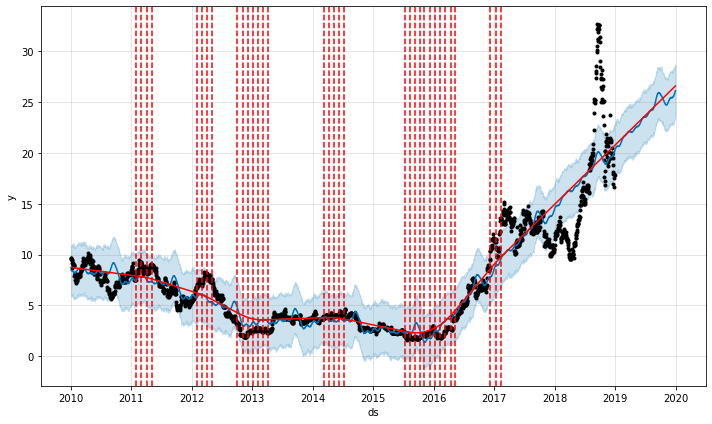

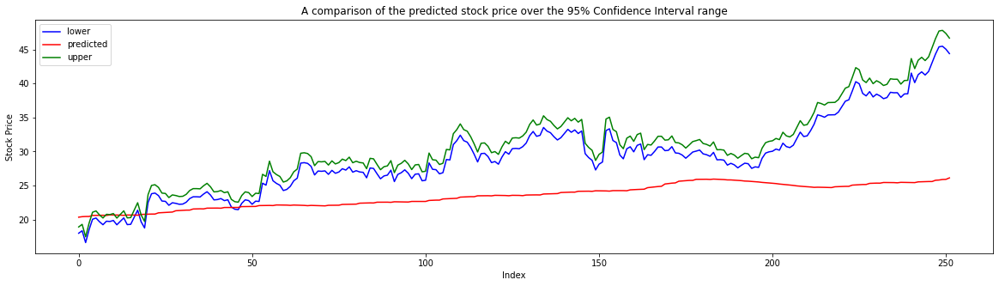

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.





Test 7



This forecast is based on the following parameters:
Number of changepoints = 96
Changepoint range = 0.9
Changepoint prior scale = 0.05
Seasonality type = d
Seasonality period = e
Fourier order = f
Forecast period = 367


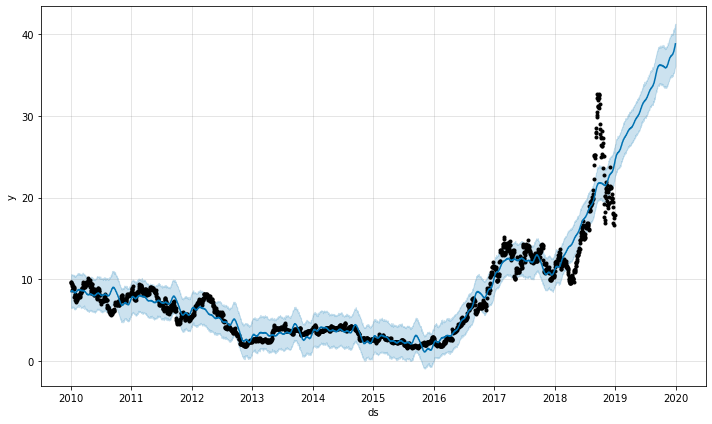

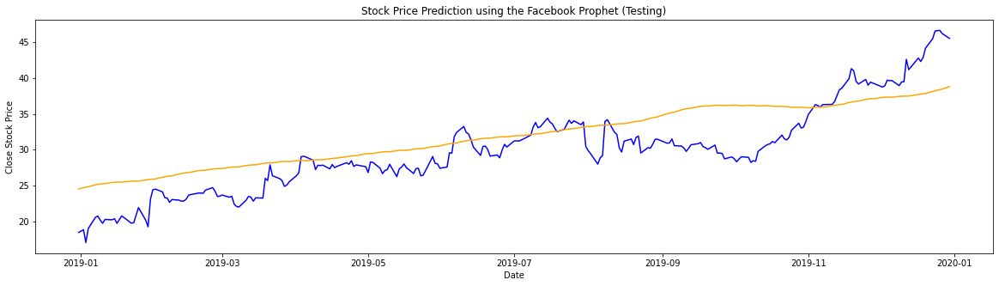

\CHANGEPOINTS PLOT

[[<matplotlib.lines.Line2D object at 0x7f57778c4c50>], <matplotlib.lines.Line2D object at 0x7f57778ca390>, <matplotlib.lines.Line2D object at 0x7f577784d978>, <matplotlib.lines.Line2D object at 0x7f57799ffa20>, <matplotlib.lines.Line2D object at 0x7f57778a3b00>, <matplotlib.lines.Line2D object at 0x7f57775155c0>, <matplotlib.lines.Line2D object at 0x7f5779334710>, <matplotlib.lines.Line2D object at 0x7f57774e7be0>, <matplotlib.lines.Line2D object at 0x7f5779835588>, <matplotlib.lines.Line2D object at 0x7f5777a111d0>, <matplotlib.lines.Line2D object at 0x7f577f83f080>, <matplotlib.lines.Line2D object at 0x7f577787b5f8>, <matplotlib.lines.Line2D object at 0x7f577787b4e0>, <matplotlib.lines.Line2D object at 0x7f57792dfc88>, <matplotlib.lines.Line2D object at 0x7f57779daba8>, <matplotlib.lines.Line2D object at 0x7f5779a4a5f8>, <matplotlib.lines.Line2D object at 0x7f57778c2160>, <matplotlib.lines.Line2D object at 0x7f577792ec50>, <matplotlib.lines.Line2D object at 0x7f57

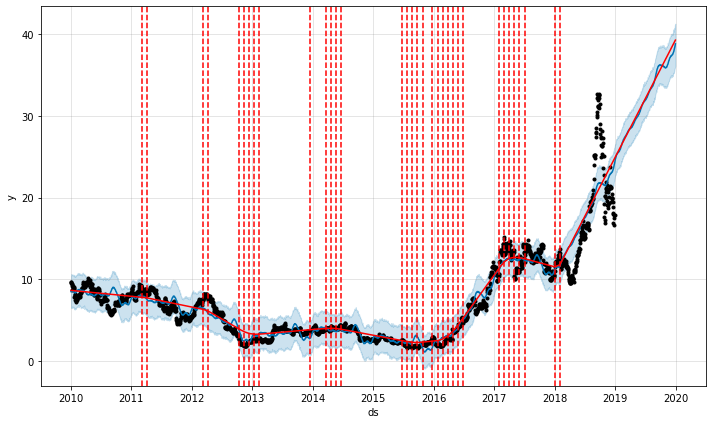

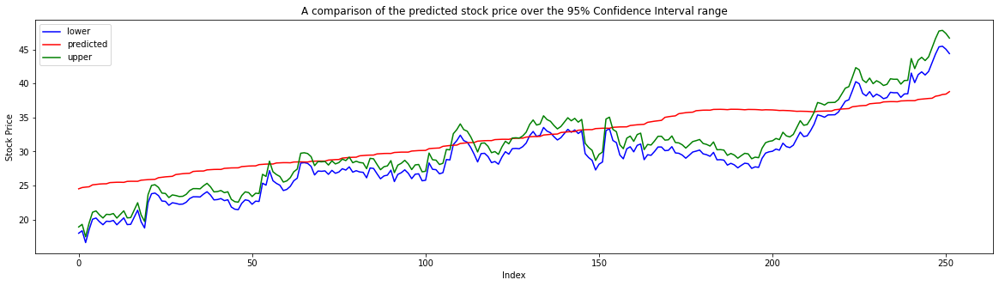

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.





Test 8



This forecast is based on the following parameters:
Number of changepoints = 107
Changepoint range = 1.0
Changepoint prior scale = 0.05
Seasonality type = d
Seasonality period = e
Fourier order = f
Forecast period = 367


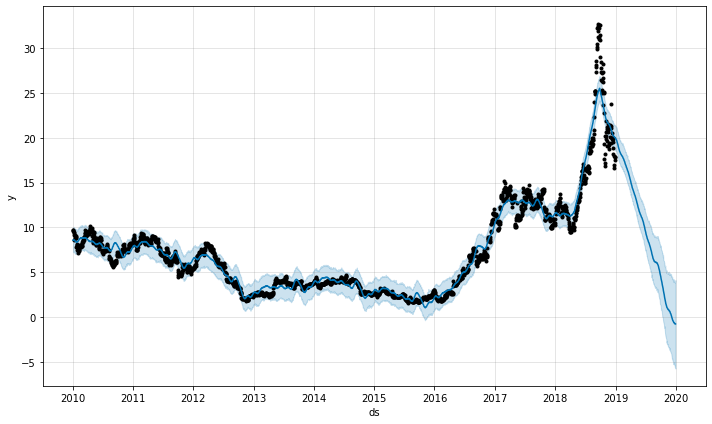

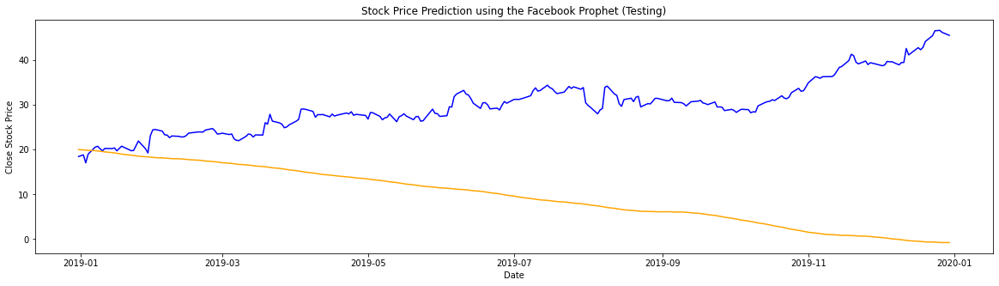

\CHANGEPOINTS PLOT

[[<matplotlib.lines.Line2D object at 0x7f57779667f0>], <matplotlib.lines.Line2D object at 0x7f577772e908>, <matplotlib.lines.Line2D object at 0x7f5779821668>, <matplotlib.lines.Line2D object at 0x7f5779821fd0>, <matplotlib.lines.Line2D object at 0x7f57798212e8>, <matplotlib.lines.Line2D object at 0x7f57798f4f60>, <matplotlib.lines.Line2D object at 0x7f57798f4a20>, <matplotlib.lines.Line2D object at 0x7f5779a9eb38>, <matplotlib.lines.Line2D object at 0x7f57797a0c50>, <matplotlib.lines.Line2D object at 0x7f57798f4828>, <matplotlib.lines.Line2D object at 0x7f5777944f98>, <matplotlib.lines.Line2D object at 0x7f577785cc50>, <matplotlib.lines.Line2D object at 0x7f577785c320>, <matplotlib.lines.Line2D object at 0x7f577785ce10>, <matplotlib.lines.Line2D object at 0x7f57779efa90>, <matplotlib.lines.Line2D object at 0x7f57779efcf8>, <matplotlib.lines.Line2D object at 0x7f57779ef128>, <matplotlib.lines.Line2D object at 0x7f57798b7cf8>, <matplotlib.lines.Line2D object at 0x7f57

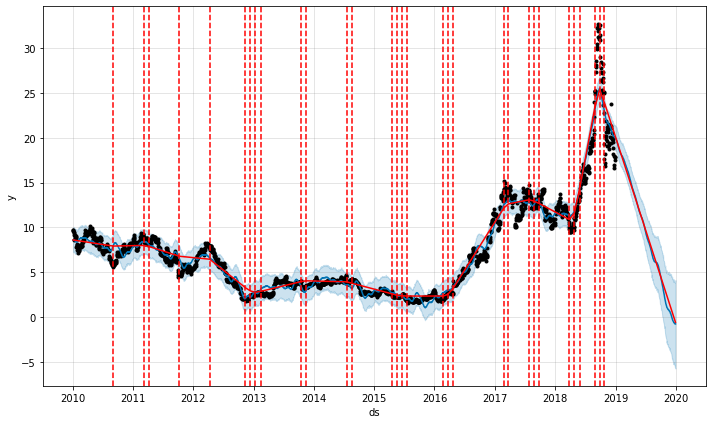

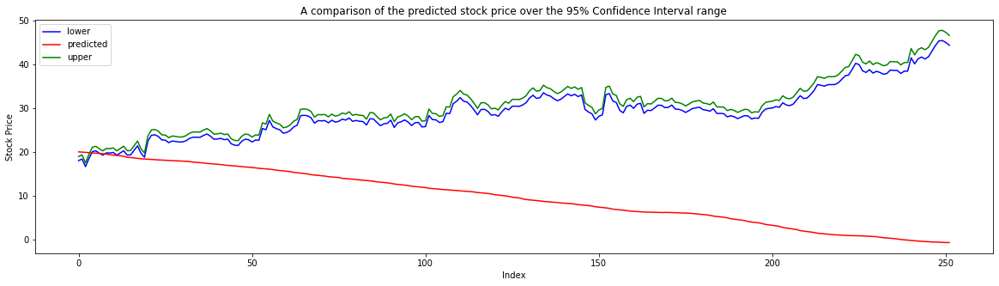

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.





Test 9



This forecast is based on the following parameters:
Number of changepoints = 6
Changepoint range = 0.7
Changepoint prior scale = 0.05
Seasonality type = d
Seasonality period = e
Fourier order = f
Forecast period = 367


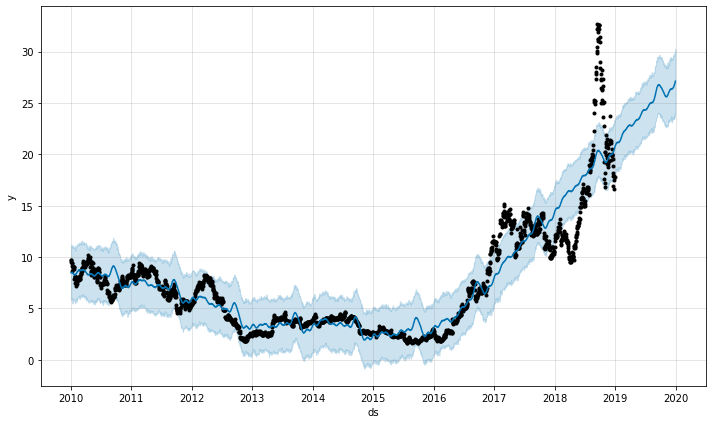

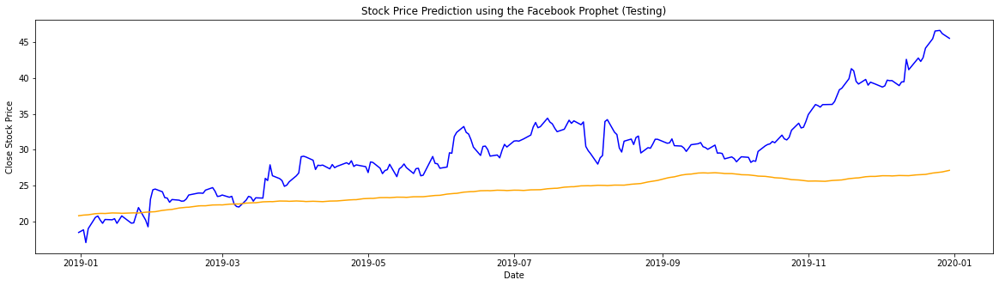

\CHANGEPOINTS PLOT

[[<matplotlib.lines.Line2D object at 0x7f57778709e8>], <matplotlib.lines.Line2D object at 0x7f5777a23358>, <matplotlib.lines.Line2D object at 0x7f5777511940>, <matplotlib.lines.Line2D object at 0x7f57778a3748>, <matplotlib.lines.Line2D object at 0x7f57792af8d0>, <matplotlib.lines.Line2D object at 0x7f5777a68d68>, <matplotlib.lines.Line2D object at 0x7f57774e7390>]


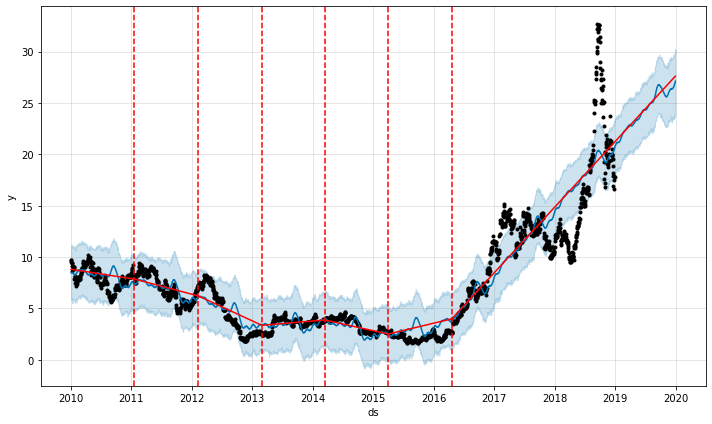

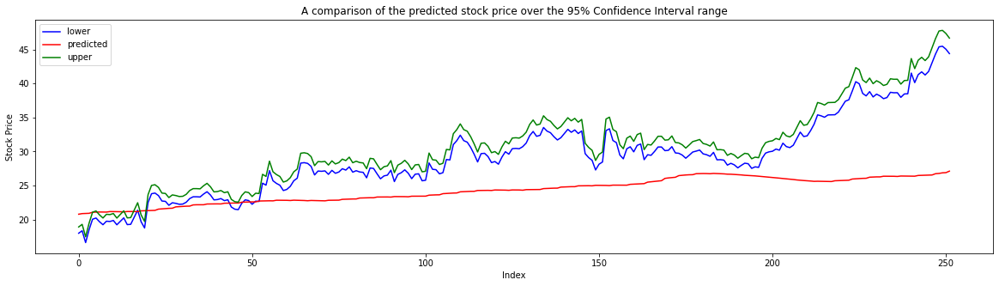

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.





Test 10



This forecast is based on the following parameters:
Number of changepoints = 7
Changepoint range = 0.8
Changepoint prior scale = 0.05
Seasonality type = d
Seasonality period = e
Fourier order = f
Forecast period = 367


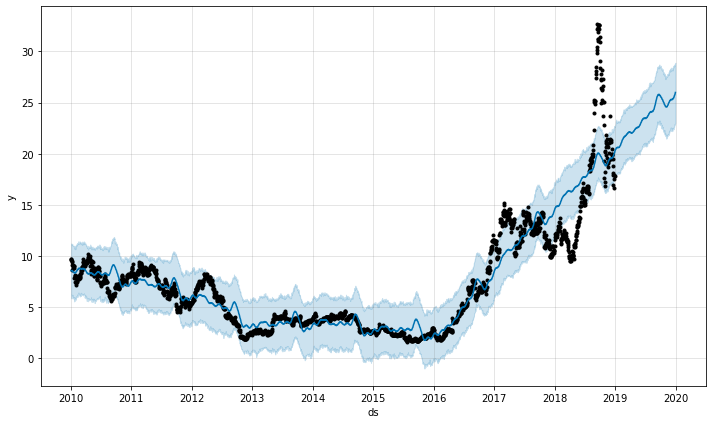

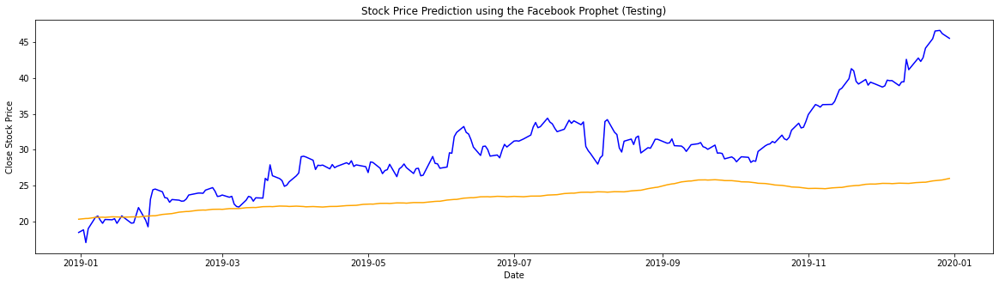

\CHANGEPOINTS PLOT

[[<matplotlib.lines.Line2D object at 0x7f577fab0f60>], <matplotlib.lines.Line2D object at 0x7f57778670f0>, <matplotlib.lines.Line2D object at 0x7f57799c7eb8>, <matplotlib.lines.Line2D object at 0x7f57799c7a90>, <matplotlib.lines.Line2D object at 0x7f57799c79b0>, <matplotlib.lines.Line2D object at 0x7f577764da90>, <matplotlib.lines.Line2D object at 0x7f577764d710>, <matplotlib.lines.Line2D object at 0x7f577764d9e8>]


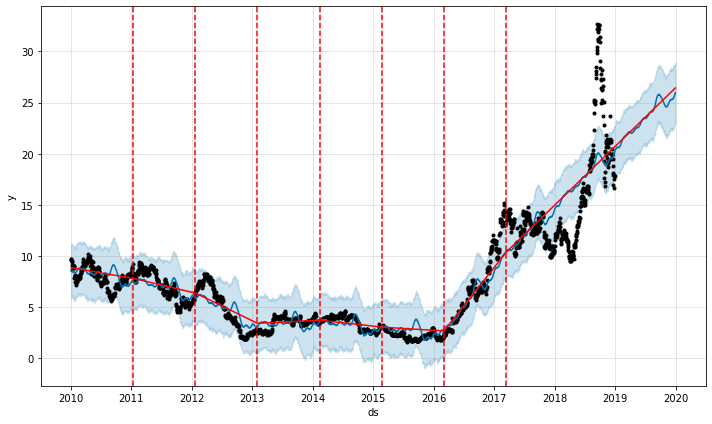

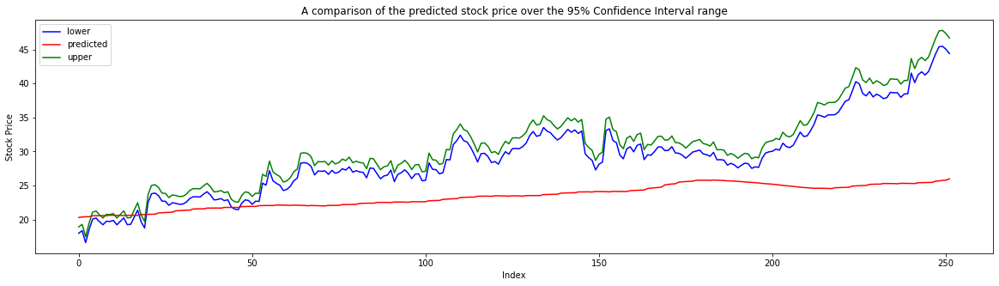

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.





Test 11





This forecast is based on the following parameters:
Number of changepoints = 8
Changepoint range = 0.9
Changepoint prior scale = 0.05
Seasonality type = d
Seasonality period = e
Fourier order = f
Forecast period = 367


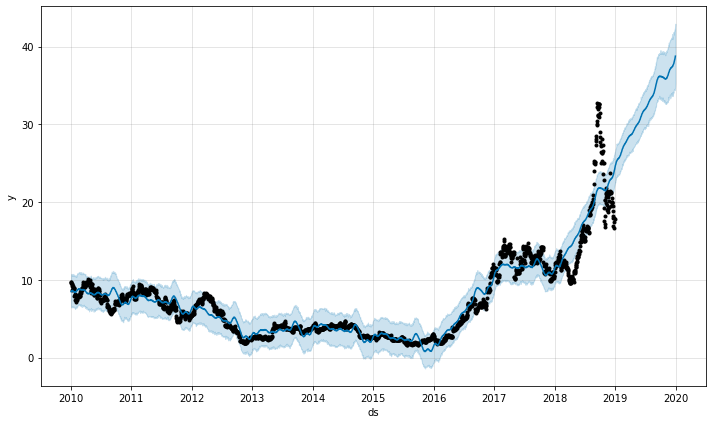

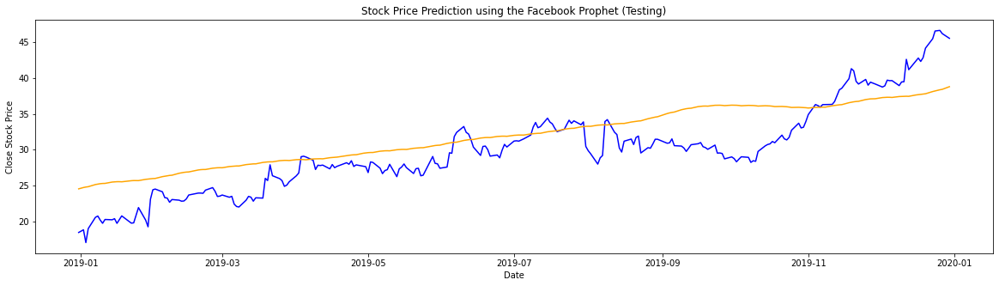

\CHANGEPOINTS PLOT

[[<matplotlib.lines.Line2D object at 0x7f57776fc320>], <matplotlib.lines.Line2D object at 0x7f57798ecd30>, <matplotlib.lines.Line2D object at 0x7f577dea1588>, <matplotlib.lines.Line2D object at 0x7f5777695da0>, <matplotlib.lines.Line2D object at 0x7f57776955c0>, <matplotlib.lines.Line2D object at 0x7f5779835e80>, <matplotlib.lines.Line2D object at 0x7f5779a91b38>, <matplotlib.lines.Line2D object at 0x7f577980a550>]


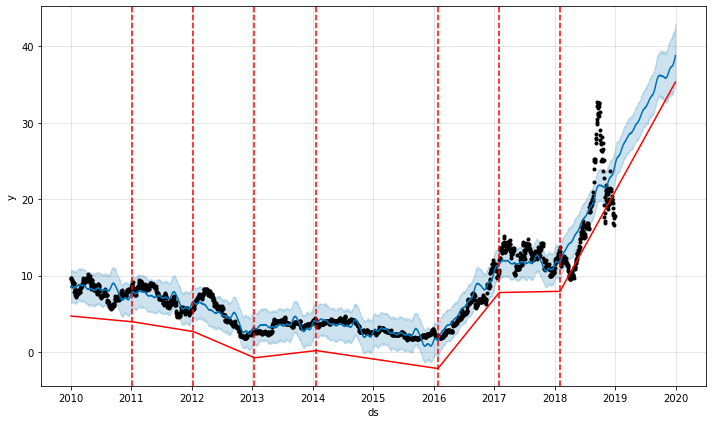

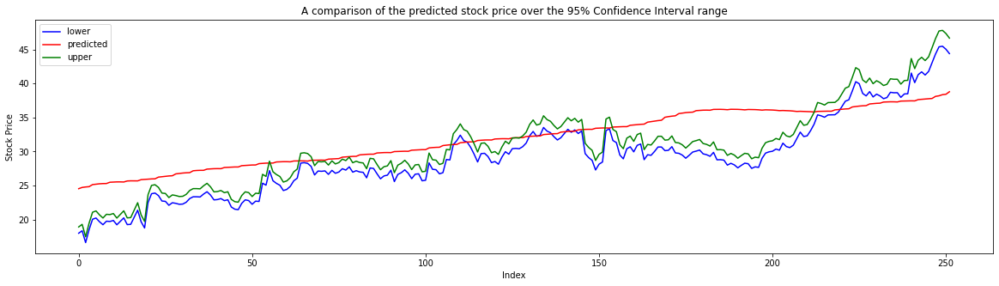

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.





Test 12



This forecast is based on the following parameters:
Number of changepoints = 8
Changepoint range = 1.0
Changepoint prior scale = 0.05
Seasonality type = d
Seasonality period = e
Fourier order = f
Forecast period = 367


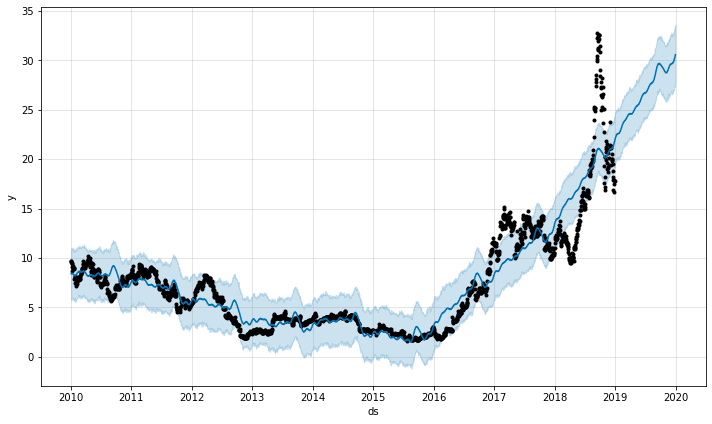

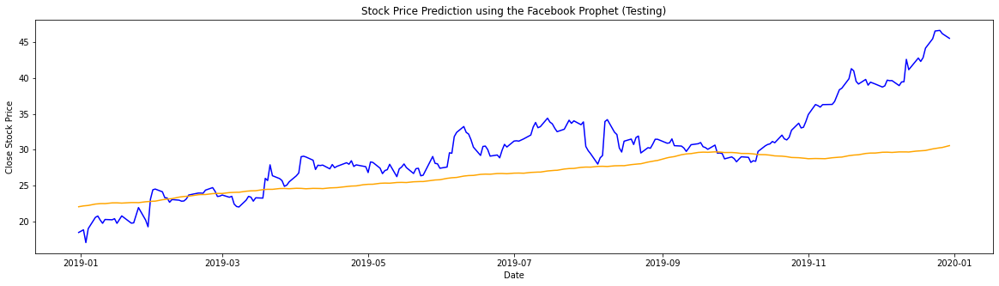

\CHANGEPOINTS PLOT

[[<matplotlib.lines.Line2D object at 0x7f577982e198>], <matplotlib.lines.Line2D object at 0x7f5777a48518>, <matplotlib.lines.Line2D object at 0x7f5777a48dd8>, <matplotlib.lines.Line2D object at 0x7f5777a48c88>, <matplotlib.lines.Line2D object at 0x7f57799a2240>, <matplotlib.lines.Line2D object at 0x7f57799a25c0>, <matplotlib.lines.Line2D object at 0x7f57799a2f28>]


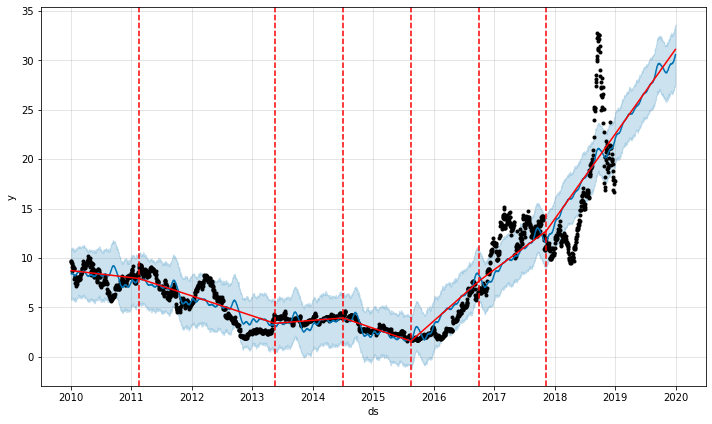

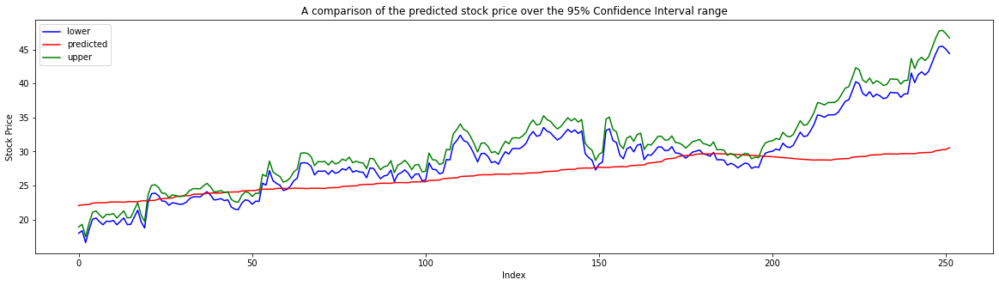

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.





Test 13



This forecast is based on the following parameters:
Number of changepoints = 25
Changepoint range = 0.8
Changepoint prior scale = 0.5
Seasonality type = d
Seasonality period = e
Fourier order = f
Forecast period = 367


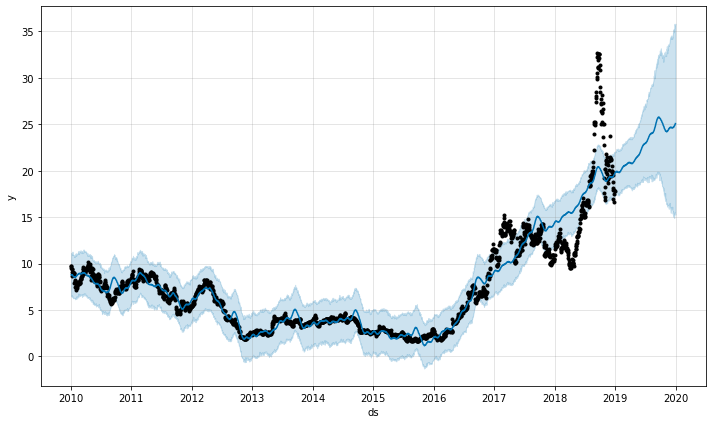

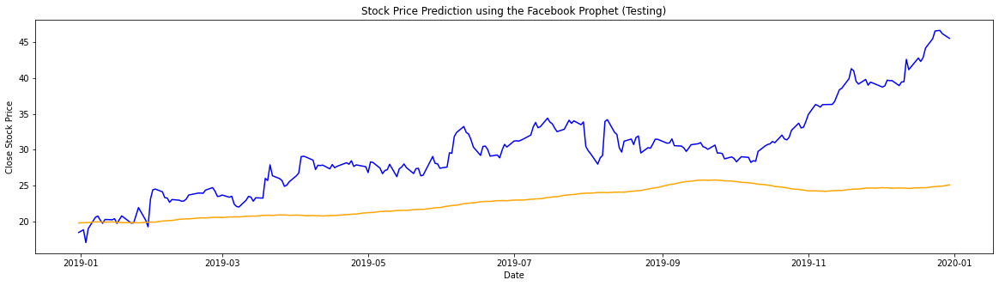

\CHANGEPOINTS PLOT

[[<matplotlib.lines.Line2D object at 0x7f577772ebe0>], <matplotlib.lines.Line2D object at 0x7f577775d0f0>, <matplotlib.lines.Line2D object at 0x7f57792ecfd0>, <matplotlib.lines.Line2D object at 0x7f57792ec438>, <matplotlib.lines.Line2D object at 0x7f57778706a0>, <matplotlib.lines.Line2D object at 0x7f5777870b70>, <matplotlib.lines.Line2D object at 0x7f57774dff28>, <matplotlib.lines.Line2D object at 0x7f57778bab70>, <matplotlib.lines.Line2D object at 0x7f57792ec080>, <matplotlib.lines.Line2D object at 0x7f577996a240>, <matplotlib.lines.Line2D object at 0x7f577792ea90>, <matplotlib.lines.Line2D object at 0x7f5777966fd0>, <matplotlib.lines.Line2D object at 0x7f5777a5e358>, <matplotlib.lines.Line2D object at 0x7f5779901a20>, <matplotlib.lines.Line2D object at 0x7f57797a95c0>, <matplotlib.lines.Line2D object at 0x7f5777549080>, <matplotlib.lines.Line2D object at 0x7f5779292f98>, <matplotlib.lines.Line2D object at 0x7f577790dcc0>, <matplotlib.lines.Line2D object at 0x7f57

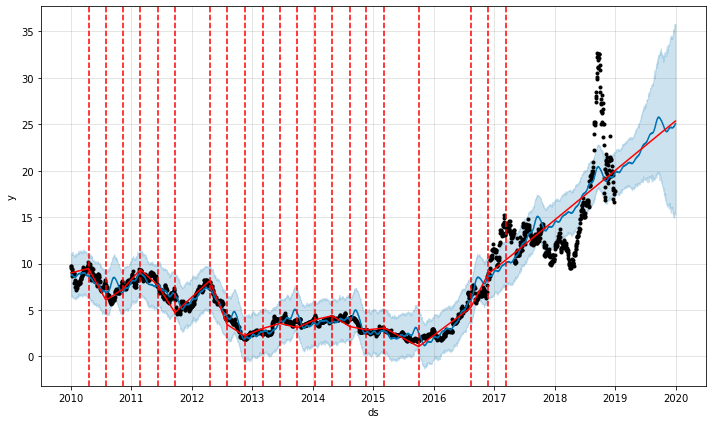

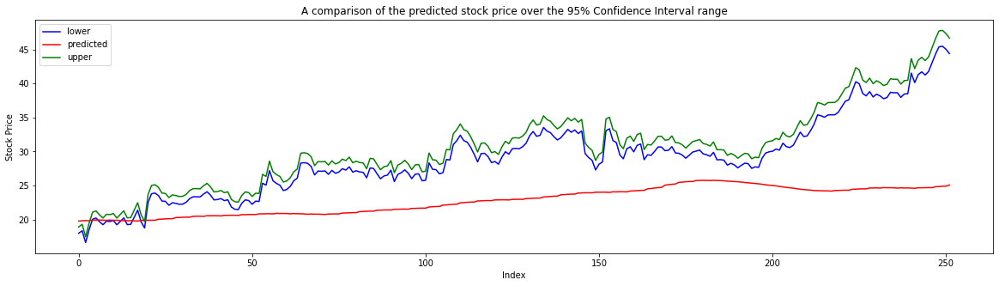

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.





Test 14



This forecast is based on the following parameters:
Number of changepoints = 25
Changepoint range = 0.8
Changepoint prior scale = 1.0
Seasonality type = d
Seasonality period = e
Fourier order = f
Forecast period = 367


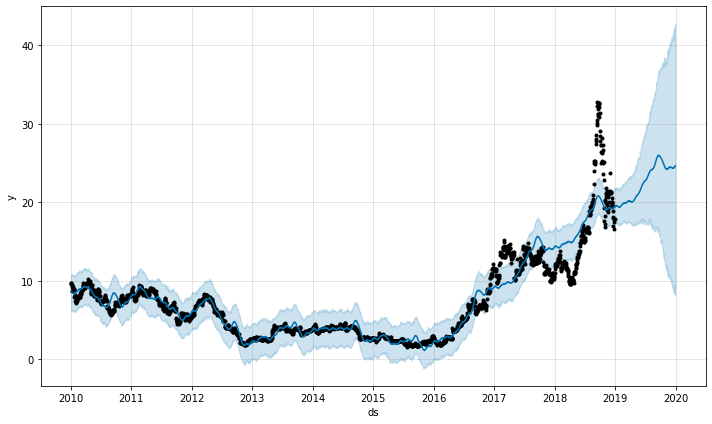

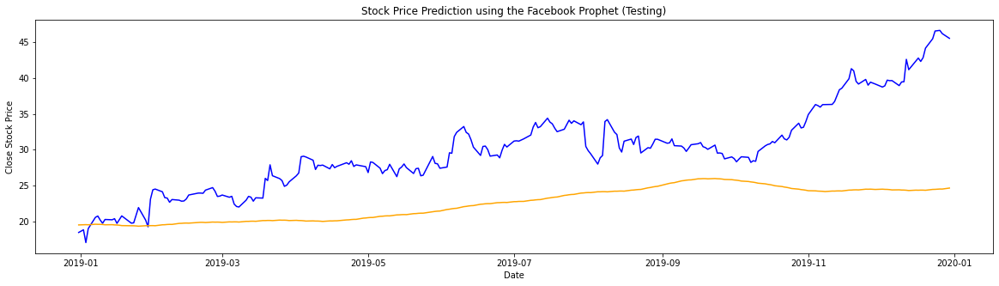

\CHANGEPOINTS PLOT

[[<matplotlib.lines.Line2D object at 0x7f57799723c8>], <matplotlib.lines.Line2D object at 0x7f577f79ff28>, <matplotlib.lines.Line2D object at 0x7f5779847358>, <matplotlib.lines.Line2D object at 0x7f57792df588>, <matplotlib.lines.Line2D object at 0x7f5777a48898>, <matplotlib.lines.Line2D object at 0x7f5777a48400>, <matplotlib.lines.Line2D object at 0x7f5777a48a90>, <matplotlib.lines.Line2D object at 0x7f57799e1550>, <matplotlib.lines.Line2D object at 0x7f57799e1d30>, <matplotlib.lines.Line2D object at 0x7f57799e1c88>, <matplotlib.lines.Line2D object at 0x7f577f79fda0>, <matplotlib.lines.Line2D object at 0x7f5777892ba8>, <matplotlib.lines.Line2D object at 0x7f5777892940>, <matplotlib.lines.Line2D object at 0x7f5777892a90>, <matplotlib.lines.Line2D object at 0x7f57778c8ac8>, <matplotlib.lines.Line2D object at 0x7f57778c8a90>, <matplotlib.lines.Line2D object at 0x7f57778c8470>, <matplotlib.lines.Line2D object at 0x7f57778c8978>, <matplotlib.lines.Line2D object at 0x7f57

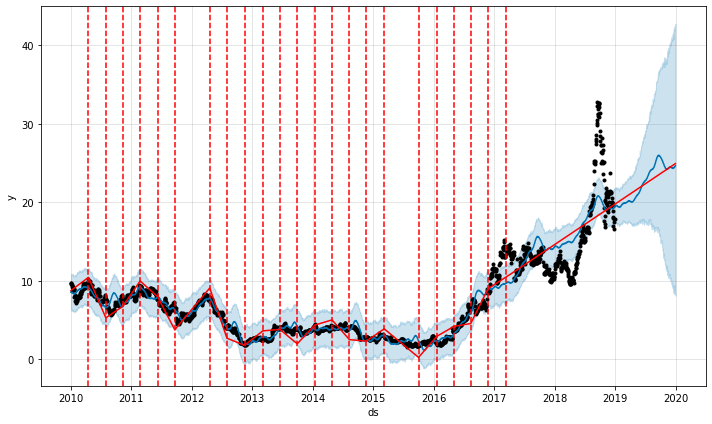

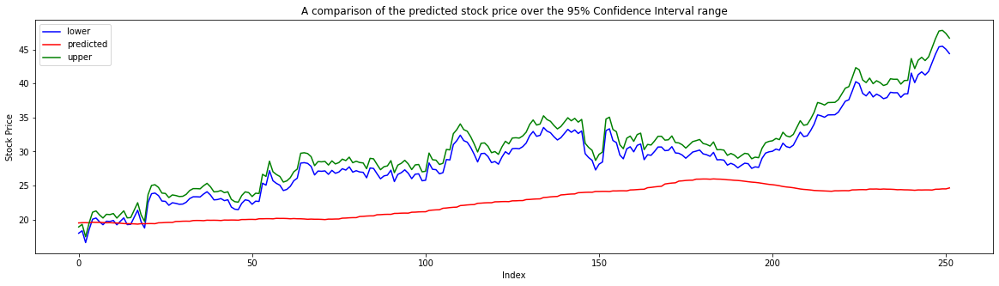

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.





Test 15



This forecast is based on the following parameters:
Number of changepoints = 25
Changepoint range = 0.8
Changepoint prior scale = 1.5
Seasonality type = d
Seasonality period = e
Fourier order = f
Forecast period = 367


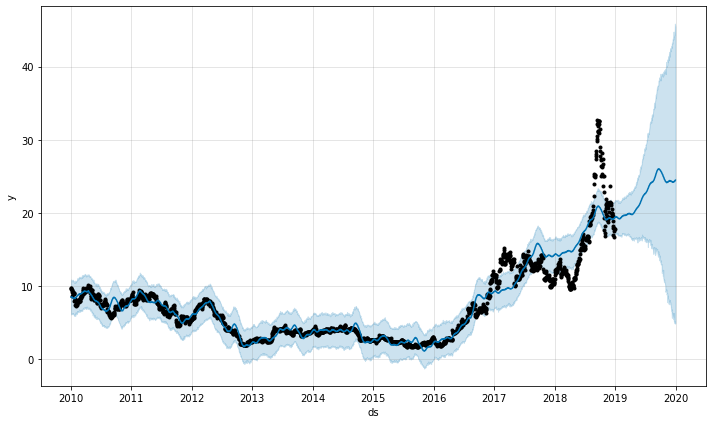

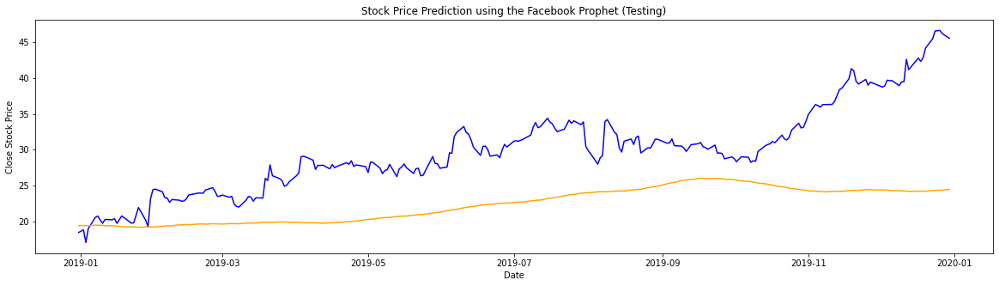

\CHANGEPOINTS PLOT

[[<matplotlib.lines.Line2D object at 0x7f577981b390>], <matplotlib.lines.Line2D object at 0x7f57778373c8>, <matplotlib.lines.Line2D object at 0x7f57793340f0>, <matplotlib.lines.Line2D object at 0x7f57799f6358>, <matplotlib.lines.Line2D object at 0x7f5779847898>, <matplotlib.lines.Line2D object at 0x7f5777963ef0>, <matplotlib.lines.Line2D object at 0x7f5779999320>, <matplotlib.lines.Line2D object at 0x7f5779999be0>, <matplotlib.lines.Line2D object at 0x7f5779999c50>, <matplotlib.lines.Line2D object at 0x7f577df3e9e8>, <matplotlib.lines.Line2D object at 0x7f577f685c18>, <matplotlib.lines.Line2D object at 0x7f577984d128>, <matplotlib.lines.Line2D object at 0x7f57777a1940>, <matplotlib.lines.Line2D object at 0x7f577de932b0>, <matplotlib.lines.Line2D object at 0x7f57777dccf8>, <matplotlib.lines.Line2D object at 0x7f5777a04e10>, <matplotlib.lines.Line2D object at 0x7f57792ec748>, <matplotlib.lines.Line2D object at 0x7f57778d1128>, <matplotlib.lines.Line2D object at 0x7f57

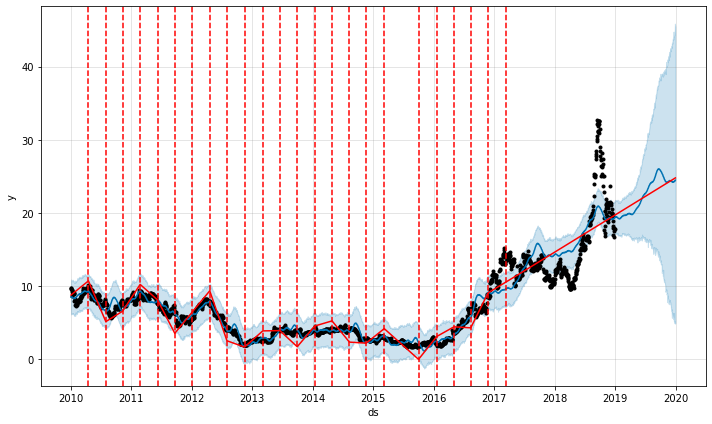

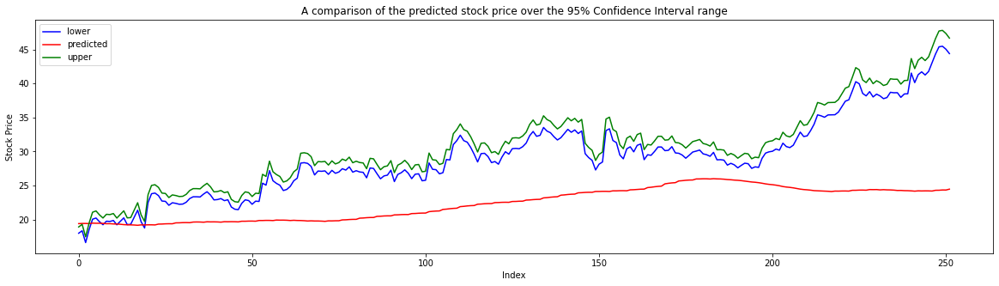

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.





Test 16



This forecast is based on the following parameters:
Number of changepoints = 25
Changepoint range = 0.8
Changepoint prior scale = 2.0
Seasonality type = d
Seasonality period = e
Fourier order = f
Forecast period = 367


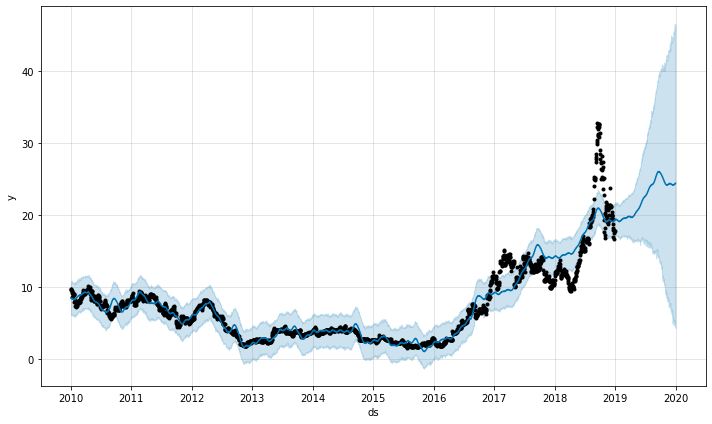

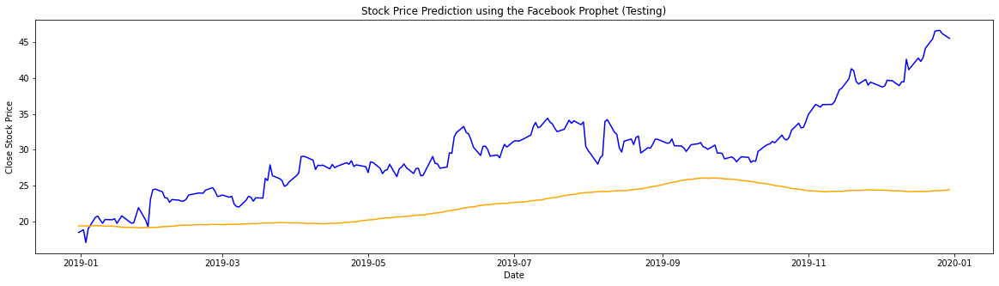

\CHANGEPOINTS PLOT

[[<matplotlib.lines.Line2D object at 0x7f5777a049e8>], <matplotlib.lines.Line2D object at 0x7f577792b278>, <matplotlib.lines.Line2D object at 0x7f5777897160>, <matplotlib.lines.Line2D object at 0x7f5777897b00>, <matplotlib.lines.Line2D object at 0x7f5777897f60>, <matplotlib.lines.Line2D object at 0x7f57778b4400>, <matplotlib.lines.Line2D object at 0x7f57778b4860>, <matplotlib.lines.Line2D object at 0x7f57778b4cc0>, <matplotlib.lines.Line2D object at 0x7f57778af160>, <matplotlib.lines.Line2D object at 0x7f57778af5c0>, <matplotlib.lines.Line2D object at 0x7f577792b780>, <matplotlib.lines.Line2D object at 0x7f57778afb00>, <matplotlib.lines.Line2D object at 0x7f57778aff60>, <matplotlib.lines.Line2D object at 0x7f5777701400>, <matplotlib.lines.Line2D object at 0x7f5777701860>, <matplotlib.lines.Line2D object at 0x7f5777701cc0>, <matplotlib.lines.Line2D object at 0x7f57776d4160>, <matplotlib.lines.Line2D object at 0x7f57776d45c0>, <matplotlib.lines.Line2D object at 0x7f57

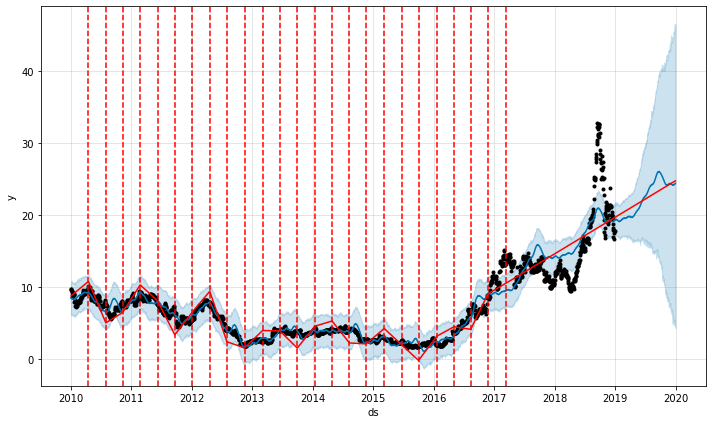

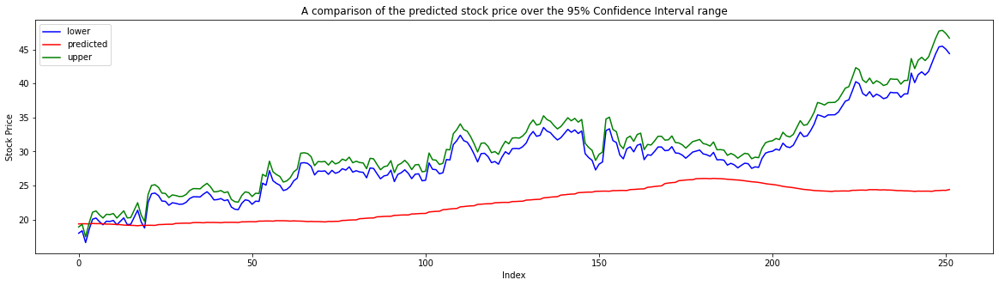

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.





Test 17



This forecast is based on the following parameters:
Number of changepoints = 25
Changepoint range = 0.8
Changepoint prior scale = 5.0
Seasonality type = d
Seasonality period = e
Fourier order = f
Forecast period = 367


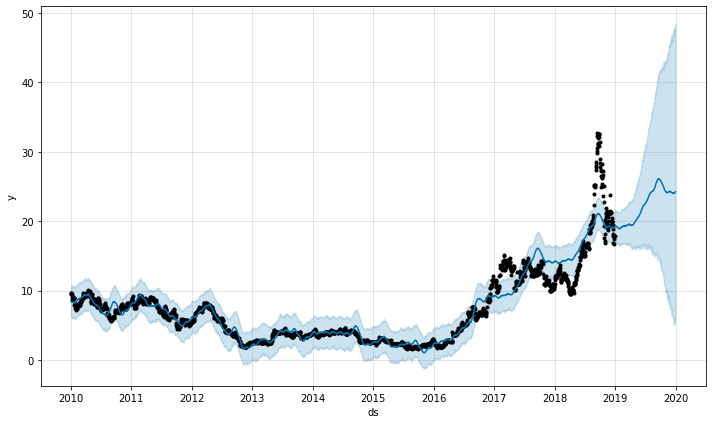

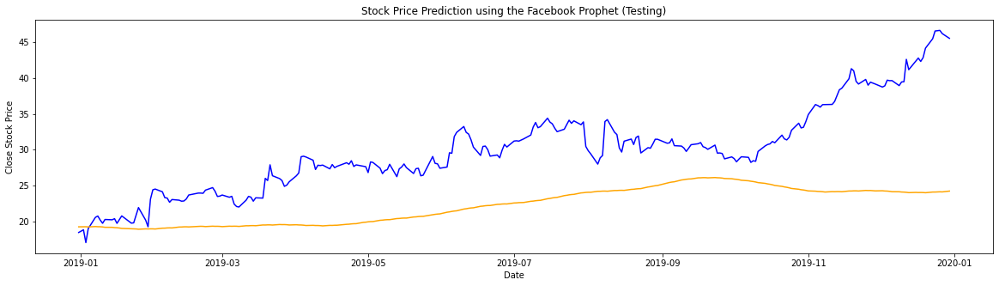

\CHANGEPOINTS PLOT

[[<matplotlib.lines.Line2D object at 0x7f577797ff98>], <matplotlib.lines.Line2D object at 0x7f57778d19e8>, <matplotlib.lines.Line2D object at 0x7f57797eb5f8>, <matplotlib.lines.Line2D object at 0x7f57797b7b00>, <matplotlib.lines.Line2D object at 0x7f577996a828>, <matplotlib.lines.Line2D object at 0x7f577792c160>, <matplotlib.lines.Line2D object at 0x7f577792c5c0>, <matplotlib.lines.Line2D object at 0x7f577980ae80>, <matplotlib.lines.Line2D object at 0x7f57774dfe10>, <matplotlib.lines.Line2D object at 0x7f5777966ef0>, <matplotlib.lines.Line2D object at 0x7f57778b7cf8>, <matplotlib.lines.Line2D object at 0x7f57792af198>, <matplotlib.lines.Line2D object at 0x7f5777515748>, <matplotlib.lines.Line2D object at 0x7f5777515160>, <matplotlib.lines.Line2D object at 0x7f57797a8ef0>, <matplotlib.lines.Line2D object at 0x7f5777a5e5c0>, <matplotlib.lines.Line2D object at 0x7f57792ae390>, <matplotlib.lines.Line2D object at 0x7f5777511278>, <matplotlib.lines.Line2D object at 0x7f57

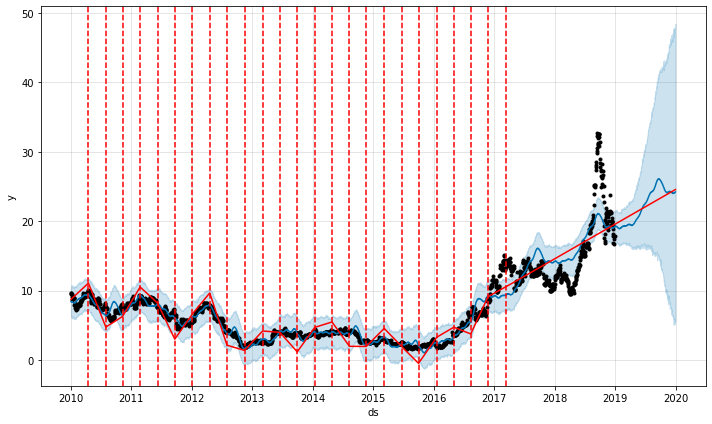

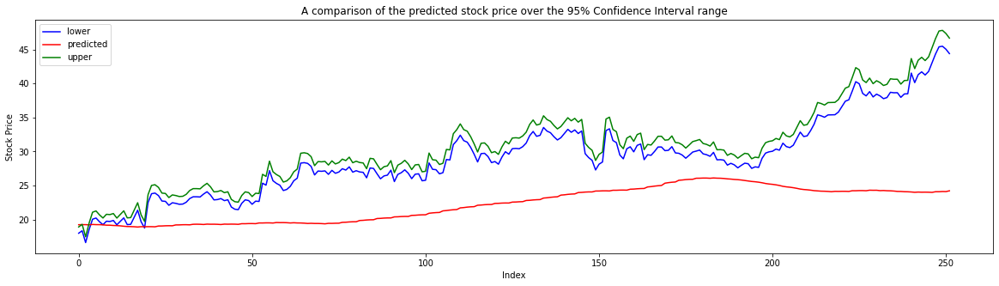

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.





Test 18



This forecast is based on the following parameters:
Number of changepoints = 25
Changepoint range = 0.8
Changepoint prior scale = 10.0
Seasonality type = d
Seasonality period = e
Fourier order = f
Forecast period = 367


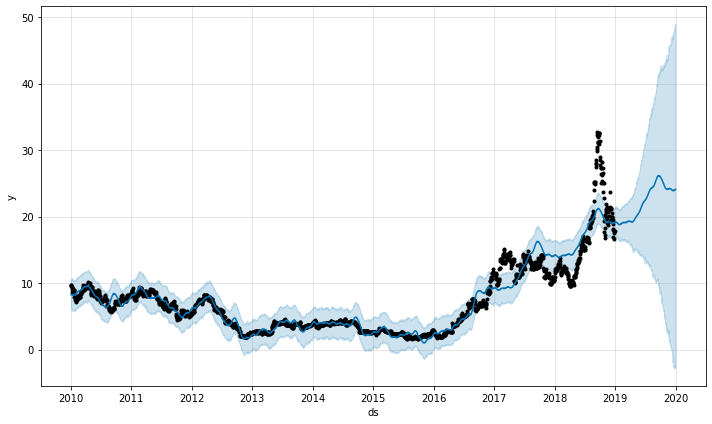

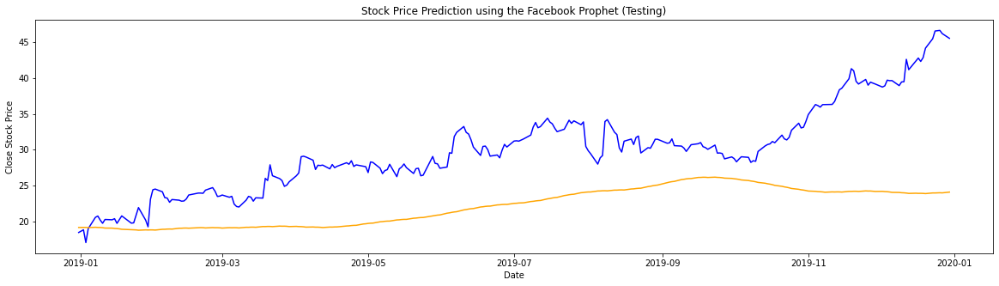

\CHANGEPOINTS PLOT

[[<matplotlib.lines.Line2D object at 0x7f5779aa9748>], <matplotlib.lines.Line2D object at 0x7f5777678a58>, <matplotlib.lines.Line2D object at 0x7f577982e630>, <matplotlib.lines.Line2D object at 0x7f577982e978>, <matplotlib.lines.Line2D object at 0x7f577982e518>, <matplotlib.lines.Line2D object at 0x7f57778f86a0>, <matplotlib.lines.Line2D object at 0x7f57778f8c18>, <matplotlib.lines.Line2D object at 0x7f57778f8a90>, <matplotlib.lines.Line2D object at 0x7f57798c5c18>, <matplotlib.lines.Line2D object at 0x7f5779a8a240>, <matplotlib.lines.Line2D object at 0x7f57798c5b00>, <matplotlib.lines.Line2D object at 0x7f57798c5978>, <matplotlib.lines.Line2D object at 0x7f577994d198>, <matplotlib.lines.Line2D object at 0x7f577994d978>, <matplotlib.lines.Line2D object at 0x7f577994d128>, <matplotlib.lines.Line2D object at 0x7f577f79f908>, <matplotlib.lines.Line2D object at 0x7f577f79fb70>, <matplotlib.lines.Line2D object at 0x7f577f79f400>, <matplotlib.lines.Line2D object at 0x7f57

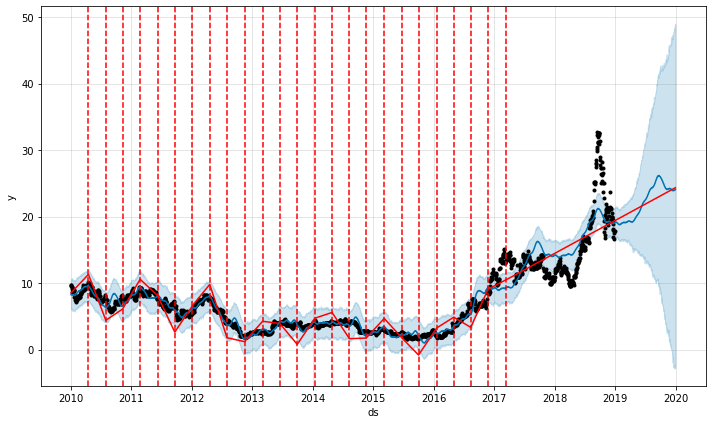

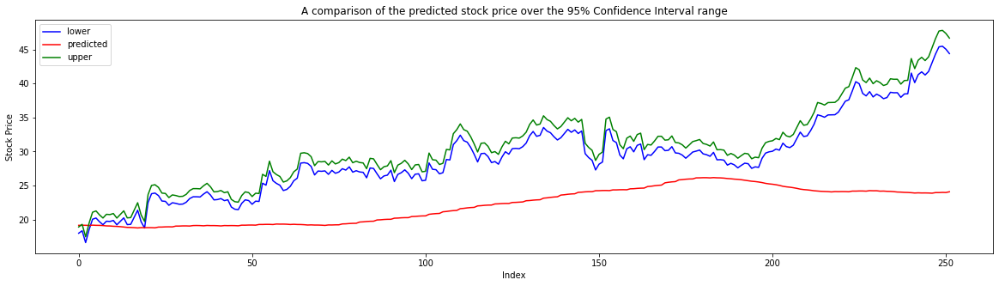

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.





Test 19



This forecast is based on the following parameters:
Number of changepoints = 25
Changepoint range = 0.8
Changepoint prior scale = 15.0
Seasonality type = d
Seasonality period = e
Fourier order = f
Forecast period = 367


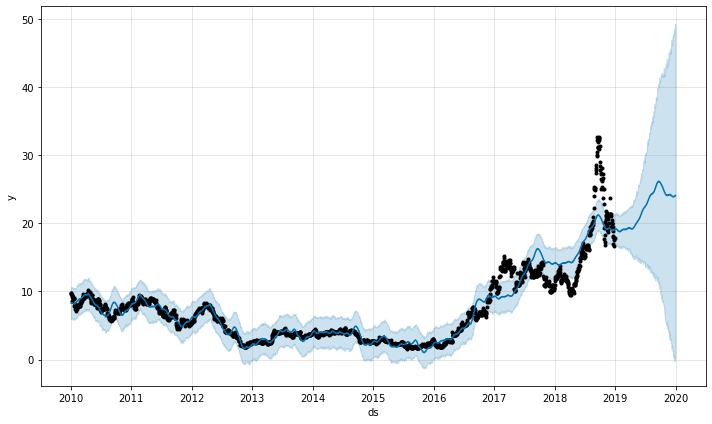

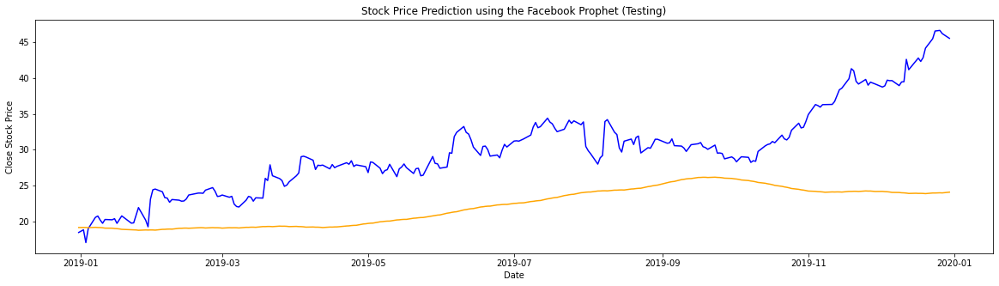

\CHANGEPOINTS PLOT

[[<matplotlib.lines.Line2D object at 0x7f577deac358>], <matplotlib.lines.Line2D object at 0x7f57799055f8>, <matplotlib.lines.Line2D object at 0x7f577f83f048>, <matplotlib.lines.Line2D object at 0x7f577775d2e8>, <matplotlib.lines.Line2D object at 0x7f5777a4e5c0>, <matplotlib.lines.Line2D object at 0x7f577de6a710>, <matplotlib.lines.Line2D object at 0x7f57799a8dd8>, <matplotlib.lines.Line2D object at 0x7f57799a8470>, <matplotlib.lines.Line2D object at 0x7f5779847f60>, <matplotlib.lines.Line2D object at 0x7f5779a91b38>, <matplotlib.lines.Line2D object at 0x7f57799d6a20>, <matplotlib.lines.Line2D object at 0x7f5779882c50>, <matplotlib.lines.Line2D object at 0x7f57778caa20>, <matplotlib.lines.Line2D object at 0x7f57778d1550>, <matplotlib.lines.Line2D object at 0x7f57778d1d68>, <matplotlib.lines.Line2D object at 0x7f57797f8438>, <matplotlib.lines.Line2D object at 0x7f5779295c18>, <matplotlib.lines.Line2D object at 0x7f577790d208>, <matplotlib.lines.Line2D object at 0x7f57

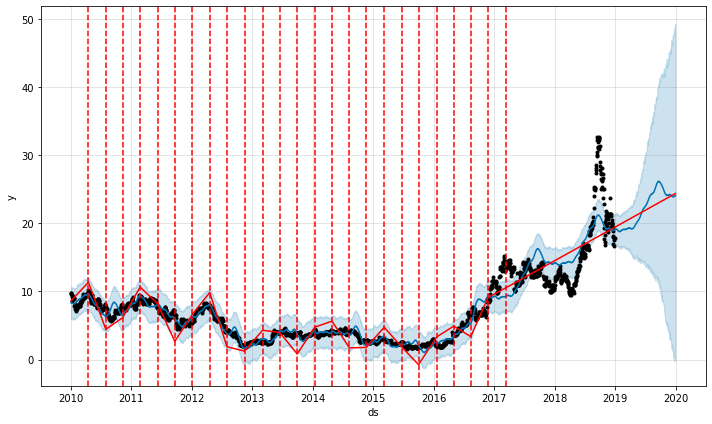

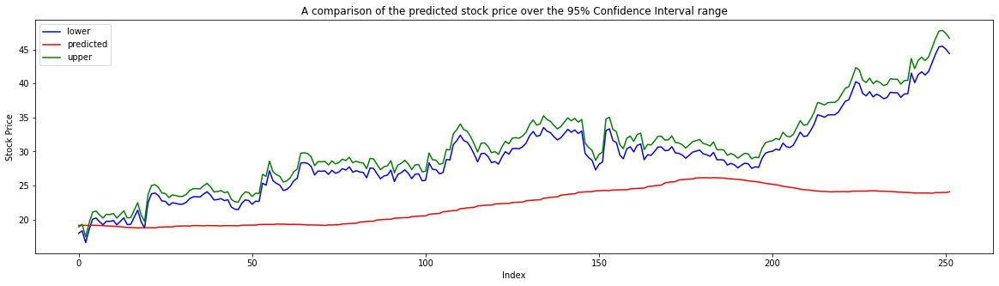

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.





Test 20



This forecast is based on the following parameters:
Number of changepoints = 25
Changepoint range = 0.8
Changepoint prior scale = 30.0
Seasonality type = d
Seasonality period = e
Fourier order = f
Forecast period = 367


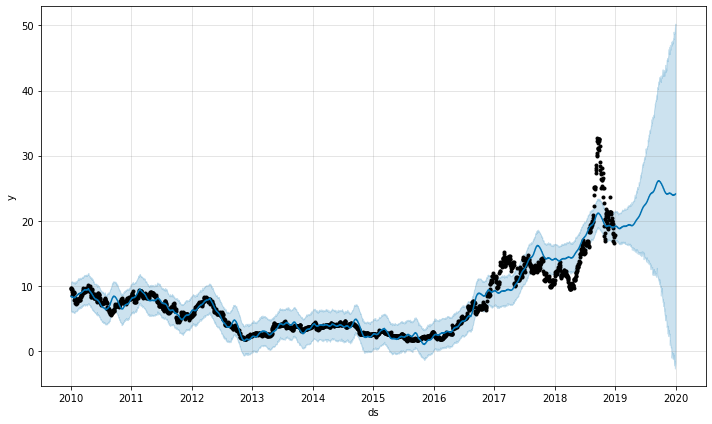

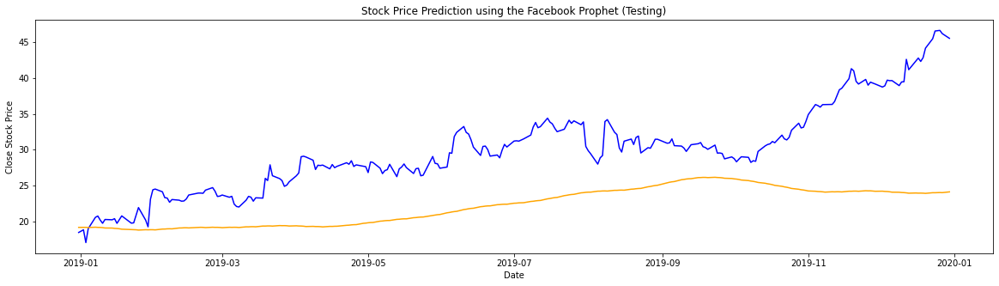

\CHANGEPOINTS PLOT

[[<matplotlib.lines.Line2D object at 0x7f57799d5e80>], <matplotlib.lines.Line2D object at 0x7f577766cef0>, <matplotlib.lines.Line2D object at 0x7f577766c2b0>, <matplotlib.lines.Line2D object at 0x7f577764e320>, <matplotlib.lines.Line2D object at 0x7f577764e780>, <matplotlib.lines.Line2D object at 0x7f577764ebe0>, <matplotlib.lines.Line2D object at 0x7f5777895048>, <matplotlib.lines.Line2D object at 0x7f57778954e0>, <matplotlib.lines.Line2D object at 0x7f5777895940>, <matplotlib.lines.Line2D object at 0x7f57798219b0>, <matplotlib.lines.Line2D object at 0x7f5777895da0>, <matplotlib.lines.Line2D object at 0x7f57778c52b0>, <matplotlib.lines.Line2D object at 0x7f57778c5710>, <matplotlib.lines.Line2D object at 0x7f57778c5b70>, <matplotlib.lines.Line2D object at 0x7f57778c5fd0>, <matplotlib.lines.Line2D object at 0x7f57776ce470>, <matplotlib.lines.Line2D object at 0x7f57776ce8d0>, <matplotlib.lines.Line2D object at 0x7f57776ced30>, <matplotlib.lines.Line2D object at 0x7f57

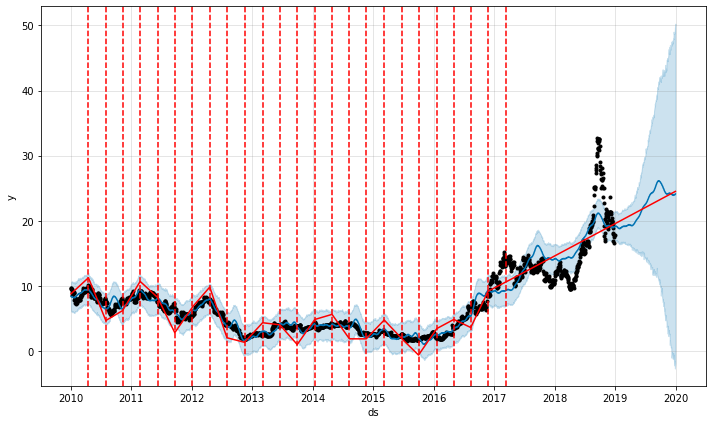

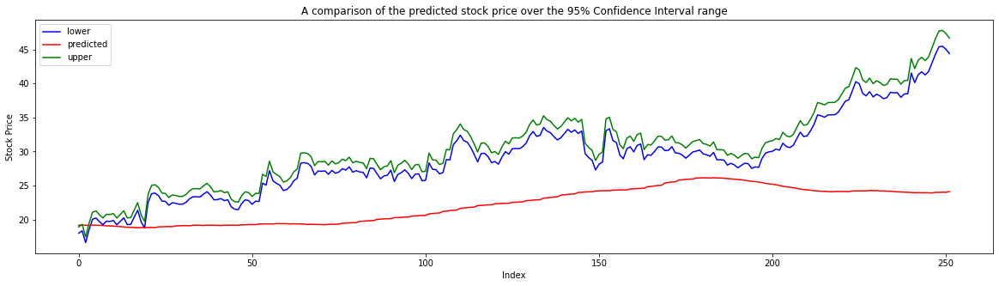

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.





Test 21



This forecast is based on the following parameters:
Number of changepoints = 25
Changepoint range = 0.8
Changepoint prior scale = 50.0
Seasonality type = d
Seasonality period = e
Fourier order = f
Forecast period = 367


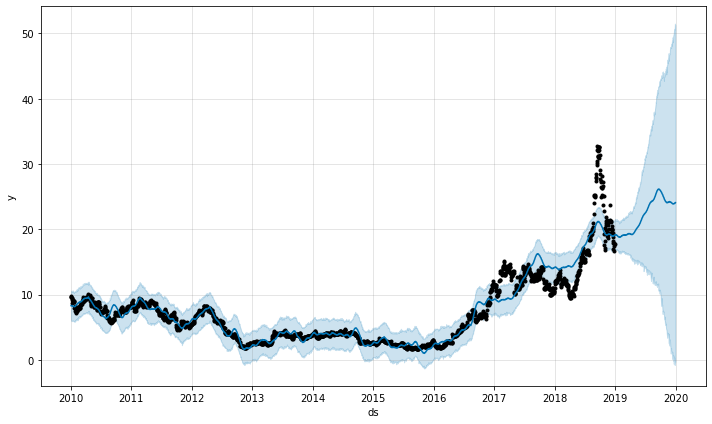

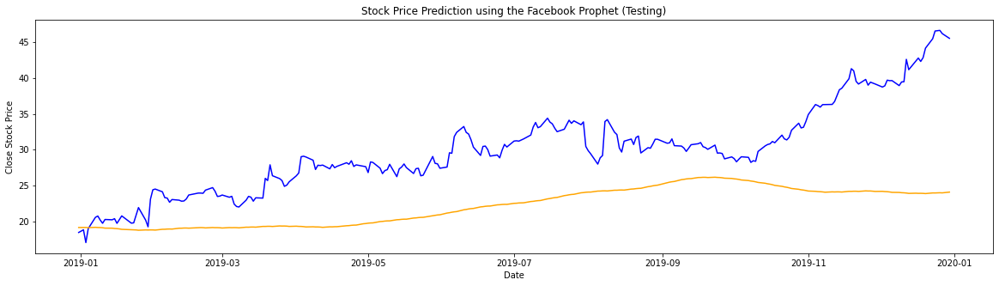

\CHANGEPOINTS PLOT

[[<matplotlib.lines.Line2D object at 0x7f577df54c88>], <matplotlib.lines.Line2D object at 0x7f57798eccc0>, <matplotlib.lines.Line2D object at 0x7f57792afdd8>, <matplotlib.lines.Line2D object at 0x7f5777549208>, <matplotlib.lines.Line2D object at 0x7f57792ae438>, <matplotlib.lines.Line2D object at 0x7f57774e7208>, <matplotlib.lines.Line2D object at 0x7f57797f8a90>, <matplotlib.lines.Line2D object at 0x7f57774df5c0>, <matplotlib.lines.Line2D object at 0x7f5777669ba8>, <matplotlib.lines.Line2D object at 0x7f57778babe0>, <matplotlib.lines.Line2D object at 0x7f577792e828>, <matplotlib.lines.Line2D object at 0x7f57778baac8>, <matplotlib.lines.Line2D object at 0x7f57778a32b0>, <matplotlib.lines.Line2D object at 0x7f5779818c88>, <matplotlib.lines.Line2D object at 0x7f57798b7fd0>, <matplotlib.lines.Line2D object at 0x7f577795e550>, <matplotlib.lines.Line2D object at 0x7f5779a83c50>, <matplotlib.lines.Line2D object at 0x7f5779a83cc0>, <matplotlib.lines.Line2D object at 0x7f57

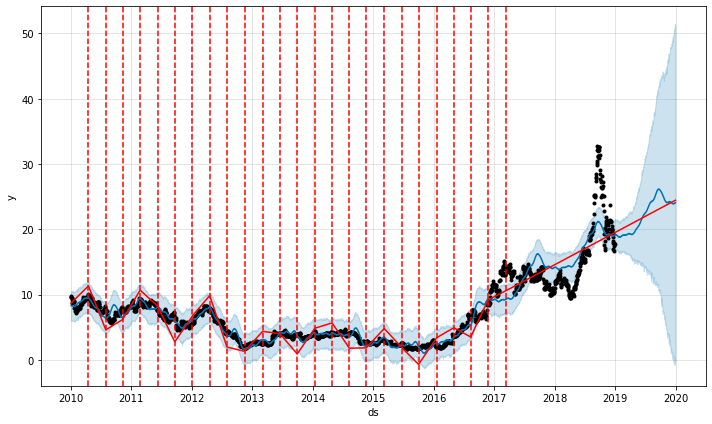

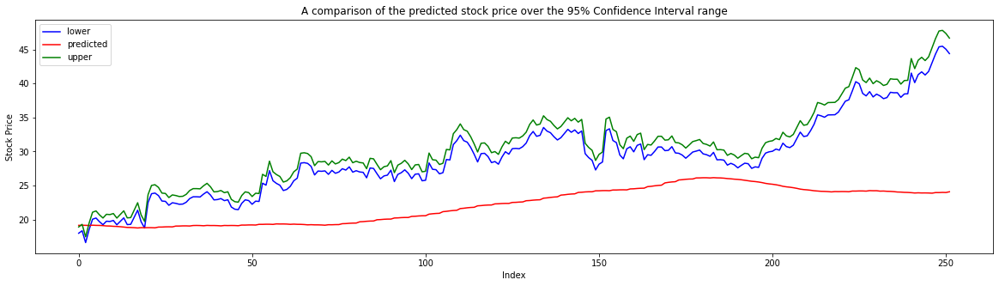

In [51]:
# Changepoints parameter
n_change = np.array([328,375,421,468,75,86,96,107,6,7,8,8,25,25,25,25,25,25,25,25,25])
change_range = np.array([0.7,0.8,0.9,1,0.7,0.8,0.9,1,0.7,0.8,0.9,1,0.8,0.8,0.8,0.8,0.8,0.8,0.8,0.8,0.8])
change_scale = np.array([0.05,0.05,0.05,0.05,0.05,0.05,0.05,0.05,0.05,0.05,0.05,0.05,0.5,1,1.5,2,5,10,15,30,50])

combined = pd.DataFrame({"a": n_change, "b": change_range, "c":change_scale})

n = 1

# no seasonality, just 'dummy' values
d = 'd'
e = 'e'
f = 'f'


for a,b,c in combined[['a', 'b','c']].itertuples(index=False):
  print('\n\n\nTest ' + str(n) + '\n\n\n')
  forecast, test_mae, test_mse, test_rmse,test_r2,test_mape,test_accuracy,test_ci_accuracy = fit_custom_prophet(train, test,a,b,c,d,e,f,period)  
  df3 = pd.DataFrame({"MAE":[test_mae], 
                    "MSE":[test_mse],
                    "RMSE":[test_rmse],
                    "MAPE":[test_mape],
                    "R2":[test_r2],
                    "CI":[test_ci_accuracy],
                    "Trend":[test_accuracy]}, index = ['test']) 
  metrics_result = metrics_result.append(df3)
  n += 1

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.





Test 23



This forecast is based on the following parameters:
Number of changepoints = 25
Changepoint range = 0.8
Changepoint prior scale = 0.05
Seasonality type = monthly
Seasonality period = 21
Fourier order = 1
Forecast period = 367


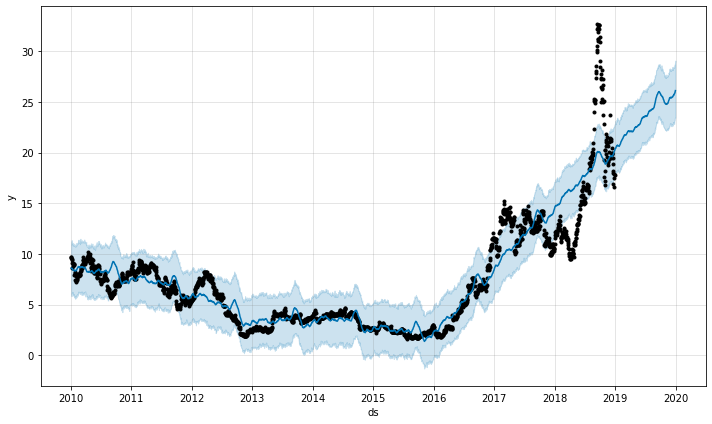

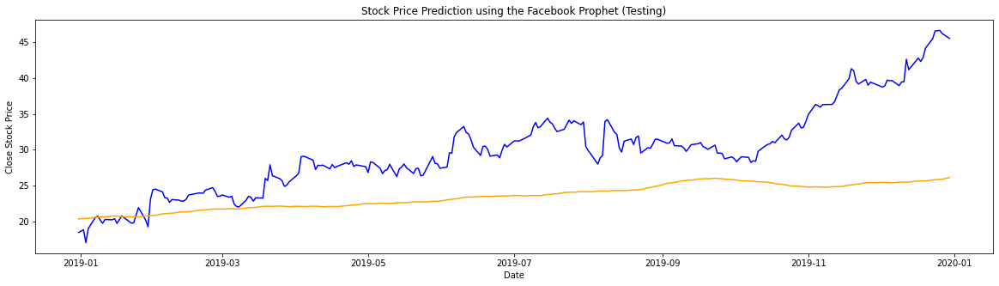

\CHANGEPOINTS PLOT

[[<matplotlib.lines.Line2D object at 0x7f577767a208>], <matplotlib.lines.Line2D object at 0x7f57793396a0>, <matplotlib.lines.Line2D object at 0x7f577791f240>, <matplotlib.lines.Line2D object at 0x7f577791f438>, <matplotlib.lines.Line2D object at 0x7f577791f160>, <matplotlib.lines.Line2D object at 0x7f577791fac8>, <matplotlib.lines.Line2D object at 0x7f577997eeb8>, <matplotlib.lines.Line2D object at 0x7f577997ec18>, <matplotlib.lines.Line2D object at 0x7f5779339d68>, <matplotlib.lines.Line2D object at 0x7f5779a9e470>, <matplotlib.lines.Line2D object at 0x7f5777a47080>, <matplotlib.lines.Line2D object at 0x7f5777a47278>, <matplotlib.lines.Line2D object at 0x7f5777a47438>, <matplotlib.lines.Line2D object at 0x7f57777a1d68>, <matplotlib.lines.Line2D object at 0x7f57777a1fd0>]


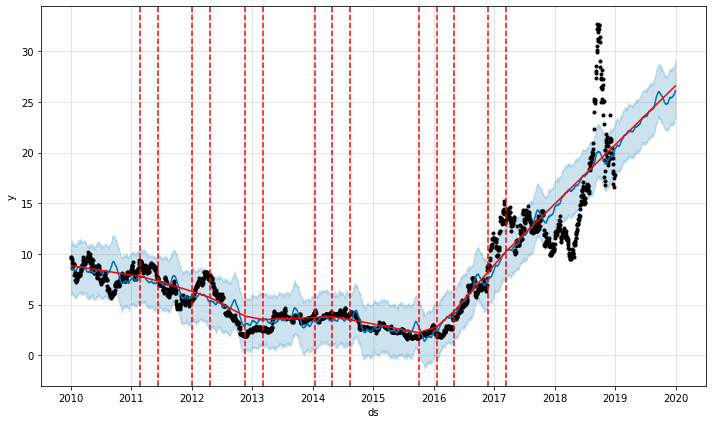

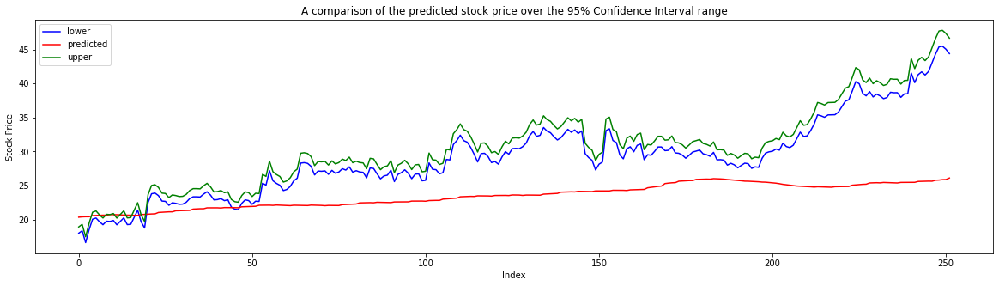

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.





Test 24



This forecast is based on the following parameters:
Number of changepoints = 25
Changepoint range = 0.8
Changepoint prior scale = 0.05
Seasonality type = monthly
Seasonality period = 21
Fourier order = 5
Forecast period = 367


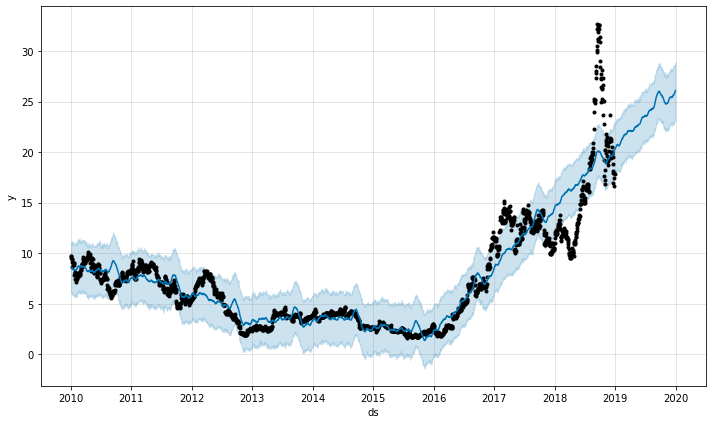

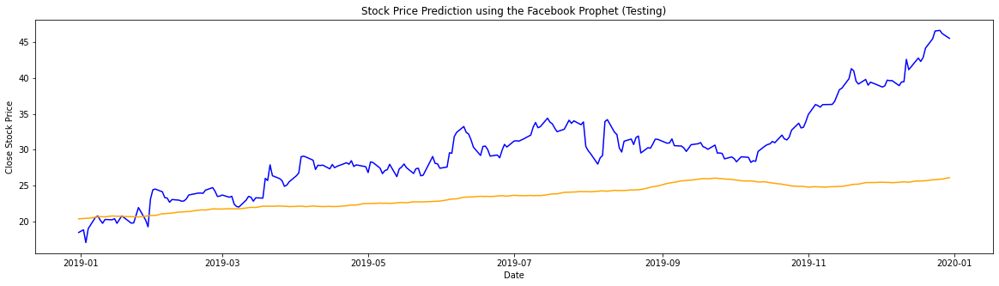

\CHANGEPOINTS PLOT

[[<matplotlib.lines.Line2D object at 0x7f577994dc50>], <matplotlib.lines.Line2D object at 0x7f57798f9358>, <matplotlib.lines.Line2D object at 0x7f577792cfd0>, <matplotlib.lines.Line2D object at 0x7f5777a48550>, <matplotlib.lines.Line2D object at 0x7f57779ef400>, <matplotlib.lines.Line2D object at 0x7f5779a91a58>, <matplotlib.lines.Line2D object at 0x7f5777892cc0>, <matplotlib.lines.Line2D object at 0x7f577790d198>, <matplotlib.lines.Line2D object at 0x7f577764d400>, <matplotlib.lines.Line2D object at 0x7f5777515668>, <matplotlib.lines.Line2D object at 0x7f57798f9588>, <matplotlib.lines.Line2D object at 0x7f57797a9a90>, <matplotlib.lines.Line2D object at 0x7f577982ee80>, <matplotlib.lines.Line2D object at 0x7f57779175f8>]


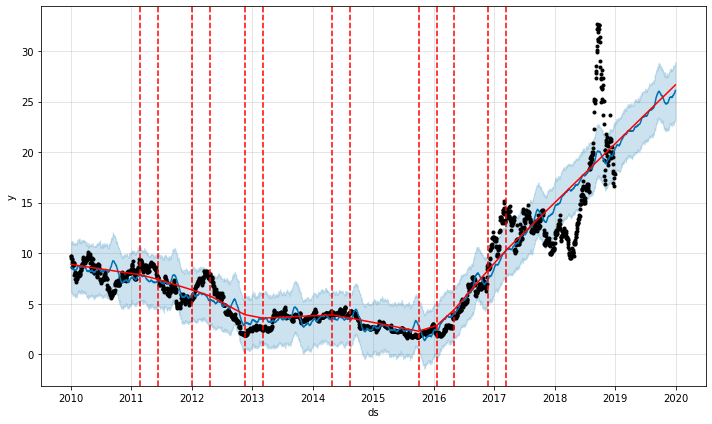

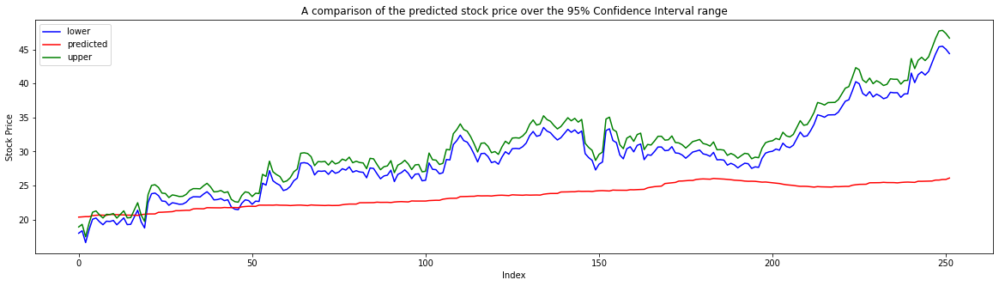

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.





Test 25



This forecast is based on the following parameters:
Number of changepoints = 25
Changepoint range = 0.8
Changepoint prior scale = 0.05
Seasonality type = monthly
Seasonality period = 21
Fourier order = 10
Forecast period = 367


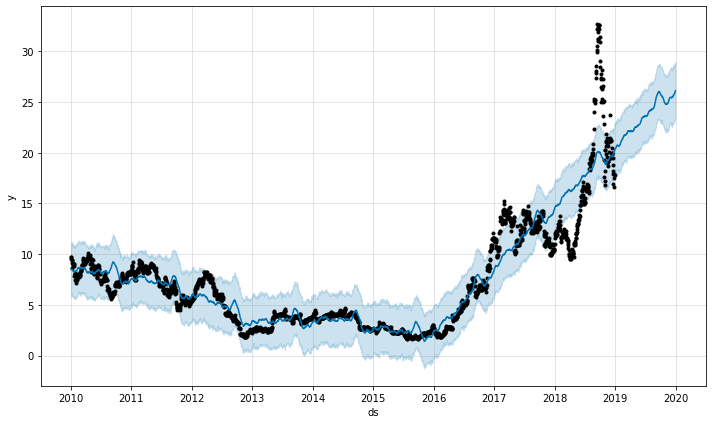

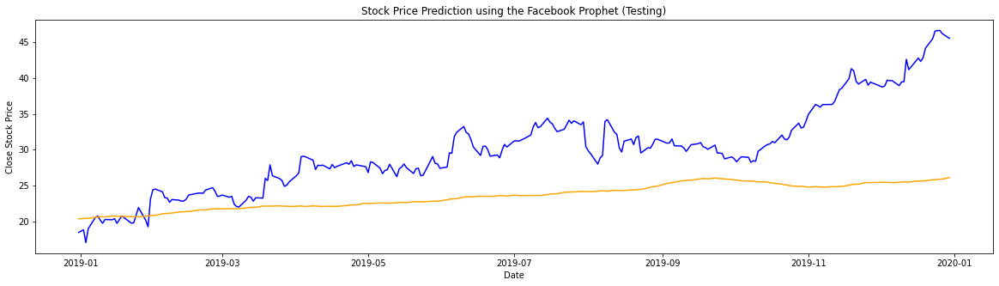

\CHANGEPOINTS PLOT

[[<matplotlib.lines.Line2D object at 0x7f5777695208>], <matplotlib.lines.Line2D object at 0x7f577980a438>, <matplotlib.lines.Line2D object at 0x7f577980aeb8>, <matplotlib.lines.Line2D object at 0x7f577980aac8>, <matplotlib.lines.Line2D object at 0x7f57774dfe10>, <matplotlib.lines.Line2D object at 0x7f57774df748>, <matplotlib.lines.Line2D object at 0x7f57774df908>, <matplotlib.lines.Line2D object at 0x7f577980ab70>, <matplotlib.lines.Line2D object at 0x7f5777a686a0>, <matplotlib.lines.Line2D object at 0x7f5777a234a8>, <matplotlib.lines.Line2D object at 0x7f5777a23208>, <matplotlib.lines.Line2D object at 0x7f5777a23a90>, <matplotlib.lines.Line2D object at 0x7f57778c8630>, <matplotlib.lines.Line2D object at 0x7f57778c8128>, <matplotlib.lines.Line2D object at 0x7f57778c8588>]


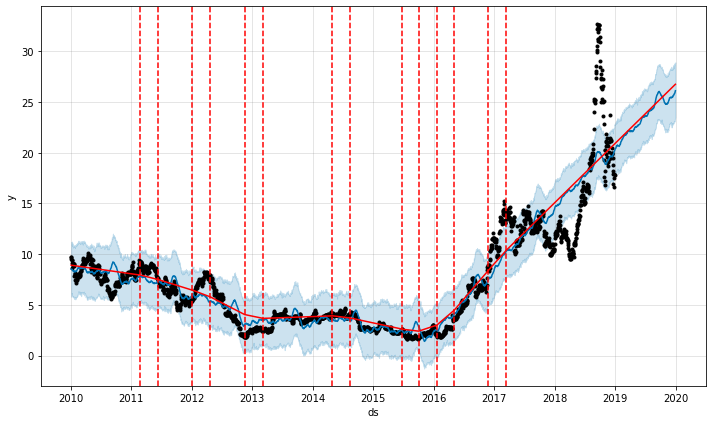

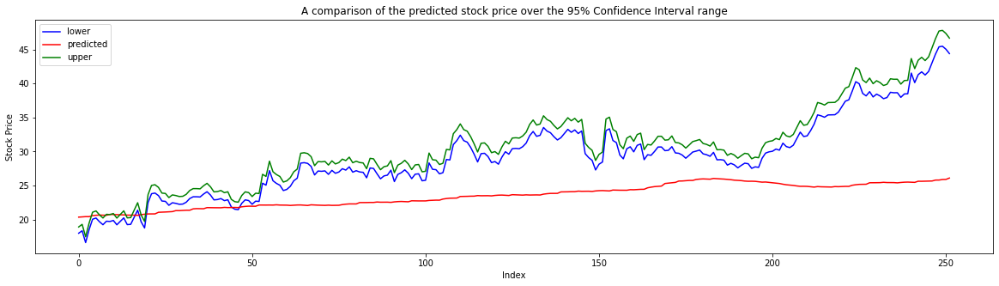

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.





Test 26



This forecast is based on the following parameters:
Number of changepoints = 25
Changepoint range = 0.8
Changepoint prior scale = 0.05
Seasonality type = monthly
Seasonality period = 21
Fourier order = 15
Forecast period = 367


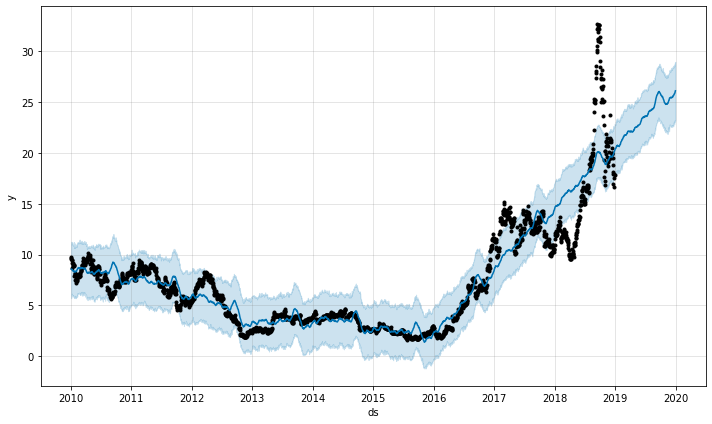

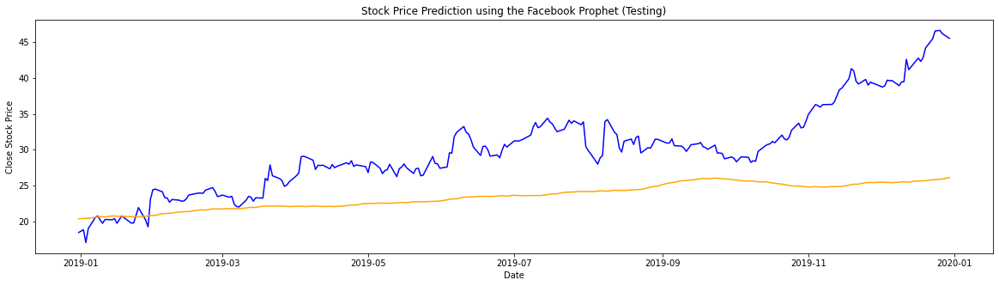

\CHANGEPOINTS PLOT

[[<matplotlib.lines.Line2D object at 0x7f57799d6e10>], <matplotlib.lines.Line2D object at 0x7f5777943978>, <matplotlib.lines.Line2D object at 0x7f5777515438>, <matplotlib.lines.Line2D object at 0x7f57778a3a58>, <matplotlib.lines.Line2D object at 0x7f577795e8d0>, <matplotlib.lines.Line2D object at 0x7f577795e4a8>, <matplotlib.lines.Line2D object at 0x7f57778ca198>, <matplotlib.lines.Line2D object at 0x7f5777942be0>, <matplotlib.lines.Line2D object at 0x7f5777942978>, <matplotlib.lines.Line2D object at 0x7f57798720f0>, <matplotlib.lines.Line2D object at 0x7f5777a02ac8>, <matplotlib.lines.Line2D object at 0x7f5777a02588>, <matplotlib.lines.Line2D object at 0x7f57778c4e80>, <matplotlib.lines.Line2D object at 0x7f57798476d8>]


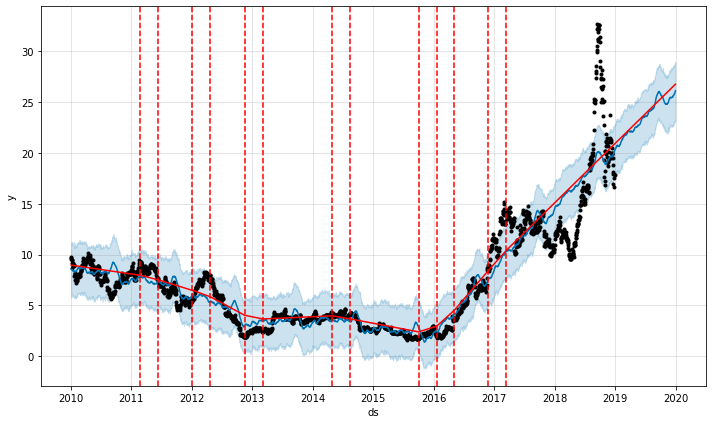

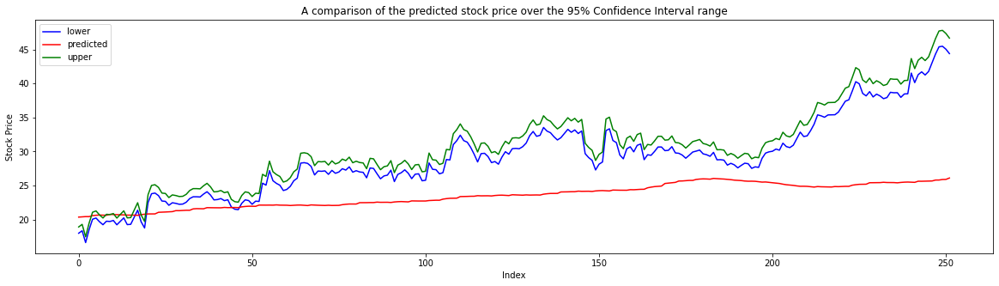

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.





Test 27



This forecast is based on the following parameters:
Number of changepoints = 25
Changepoint range = 0.8
Changepoint prior scale = 0.05
Seasonality type = monthly
Seasonality period = 21
Fourier order = 30
Forecast period = 367


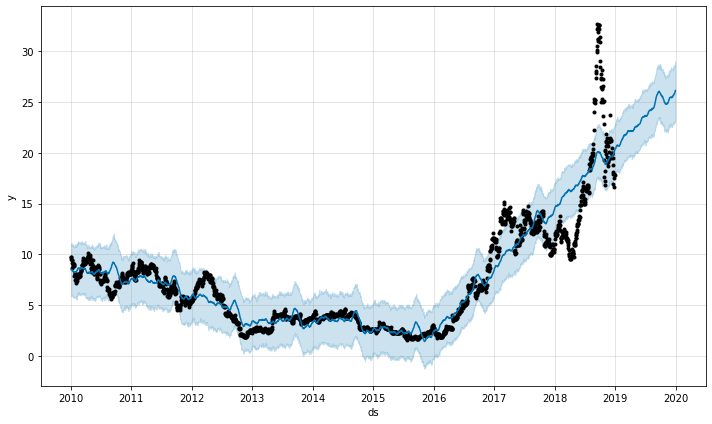

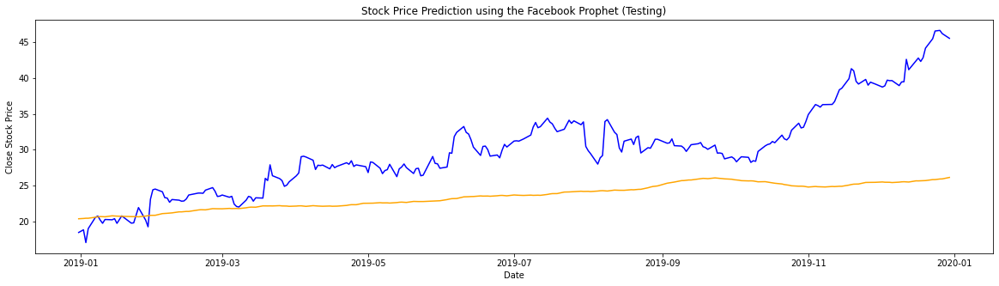

\CHANGEPOINTS PLOT

[[<matplotlib.lines.Line2D object at 0x7f5779901160>], <matplotlib.lines.Line2D object at 0x7f577785c320>, <matplotlib.lines.Line2D object at 0x7f577785ccc0>, <matplotlib.lines.Line2D object at 0x7f5779a4a4e0>, <matplotlib.lines.Line2D object at 0x7f5779a4a898>, <matplotlib.lines.Line2D object at 0x7f5777516320>, <matplotlib.lines.Line2D object at 0x7f5777516f60>, <matplotlib.lines.Line2D object at 0x7f5777516048>, <matplotlib.lines.Line2D object at 0x7f577785c278>, <matplotlib.lines.Line2D object at 0x7f577784d4a8>, <matplotlib.lines.Line2D object at 0x7f57778c22e8>, <matplotlib.lines.Line2D object at 0x7f57778c2fd0>, <matplotlib.lines.Line2D object at 0x7f57778c2278>, <matplotlib.lines.Line2D object at 0x7f57798d5898>, <matplotlib.lines.Line2D object at 0x7f57798d5c50>, <matplotlib.lines.Line2D object at 0x7f57798d5a20>]


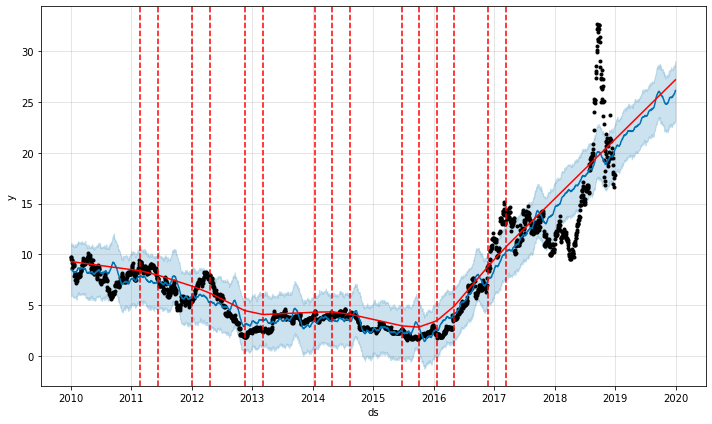

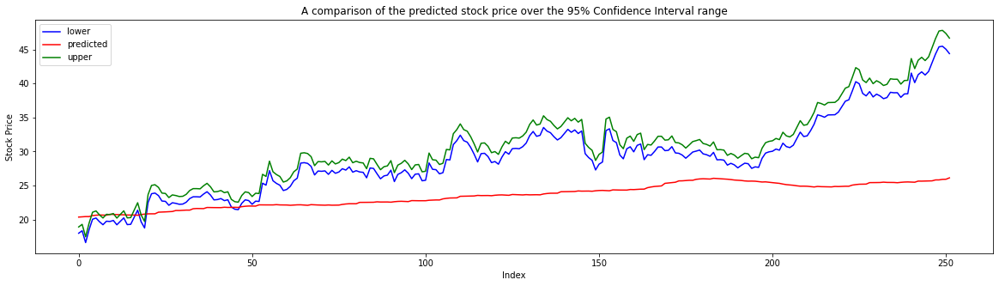

INFO:fbprophet:Found custom seasonality named 'yearly', disabling built-in 'yearly' seasonality.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.





Test 28



This forecast is based on the following parameters:
Number of changepoints = 25
Changepoint range = 0.8
Changepoint prior scale = 0.05
Seasonality type = yearly
Seasonality period = 252
Fourier order = 1
Forecast period = 367


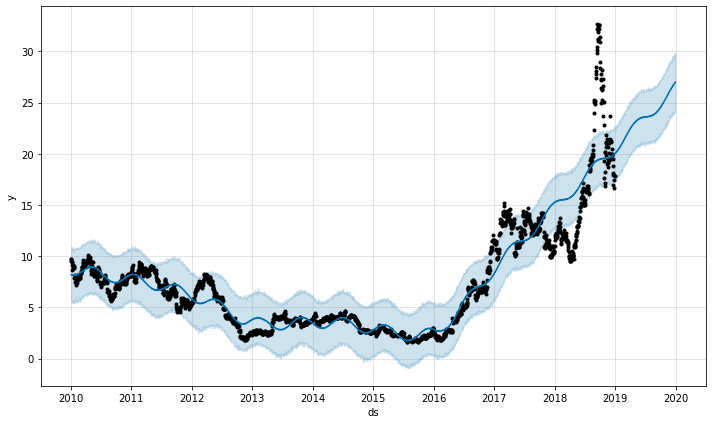

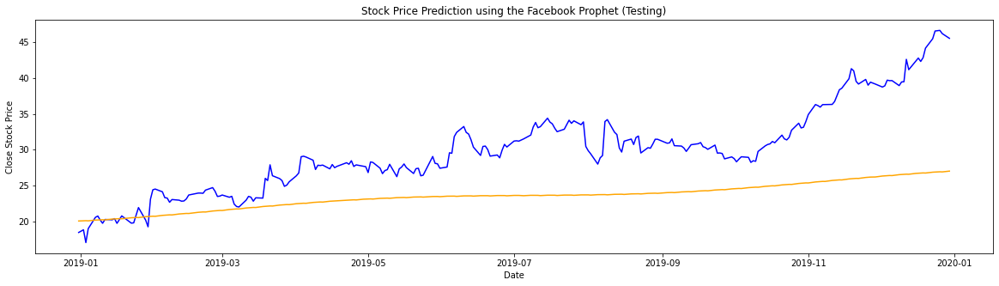

\CHANGEPOINTS PLOT

[[<matplotlib.lines.Line2D object at 0x7f577994d828>], <matplotlib.lines.Line2D object at 0x7f577982ec88>, <matplotlib.lines.Line2D object at 0x7f577f797128>, <matplotlib.lines.Line2D object at 0x7f577765aa90>, <matplotlib.lines.Line2D object at 0x7f57779daa58>, <matplotlib.lines.Line2D object at 0x7f5779847dd8>, <matplotlib.lines.Line2D object at 0x7f57775156a0>, <matplotlib.lines.Line2D object at 0x7f57778c4f28>, <matplotlib.lines.Line2D object at 0x7f57776fc5f8>, <matplotlib.lines.Line2D object at 0x7f577750ada0>, <matplotlib.lines.Line2D object at 0x7f5779a83518>, <matplotlib.lines.Line2D object at 0x7f577df2ea90>, <matplotlib.lines.Line2D object at 0x7f5779a05550>, <matplotlib.lines.Line2D object at 0x7f5779a05fd0>]


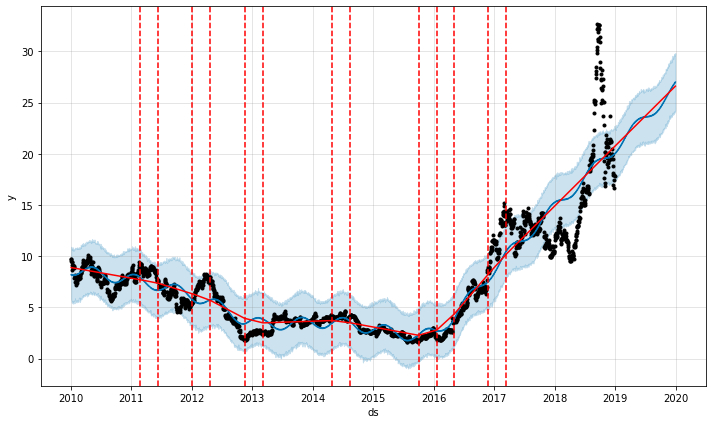

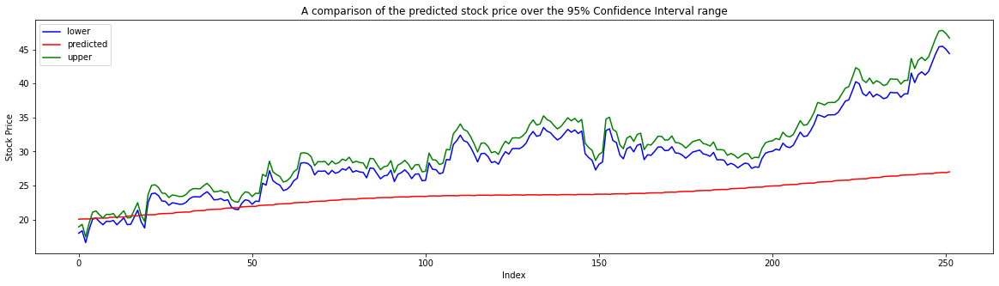

INFO:fbprophet:Found custom seasonality named 'yearly', disabling built-in 'yearly' seasonality.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.





Test 29



This forecast is based on the following parameters:
Number of changepoints = 25
Changepoint range = 0.8
Changepoint prior scale = 0.05
Seasonality type = yearly
Seasonality period = 252
Fourier order = 5
Forecast period = 367


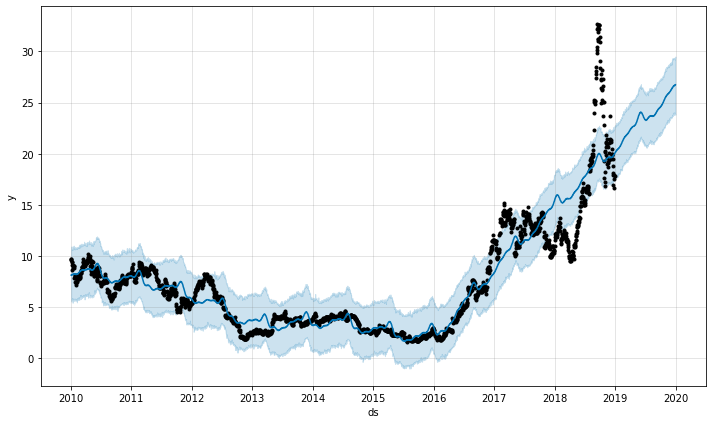

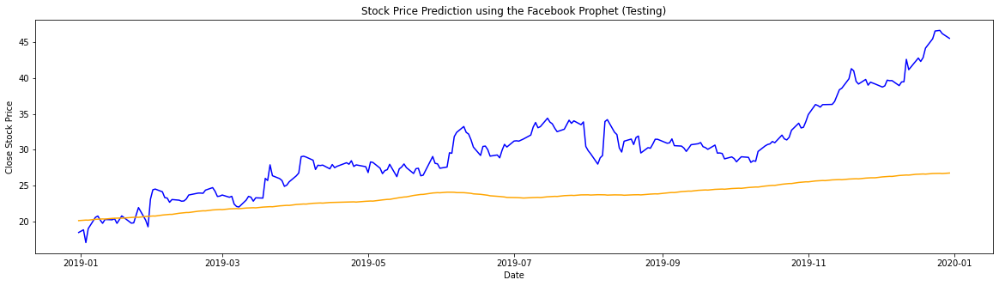

\CHANGEPOINTS PLOT

[[<matplotlib.lines.Line2D object at 0x7f577795e5f8>], <matplotlib.lines.Line2D object at 0x7f577787b240>, <matplotlib.lines.Line2D object at 0x7f577787be80>, <matplotlib.lines.Line2D object at 0x7f57777dc6d8>, <matplotlib.lines.Line2D object at 0x7f57777dc9b0>, <matplotlib.lines.Line2D object at 0x7f57777dccc0>, <matplotlib.lines.Line2D object at 0x7f5777539208>, <matplotlib.lines.Line2D object at 0x7f57775396d8>, <matplotlib.lines.Line2D object at 0x7f577787b0f0>, <matplotlib.lines.Line2D object at 0x7f577795e2b0>, <matplotlib.lines.Line2D object at 0x7f5777539b70>, <matplotlib.lines.Line2D object at 0x7f57777a1128>, <matplotlib.lines.Line2D object at 0x7f5779878080>, <matplotlib.lines.Line2D object at 0x7f57798780b8>, <matplotlib.lines.Line2D object at 0x7f5779878438>]


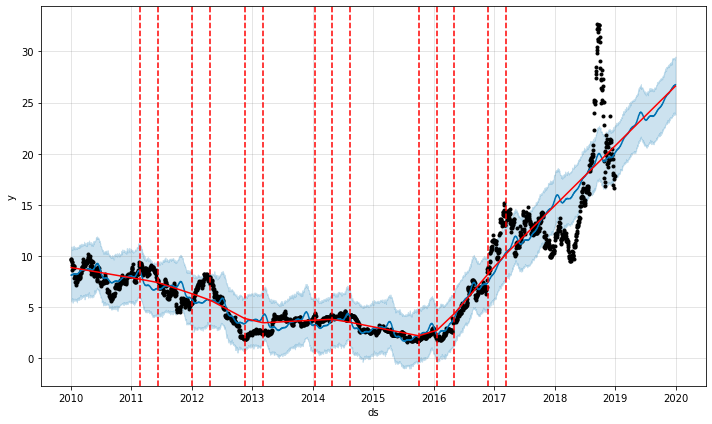

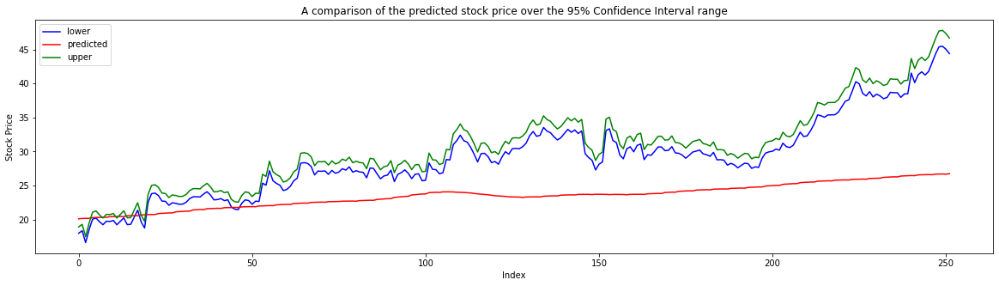

INFO:fbprophet:Found custom seasonality named 'yearly', disabling built-in 'yearly' seasonality.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.





Test 30



This forecast is based on the following parameters:
Number of changepoints = 25
Changepoint range = 0.8
Changepoint prior scale = 0.05
Seasonality type = yearly
Seasonality period = 252
Fourier order = 10
Forecast period = 367


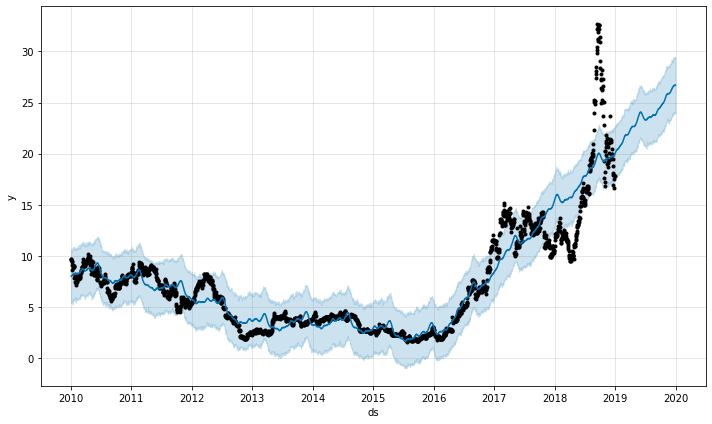

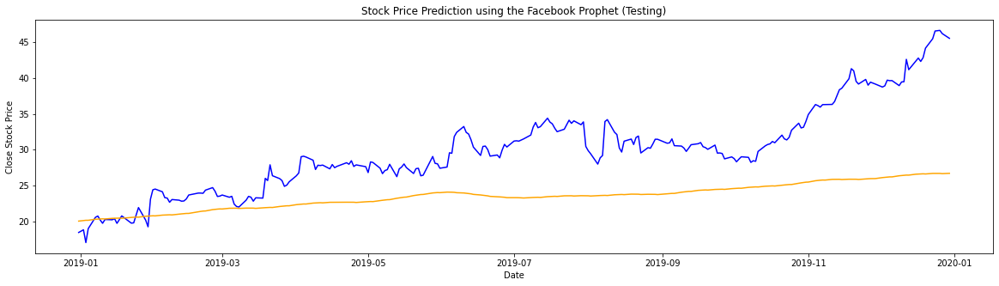

\CHANGEPOINTS PLOT

[[<matplotlib.lines.Line2D object at 0x7f57799c7fd0>], <matplotlib.lines.Line2D object at 0x7f5777803518>, <matplotlib.lines.Line2D object at 0x7f57775116a0>, <matplotlib.lines.Line2D object at 0x7f5779818208>, <matplotlib.lines.Line2D object at 0x7f5779818f98>, <matplotlib.lines.Line2D object at 0x7f5779a91f28>, <matplotlib.lines.Line2D object at 0x7f57799d05f8>, <matplotlib.lines.Line2D object at 0x7f57797a98d0>, <matplotlib.lines.Line2D object at 0x7f5777803a90>, <matplotlib.lines.Line2D object at 0x7f577775d320>, <matplotlib.lines.Line2D object at 0x7f57778f0a58>, <matplotlib.lines.Line2D object at 0x7f5777515b70>, <matplotlib.lines.Line2D object at 0x7f57798eca90>, <matplotlib.lines.Line2D object at 0x7f57798ec588>]


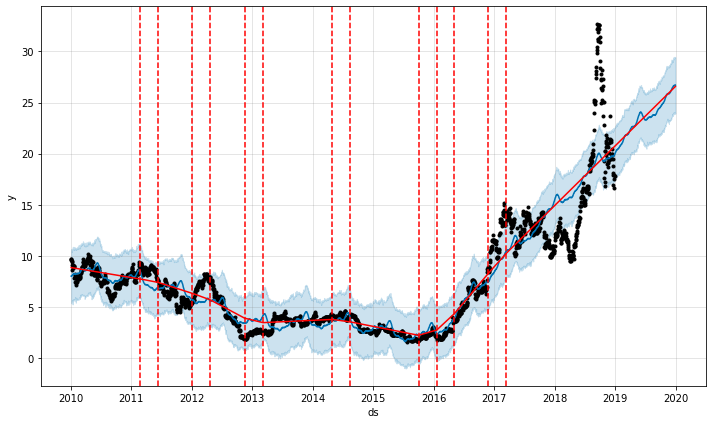

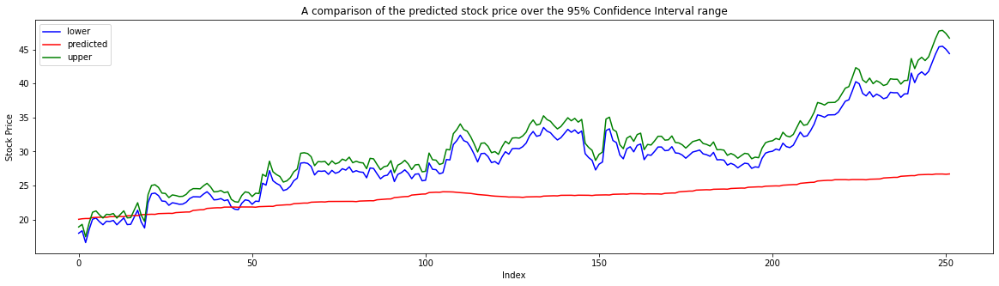

INFO:fbprophet:Found custom seasonality named 'yearly', disabling built-in 'yearly' seasonality.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.





Test 31



This forecast is based on the following parameters:
Number of changepoints = 25
Changepoint range = 0.8
Changepoint prior scale = 0.05
Seasonality type = yearly
Seasonality period = 252
Fourier order = 15
Forecast period = 367


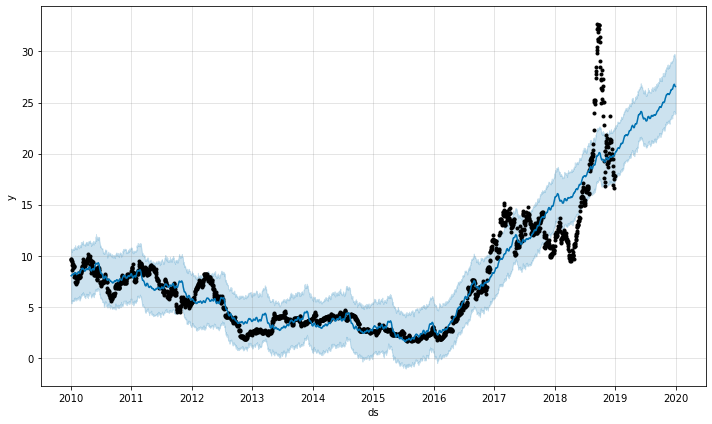

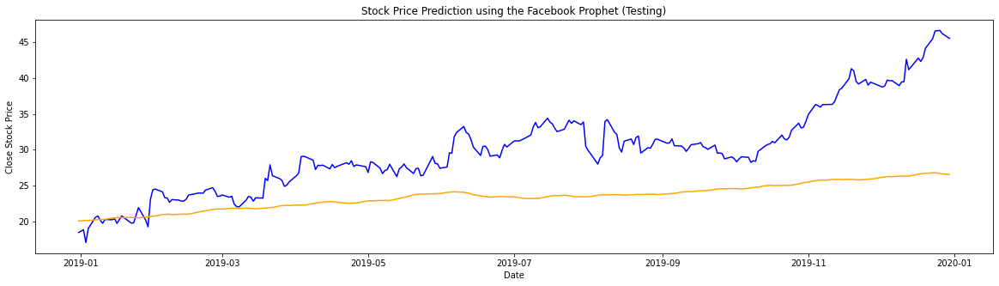

\CHANGEPOINTS PLOT

[[<matplotlib.lines.Line2D object at 0x7f577998b7b8>], <matplotlib.lines.Line2D object at 0x7f5779339898>, <matplotlib.lines.Line2D object at 0x7f57799e1438>, <matplotlib.lines.Line2D object at 0x7f57799e1eb8>, <matplotlib.lines.Line2D object at 0x7f57799e1940>, <matplotlib.lines.Line2D object at 0x7f57799a8b00>, <matplotlib.lines.Line2D object at 0x7f57799a8438>, <matplotlib.lines.Line2D object at 0x7f57799a8320>, <matplotlib.lines.Line2D object at 0x7f577979d198>, <matplotlib.lines.Line2D object at 0x7f57799f69e8>, <matplotlib.lines.Line2D object at 0x7f57798f9978>, <matplotlib.lines.Line2D object at 0x7f5777539da0>, <matplotlib.lines.Line2D object at 0x7f5779890400>, <matplotlib.lines.Line2D object at 0x7f5779890320>]


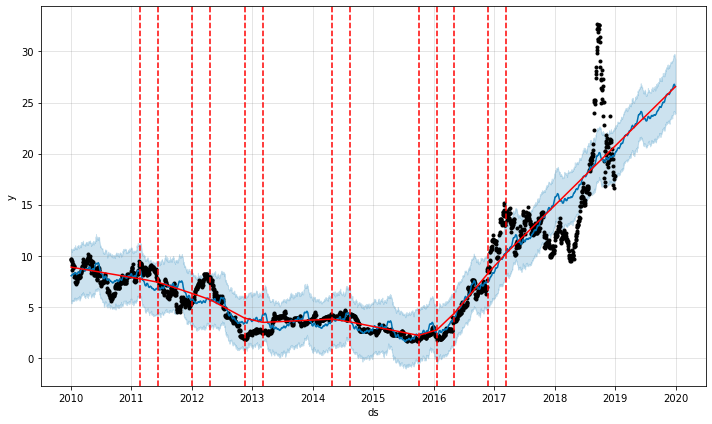

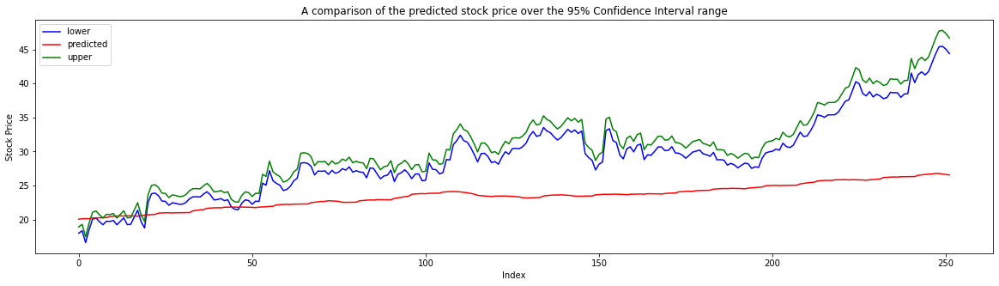

INFO:fbprophet:Found custom seasonality named 'yearly', disabling built-in 'yearly' seasonality.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.





Test 32



This forecast is based on the following parameters:
Number of changepoints = 25
Changepoint range = 0.8
Changepoint prior scale = 0.05
Seasonality type = yearly
Seasonality period = 252
Fourier order = 30
Forecast period = 367


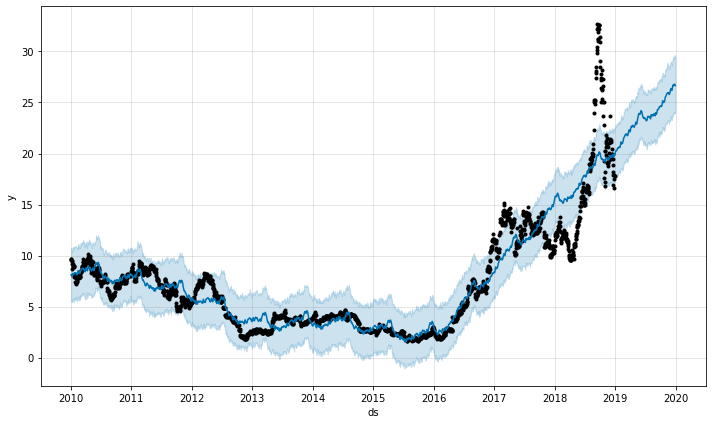

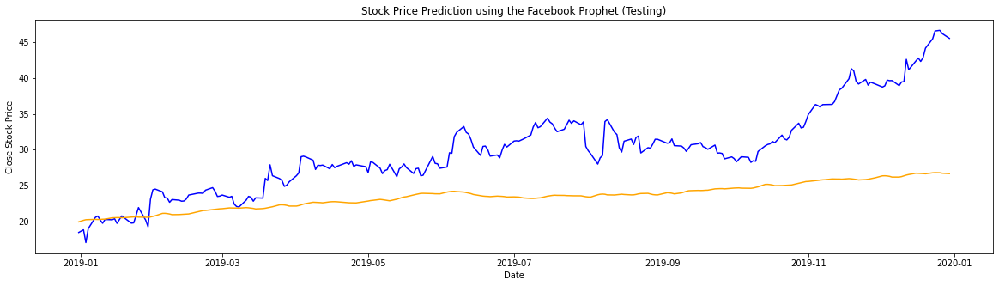

\CHANGEPOINTS PLOT

[[<matplotlib.lines.Line2D object at 0x7f5779820eb8>], <matplotlib.lines.Line2D object at 0x7f57777eb320>, <matplotlib.lines.Line2D object at 0x7f5779a45710>, <matplotlib.lines.Line2D object at 0x7f5779972d30>, <matplotlib.lines.Line2D object at 0x7f577772e1d0>, <matplotlib.lines.Line2D object at 0x7f577f83fbe0>, <matplotlib.lines.Line2D object at 0x7f57777cbda0>, <matplotlib.lines.Line2D object at 0x7f57777cb4e0>, <matplotlib.lines.Line2D object at 0x7f5779835f98>, <matplotlib.lines.Line2D object at 0x7f577f73c278>, <matplotlib.lines.Line2D object at 0x7f577df2e5c0>, <matplotlib.lines.Line2D object at 0x7f5777511780>, <matplotlib.lines.Line2D object at 0x7f57779dac88>, <matplotlib.lines.Line2D object at 0x7f5777917a90>]


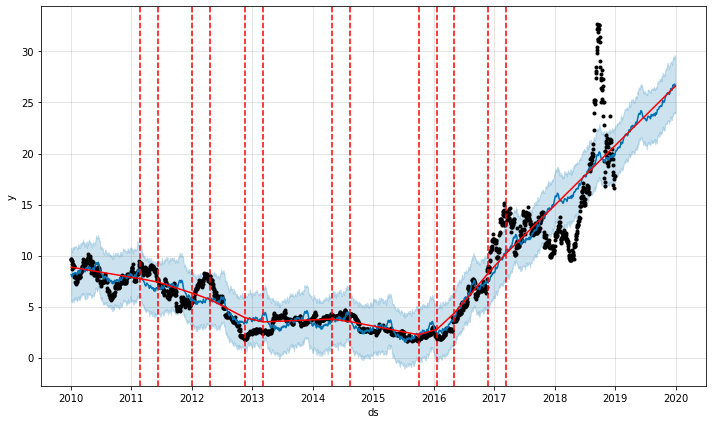

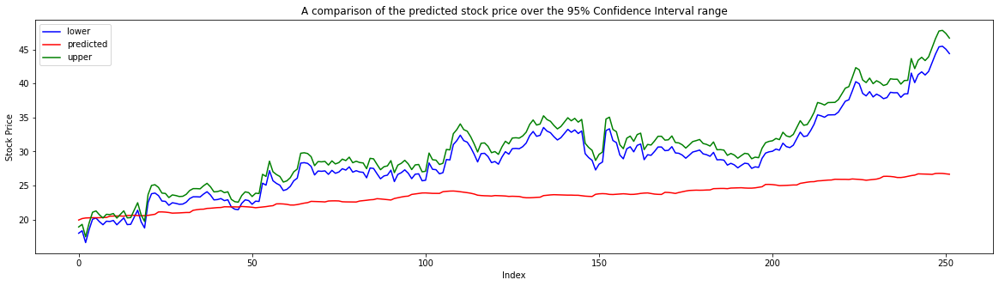

INFO:fbprophet:Found custom seasonality named 'weekly', disabling built-in 'weekly' seasonality.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.





Test 33



This forecast is based on the following parameters:
Number of changepoints = 25
Changepoint range = 0.8
Changepoint prior scale = 0.05
Seasonality type = weekly
Seasonality period = 5
Fourier order = 1
Forecast period = 367


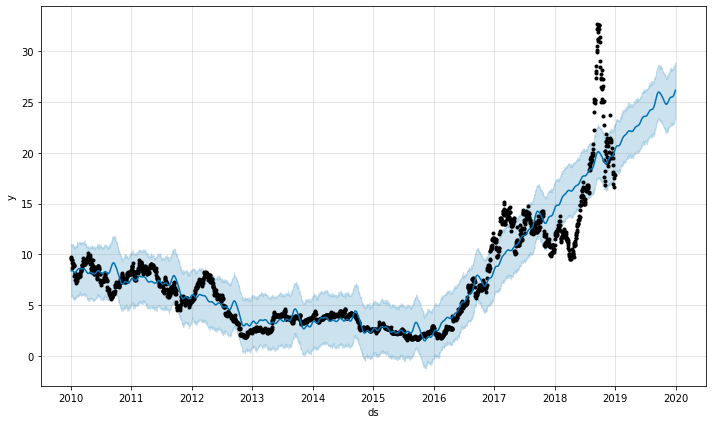

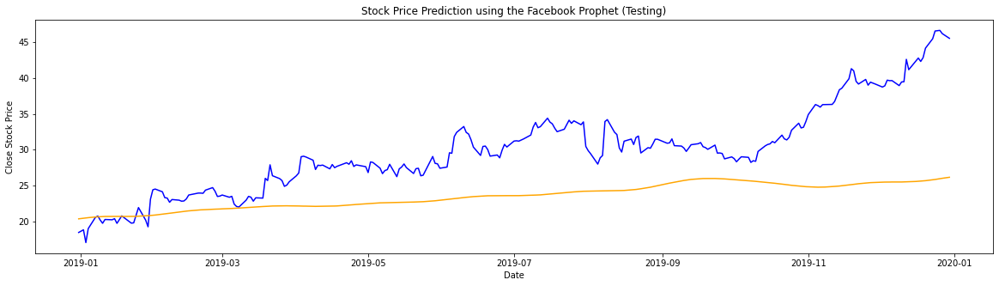

\CHANGEPOINTS PLOT

[[<matplotlib.lines.Line2D object at 0x7f577979d9e8>], <matplotlib.lines.Line2D object at 0x7f577982e898>, <matplotlib.lines.Line2D object at 0x7f577982ec50>, <matplotlib.lines.Line2D object at 0x7f5777897908>, <matplotlib.lines.Line2D object at 0x7f5777897a20>, <matplotlib.lines.Line2D object at 0x7f5777897f28>, <matplotlib.lines.Line2D object at 0x7f5777966b38>, <matplotlib.lines.Line2D object at 0x7f5777966278>, <matplotlib.lines.Line2D object at 0x7f577982eeb8>, <matplotlib.lines.Line2D object at 0x7f57776697b8>, <matplotlib.lines.Line2D object at 0x7f5777966710>, <matplotlib.lines.Line2D object at 0x7f577f7811d0>, <matplotlib.lines.Line2D object at 0x7f577f781d30>, <matplotlib.lines.Line2D object at 0x7f577f7815f8>, <matplotlib.lines.Line2D object at 0x7f577f781208>]


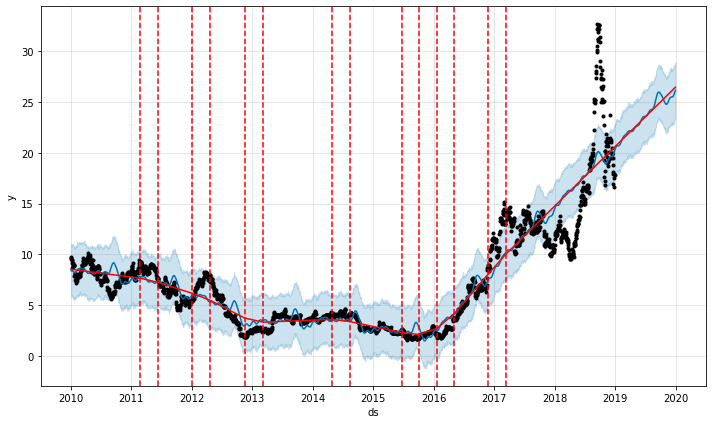

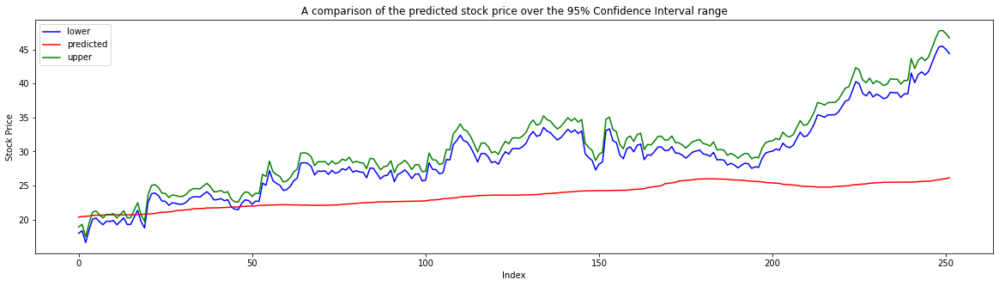

INFO:fbprophet:Found custom seasonality named 'weekly', disabling built-in 'weekly' seasonality.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.





Test 34



This forecast is based on the following parameters:
Number of changepoints = 25
Changepoint range = 0.8
Changepoint prior scale = 0.05
Seasonality type = weekly
Seasonality period = 5
Fourier order = 5
Forecast period = 367


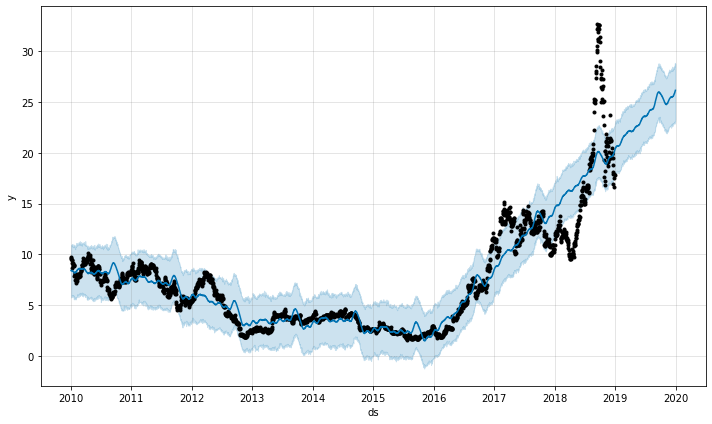

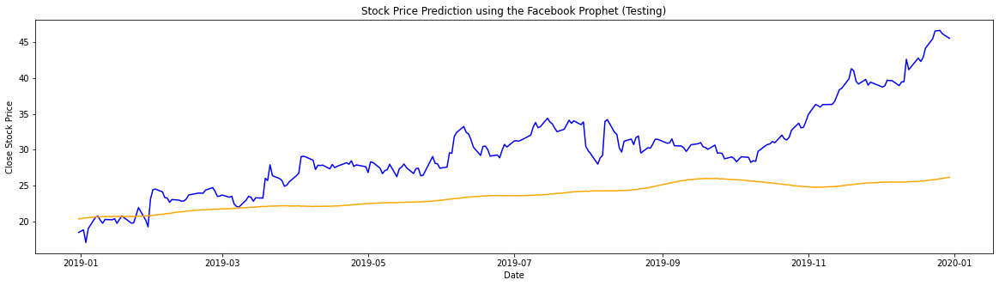

\CHANGEPOINTS PLOT

[[<matplotlib.lines.Line2D object at 0x7f57799c7cf8>], <matplotlib.lines.Line2D object at 0x7f57798df630>, <matplotlib.lines.Line2D object at 0x7f577792e3c8>, <matplotlib.lines.Line2D object at 0x7f577792e128>, <matplotlib.lines.Line2D object at 0x7f577792e978>, <matplotlib.lines.Line2D object at 0x7f5777a686d8>, <matplotlib.lines.Line2D object at 0x7f57775230f0>, <matplotlib.lines.Line2D object at 0x7f5777523390>, <matplotlib.lines.Line2D object at 0x7f57797a9240>, <matplotlib.lines.Line2D object at 0x7f5777892fd0>, <matplotlib.lines.Line2D object at 0x7f57778ca358>, <matplotlib.lines.Line2D object at 0x7f5777a02128>, <matplotlib.lines.Line2D object at 0x7f577791fcc0>, <matplotlib.lines.Line2D object at 0x7f5779a83780>, <matplotlib.lines.Line2D object at 0x7f57779ef438>]


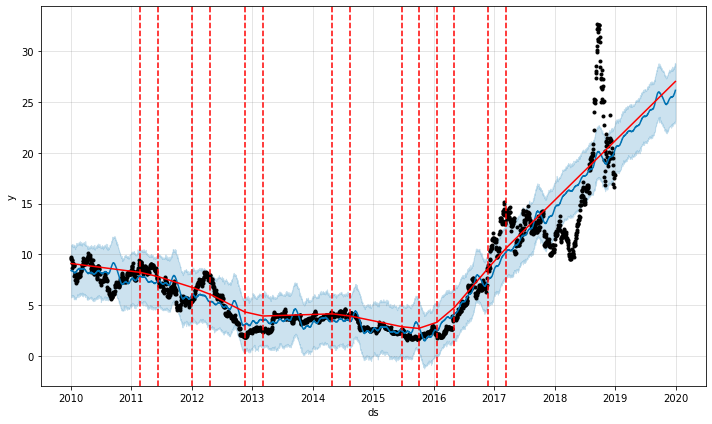

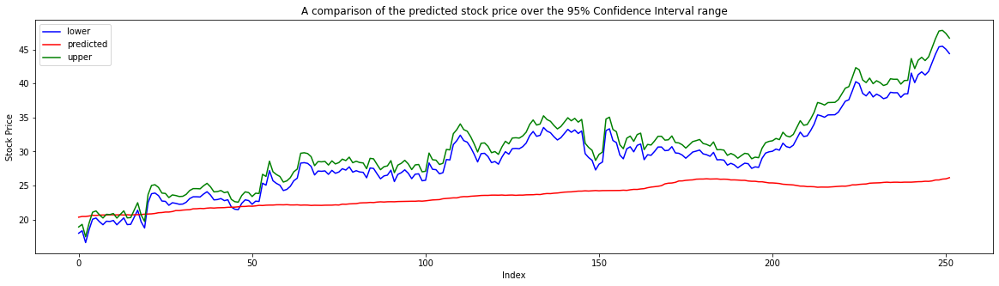

INFO:fbprophet:Found custom seasonality named 'weekly', disabling built-in 'weekly' seasonality.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.





Test 35



This forecast is based on the following parameters:
Number of changepoints = 25
Changepoint range = 0.8
Changepoint prior scale = 0.05
Seasonality type = weekly
Seasonality period = 5
Fourier order = 10
Forecast period = 367


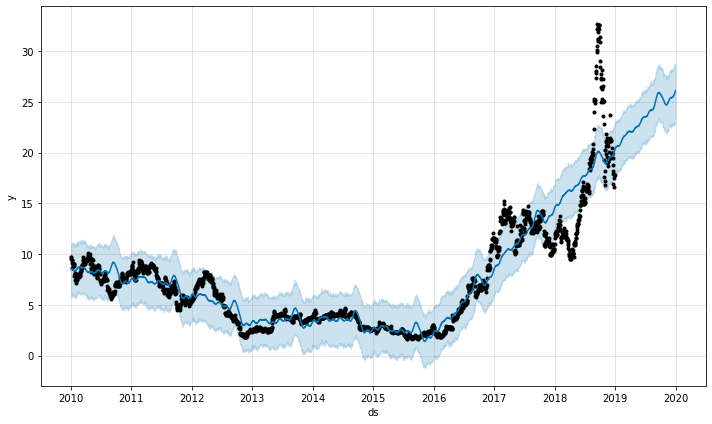

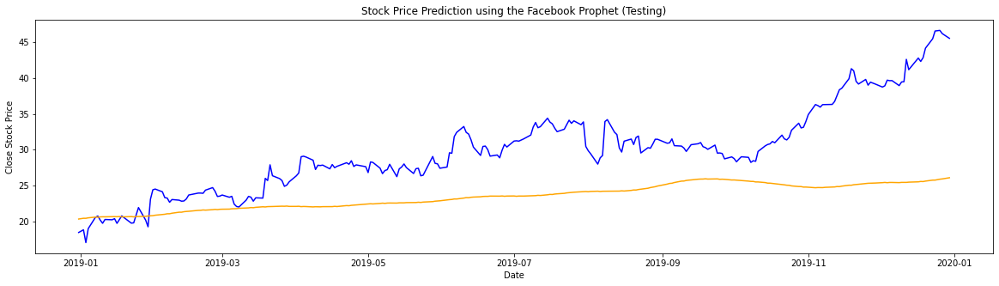

\CHANGEPOINTS PLOT

[[<matplotlib.lines.Line2D object at 0x7f57778c2160>], <matplotlib.lines.Line2D object at 0x7f577766c390>, <matplotlib.lines.Line2D object at 0x7f577766c160>, <matplotlib.lines.Line2D object at 0x7f577766c7f0>, <matplotlib.lines.Line2D object at 0x7f57778d1a20>, <matplotlib.lines.Line2D object at 0x7f57778d1080>, <matplotlib.lines.Line2D object at 0x7f57778d14a8>, <matplotlib.lines.Line2D object at 0x7f577766c400>, <matplotlib.lines.Line2D object at 0x7f577785c2e8>, <matplotlib.lines.Line2D object at 0x7f577772e5c0>, <matplotlib.lines.Line2D object at 0x7f577772ef28>, <matplotlib.lines.Line2D object at 0x7f577772e7f0>, <matplotlib.lines.Line2D object at 0x7f5777a046a0>, <matplotlib.lines.Line2D object at 0x7f5777a04c18>, <matplotlib.lines.Line2D object at 0x7f5777a04390>]


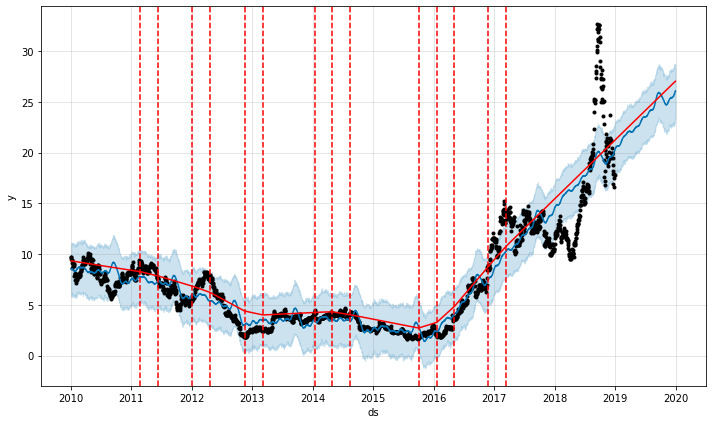

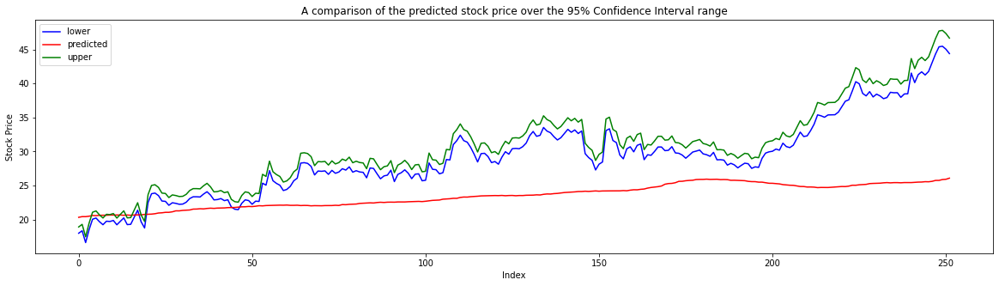

INFO:fbprophet:Found custom seasonality named 'weekly', disabling built-in 'weekly' seasonality.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.





Test 36



This forecast is based on the following parameters:
Number of changepoints = 25
Changepoint range = 0.8
Changepoint prior scale = 0.05
Seasonality type = weekly
Seasonality period = 5
Fourier order = 15
Forecast period = 367


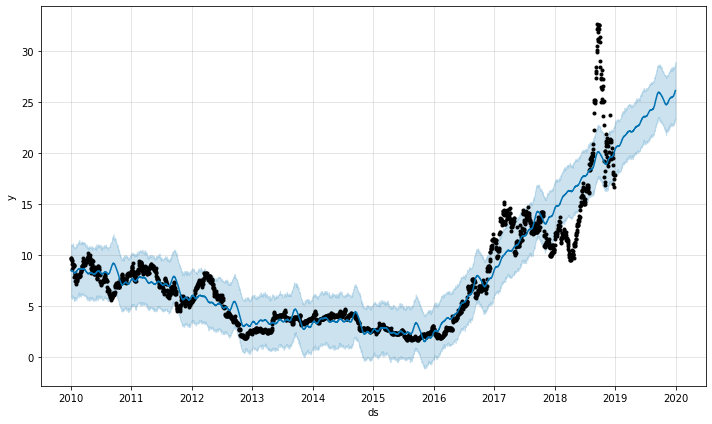

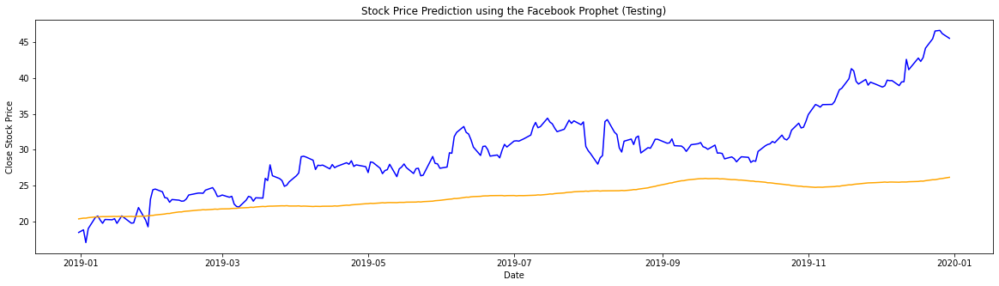

\CHANGEPOINTS PLOT

[[<matplotlib.lines.Line2D object at 0x7f57799d6ba8>], <matplotlib.lines.Line2D object at 0x7f577784e438>, <matplotlib.lines.Line2D object at 0x7f57799f6da0>, <matplotlib.lines.Line2D object at 0x7f57799c9940>, <matplotlib.lines.Line2D object at 0x7f57778804e0>, <matplotlib.lines.Line2D object at 0x7f5779a4a2b0>, <matplotlib.lines.Line2D object at 0x7f577994d400>, <matplotlib.lines.Line2D object at 0x7f57778a3358>, <matplotlib.lines.Line2D object at 0x7f57778bab38>, <matplotlib.lines.Line2D object at 0x7f57778f0dd8>, <matplotlib.lines.Line2D object at 0x7f577784ec18>, <matplotlib.lines.Line2D object at 0x7f57779da1d0>, <matplotlib.lines.Line2D object at 0x7f57797a9cc0>, <matplotlib.lines.Line2D object at 0x7f5779820f60>, <matplotlib.lines.Line2D object at 0x7f57779efcf8>, <matplotlib.lines.Line2D object at 0x7f577790e3c8>]


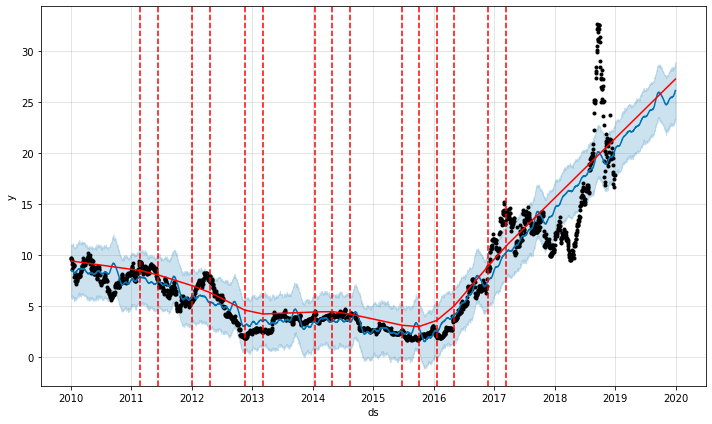

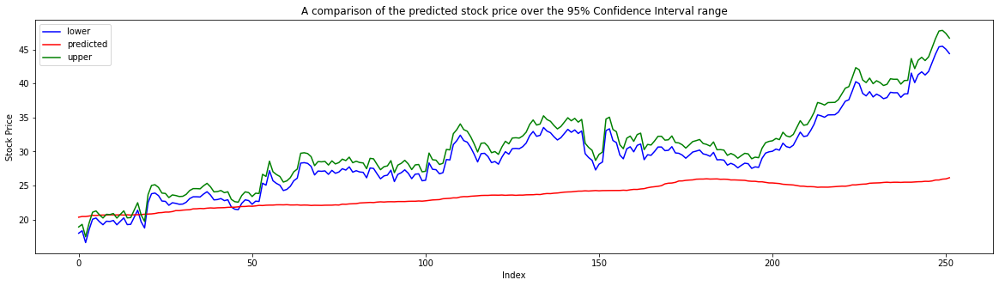

INFO:fbprophet:Found custom seasonality named 'weekly', disabling built-in 'weekly' seasonality.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.





Test 37



This forecast is based on the following parameters:
Number of changepoints = 25
Changepoint range = 0.8
Changepoint prior scale = 0.05
Seasonality type = weekly
Seasonality period = 5
Fourier order = 30
Forecast period = 367


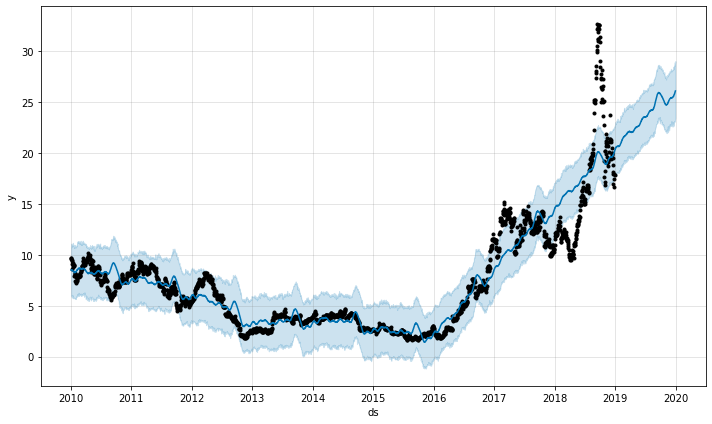

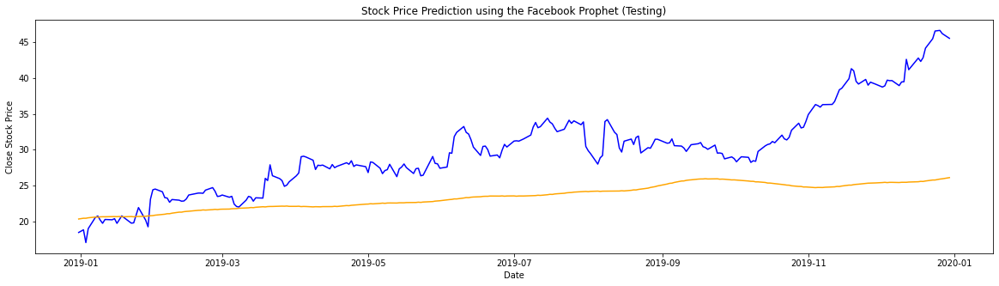

\CHANGEPOINTS PLOT

[[<matplotlib.lines.Line2D object at 0x7f57778c88d0>], <matplotlib.lines.Line2D object at 0x7f57777a16d8>, <matplotlib.lines.Line2D object at 0x7f57777a1940>, <matplotlib.lines.Line2D object at 0x7f57777a1160>, <matplotlib.lines.Line2D object at 0x7f5779870080>, <matplotlib.lines.Line2D object at 0x7f5779870cc0>, <matplotlib.lines.Line2D object at 0x7f5777539860>, <matplotlib.lines.Line2D object at 0x7f57775393c8>, <matplotlib.lines.Line2D object at 0x7f57777a1400>, <matplotlib.lines.Line2D object at 0x7f57797a0710>, <matplotlib.lines.Line2D object at 0x7f5777539f28>, <matplotlib.lines.Line2D object at 0x7f57777de860>, <matplotlib.lines.Line2D object at 0x7f57777de710>, <matplotlib.lines.Line2D object at 0x7f57777de160>, <matplotlib.lines.Line2D object at 0x7f5777a027f0>]


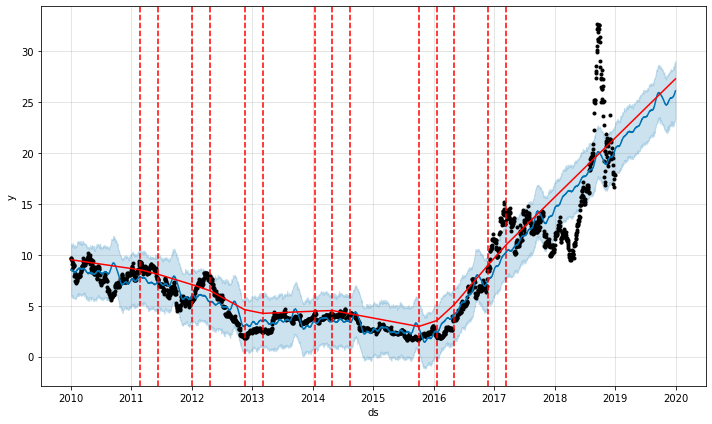

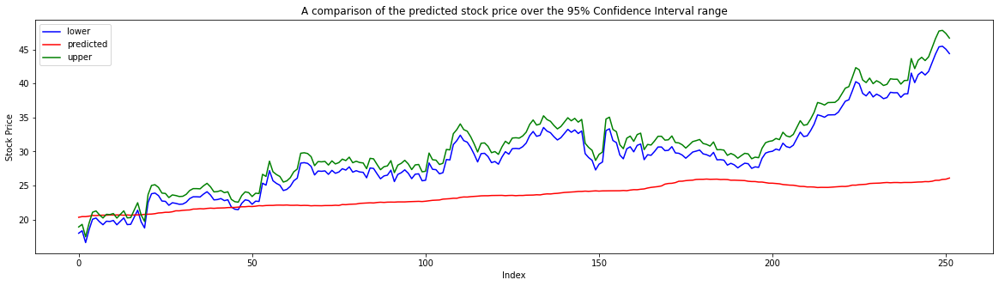

In [54]:
# seasonality parameters
n_change_1 = np.array([25,25,25,25,25,25,25,25,25,25,25,25,25,25,25])
change_range_1 = np.array([0.8,0.8,0.8,0.8,0.8,0.8,0.8,0.8,0.8,0.8,0.8,0.8,0.8,0.8,0.8])	
change_scale_1 = np.array([0.05,0.05,0.05,0.05,0.05,0.05,0.05,0.05,0.05,0.05,0.05,0.05,0.05,0.05,0.05])
name_1 = np.array(['monthly','monthly','monthly','monthly','monthly','yearly','yearly','yearly','yearly','yearly','weekly','weekly','weekly','weekly','weekly'])
seasonality_period_1 = np.array([21,21,21,21,21,252,252,252,252,252,5,5,5,5,5])
fourier_order_1 = np.array([1,5,10,15,30,1,5,10,15,30,1,5,10,15,30])

combined_1 = pd.DataFrame({"a": n_change_1, "b": change_range_1, "c":change_scale_1,"d": name_1,"e": seasonality_period_1,"f": fourier_order_1})

m = 23

for a,b,c,d,e,f in combined_1[['a', 'b','c','d','e','f']].itertuples(index=False):
  print('\n\n\nTest ' + str(m) + '\n\n\n')
  forecast, test_mae, test_mse, test_rmse,test_r2,test_mape,test_accuracy,test_ci_accuracy = fit_custom_prophet(train, test,a,b,c,d,e,f,period)  
  df3 = pd.DataFrame({"MAE":[test_mae], 
                    "MSE":[test_mse],
                    "RMSE":[test_rmse],
                    "MAPE":[test_mape],
                    "R2":[test_r2],
                    "CI":[test_ci_accuracy],
                    "Trend":[test_accuracy]}, index = ['test']) 
  metrics_result = metrics_result.append(df3)
  m += 1

In [55]:
metrics_result

,MAE,MSE,RMSE,MAPE,R2,CI,Trend
test,6.42,61.35,7.83,19.61,-0.75,3.97,48.61
test,6.07,56.05,7.49,18.52,-0.6,3.17,47.81
test,6.51,62.8,7.92,19.93,-0.8,4.37,47.41
test,3.19,14.35,3.79,11.48,0.59,11.11,52.99
test,22.5,670.09,25.89,69.98,-18.17,0.40,45.02
test,6.03,55.52,7.45,18.4,-0.59,3.17,47.81
test,6.47,62.07,7.88,19.77,-0.78,4.37,47.41
test,3.2,14.43,3.8,11.53,0.59,11.11,52.99
test,20.25,548.53,23.42,62.8,-14.69,0.40,43.82
test,5.78,52.03,7.21,17.57,-0.49,3.97,49.00


INFO:fbprophet:Found custom seasonality named 'weekly', disabling built-in 'weekly' seasonality.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


This forecast is based on the following parameters:
Number of changepoints = 8
Changepoint range = 1
Changepoint prior scale = 0.05
Seasonality type = weekly
Seasonality period = 5
Fourier order = 1
Forecast period = 88


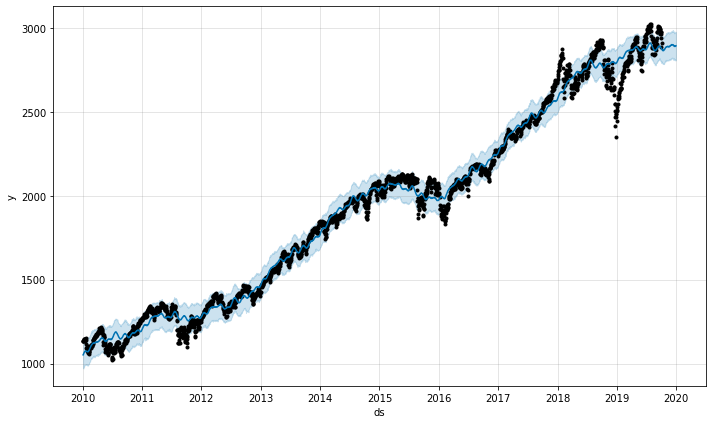

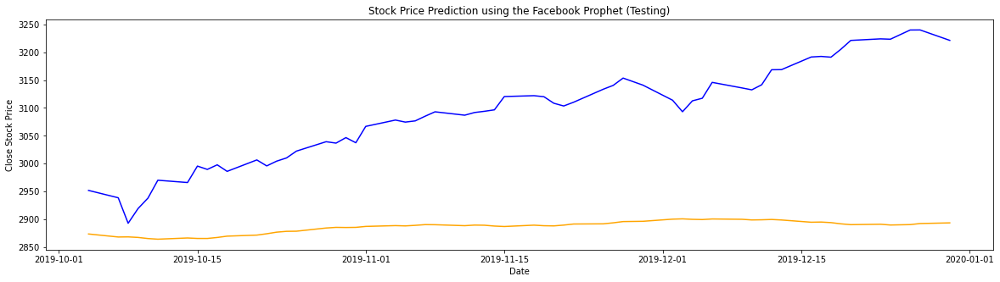

\CHANGEPOINTS PLOT

[[<matplotlib.lines.Line2D object at 0x7f5777672e48>], <matplotlib.lines.Line2D object at 0x7f577767a080>, <matplotlib.lines.Line2D object at 0x7f5777688e10>, <matplotlib.lines.Line2D object at 0x7f5777688668>, <matplotlib.lines.Line2D object at 0x7f57776889b0>, <matplotlib.lines.Line2D object at 0x7f57798d5278>, <matplotlib.lines.Line2D object at 0x7f57798d5da0>]


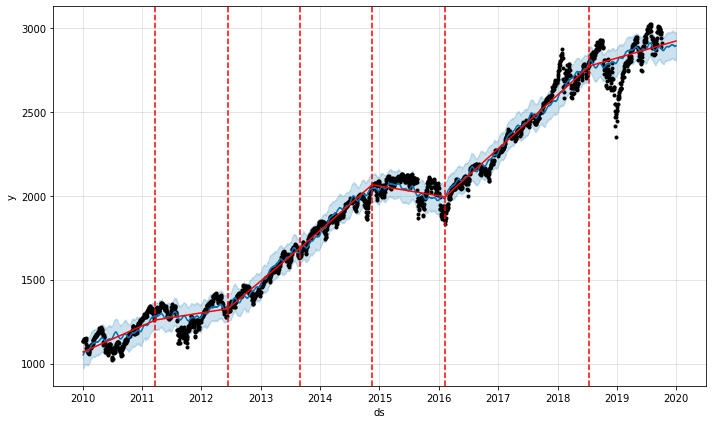

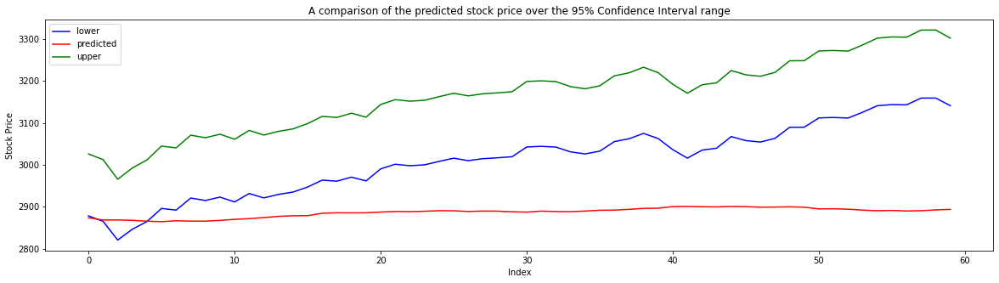

        MAE       MSE    RMSE  MAPE     R2    CI  Trend
test  202.2  46857.62  216.47  6.48  -5.33  6.67  55.93


In [80]:
# combining changepoints + seasonality to see if can get a better result
metrics_result = pd.DataFrame(columns = ['MAE','MSE','RMSE','MAPE','R2','CI','Trend']) 

forecast, test_mae, test_mse, test_rmse,test_r2,test_mape,test_accuracy,test_ci_accuracy= fit_custom_prophet(train, test,8,1,0.05,'yearly',252,1,period)  
df2 = pd.DataFrame({"MAE":[test_mae], 
                    "MSE":[test_mse],
                    "RMSE":[test_rmse],
                    "MAPE":[test_mape],
                    "R2":[test_r2],
                    "CI":[test_ci_accuracy],
                    "Trend":[test_accuracy]}, index = ['test']) 
metrics_result = metrics_result.append(df2)


print(metrics_result)